# LAPTOP PRICE PREDICTION

### PROBLEM STATEMENT


SmartTech Co., a leading laptop manufacturing company, has partnered with our data science team to build a robust machine learning model capable of accurately predicting laptop prices. In a highly competitive and feature-rich market, determining the optimal price for a laptop based on its specifications is critical for maximizing profitability and staying ahead in the industry.

### CLIENT OBJECTIVES


* **Accurate Pricing**: Develop a predictive model that estimates laptop prices based on technical and categorical features to support competitive pricing strategies.

* **Market Positioning**: Gain insights into how different specifications influence price, helping SmartTech Co. to strategically position its products in various market segments.

* **Brand Influence Analysis**: Evaluate the impact of brand reputation and perception on pricing trends to understand consumer behavior and market demand.

### KEY CHALLENGES

* **Specification Diversity**: The dataset includes laptops with a wide range of specifications, which poses a challenge in building a model that generalizes well across varying configurations.

* **Real-time Predictive Capability**: The model should be adaptable for predicting prices of newly launched laptops, keeping up with the rapidly evolving tech market.

* **Model Interpretability:** The solution must be interpretable and transparent, allowing SmartTech Co. to understand the reasoning behind each prediction and make informed business decisions.

## I. IMPORTING LIBRARIES

In [194]:
# Libraries for data exploration and ploting 
import numpy as np  # Initial use III. data cleaning --> 3.improving data quality --> D) cleaning memory feature np.nan
import pandas as pd # Initial use II. data exploration --> pd.read(....)
np.random.seed(42)
import matplotlib.pyplot as plt # Initial use III. data cleaning --> 6. outlier treatmen --> plt.figure()
import re # Inital use III. data cleaning --> 3.improving data quality --> D) cleaning memory feature re.search(....)
%matplotlib inline
import seaborn as sns # Inital use  III. data cleaning --> 6. outlier treatment --> sns.boxplot()

import warnings 
warnings.filterwarnings('ignore') #--> comment this line to see the warnings raised 

In [195]:
# Libraries used for Hypothesis testing 
from scipy.stats import spearmanr,pearsonr # Initial use V. feature engineering -->2. hypothesis testing --> A) corr analysis
from scipy.stats import shapiro # Initial use V. feature engineering -->2. hypothesis testing --> A) corr analysis 
from scipy.stats import levene # Initial use V. feature engineering -->2. hypothesis testing --> B) ttest
from scipy.stats import ttest_ind # Initial use V. feature engineering -->2. hypothesis testing --> B) ttest
from scipy.stats import f_oneway # Initial use V. feature engineering -->2. hypothesis testing --> C) anova test 
import pingouin as pg # Initial use V. feature engineering -->2. hypothesis testing --> C) anova test --> pg.welch_anova(.....)

In [196]:
# Machine Learning Libraries
from sklearn.preprocessing import OrdinalEncoder # Initial use VI. initial assessment --> 1.encoding 
from sklearn.preprocessing import StandardScaler #Inital use VI. initial assessment --> 3.scaling 
from sklearn.model_selection import train_test_split #Inital use VI. initial assessment --> 4.data partitioning
from sklearn.linear_model import LinearRegression #Initial use VI. initial assessment --> 5.model selection
from sklearn.neighbors import KNeighborsRegressor #Initial use VI. initial assessment --> 5.model selection
from sklearn.tree import DecisionTreeRegressor #Initial use VI. initial assessment --> 5.model selection
from sklearn.ensemble import RandomForestRegressor #Initial use VI. initial assessment --> 5.model selection
from sklearn.svm import SVR #Initial use VI. initial assessment --> 5.model selection
from xgboost import XGBRegressor #Initial use VI. initial assessment --> 5.model selection
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error #Initial use VI. initial assessment --> 5.model selection
from sklearn.model_selection import cross_val_score,cross_validate # Initial use VI. initial assessment --> 6.graphical representation

from sklearn.model_selection import KFold # Initial use VII. preparing data --> 1. encoding --> b. leakage free target mean encoding


from sklearn.feature_selection import RFE # Initial use VIII. comprehensive feature selection --> 1. wrapper method
from sklearn.model_selection import cross_validate # Initial use VIII. comprehensive feature selection --> 1. wrapper method
from sklearn.inspection import permutation_importance # Initial use VIII. comprehensive feature selection --> 2. feature importance analysis --> C) permutation importance
import shap # Initial use VIII. comprehensive feature selection --> 2. feature importance analysis --> D) shapely additive explanantion 

from sklearn.model_selection import GridSearchCV # Initial use IX. model implementation --> 1. hyperparameter tuning 
from sklearn.model_selection import StratifiedKFold # Initial use IX. model implementation --> 2. model training & evaluation
from sklearn.inspection import PartialDependenceDisplay # Initial use IX. model implementation --> 3. model interpretation --> D) partial....
from xgboost import plot_tree # Initial use IX. model implementation --> 3. model interpretation --> E) Tree plot 



In [197]:
# Model saving and interface
import joblib # Initial use X. saving,loading and verifying the model -->1.saving the model 
import gradio as gr # Initial use XI MODEL INTERFACE

## II. DATA LOADING &  EXPLORARTION

In [198]:
df = pd.read_csv("laptop.csv")
print(df.shape)
df.head()

(1303, 13)


,Unnamed: 0.1,Unnamed: 0,Company,TypeName,Inches,ScreenResolution,Cpu,Ram,Memory,Gpu,OpSys,Weight,Price
0,0,0.0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8GB,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37kg,71378.6832
1,1,1.0,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,47895.5232
2,2,2.0,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8GB,256GB SSD,Intel HD Graphics 620,No OS,1.86kg,30636.0000
3,3,3.0,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16GB,512GB SSD,AMD Radeon Pro 455,macOS,1.83kg,135195.3360
4,4,4.0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8GB,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37kg,96095.8080


In [199]:
# i don't need first 2 columns removing them 
try:
    df = df.drop(columns = ['Unnamed: 0.1','Unnamed: 0'])
    df.columns = df.columns.str.lower()
    print('The unnecessary columns are removed')
except: 
    print('Error raised because the columns are already removed')
print(df.shape)
df.head()

The unnecessary columns are removed
(1303, 11)


,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8GB,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37kg,71378.6832
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,47895.5232
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8GB,256GB SSD,Intel HD Graphics 620,No OS,1.86kg,30636.0000
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16GB,512GB SSD,AMD Radeon Pro 455,macOS,1.83kg,135195.3360
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8GB,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37kg,96095.8080


In [200]:
# info of the columns to find null objects 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1303 entries, 0 to 1302
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   company           1273 non-null   object 
 1   typename          1273 non-null   object 
 2   inches            1273 non-null   object 
 3   screenresolution  1273 non-null   object 
 4   cpu               1273 non-null   object 
 5   ram               1273 non-null   object 
 6   memory            1273 non-null   object 
 7   gpu               1273 non-null   object 
 8   opsys             1273 non-null   object 
 9   weight            1273 non-null   object 
 10  price             1273 non-null   float64
dtypes: float64(1), object(10)
memory usage: 112.1+ KB


In [201]:
# descriptive stats 
df.describe()

,price
count,1273.000000
mean,59955.814073
std,37332.251005
min,9270.720000
25%,31914.720000
50%,52161.120000
75%,79333.387200
max,324954.720000


**OBSERVATIONS:**
1. Column Summary:

    * The dataset contains 11 columns in total.

    * Based on the business objective, price is the dependent variable (target), and the other 10 columns are independent variables (features).

2. Data Types (based on business logic):

    * Categorical (Nominal): `company, typename, opsys, cpu, gpu`

    * Continuous Numerical: `inches, weight, price`

    * Discrete Numerical: `ram, memory` – with Memory potentially split further based on storage type (e.g., SSD, HDD).

    * Derived Continuous Feature: `screenresolution` → to extract ppi (Pixels Per Inch) later.

3. Data Type Mismatch:

    * All columns (except price) are stored as object type in the DataFrame.

    * This requires conversion to appropriate data types (e.g., numerical, categorical) for analysis and modeling.

4. Null Values Insight:

    * Although .info() shows 30 missing entries per column, these missing values are uniform across all columns.

    * This suggests that the last 30 rows of the dataset are completely empty, likely due to blank rows present at the bottom of the CSV file, rather than partial missing values within the data.
5. Target Variable Description:
    * The standard deviation is ₹37K, which is ~60% of the mean (₹59K) — indicating high variability in laptop prices.
    * Median (₹52K) < Mean (₹59K) and the IQR is large (₹79K - ₹32K = ₹47K), with a maximum value of ₹325K.
    * These stats indicate a right-skewed distribution (not left), likely due to high-end outliers.
    * Further visual exploration and handling are addressed in the **Outlier Treatment** section.



## III. DATA CLEANING FOR EDA

### 1. HANDLING MISSING VALUES

In [202]:
# Once again checking the null value columns
print('Null values before treating:\n',df.isnull().sum())
# The rows which contains null values
df[df.isnull().any(axis=1)]


Null values before treating:
 company             30
typename            30
inches              30
screenresolution    30
cpu                 30
ram                 30
memory              30
gpu                 30
opsys               30
weight              30
price               30
dtype: int64


,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price
20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
115,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
148,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
190,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
209,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
267,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
336,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [203]:
# Dropping the null value rows 
df = df.dropna() 
print('Total Null values after treating: ',df.isnull().sum().sum())
print('Length of the dataframe',df.shape)
# resetting indeX
df = df.reset_index(drop = True)
df.head()

Total Null values after treating:  0
Length of the dataframe (1273, 11)


,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8GB,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37kg,71378.6832
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,47895.5232
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8GB,256GB SSD,Intel HD Graphics 620,No OS,1.86kg,30636.0000
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16GB,512GB SSD,AMD Radeon Pro 455,macOS,1.83kg,135195.3360
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8GB,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37kg,96095.8080


* As assumed it is clear that 30 rows are null rows but instead at the end of csv file the lies at various position 
* we have directly dropped the missing rows using (df.dropna()). The length of the dataframe after dropping null values is 1273 rows

### 2. DATA DEDUPLICATION

In [204]:
# Finding total duplicate rows
print('Total of original rows that have duplicates in the dataframe: ',df.duplicated(keep=False).sum()-df.duplicated().sum())
print('Total duplicate rows in the dataframe: ',df.duplicated().sum())
print('Total of original rows and their duplicates in the dataframe: ',df.duplicated(keep=False).sum())
# viewing which rows are duplicates including the original rows
df[df.duplicated(keep=False)].sort_values(by = ['company','typename','inches','cpu'])

Total of original rows that have duplicates in the dataframe:  14
Total duplicate rows in the dataframe:  29
Total of original rows and their duplicates in the dataframe:  43


,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price
1233,Acer,Notebook,15.6,1366x768,Intel Celeron Dual Core N3060 1.6GHz,4GB,500GB HDD,Intel HD Graphics 400,Linux,2.4kg,15397.9200
1247,Acer,Notebook,15.6,1366x768,Intel Celeron Dual Core N3060 1.6GHz,4GB,500GB HDD,Intel HD Graphics 400,Linux,2.4kg,15397.9200
1261,Acer,Notebook,15.6,1366x768,Intel Celeron Dual Core N3060 1.6GHz,4GB,500GB HDD,Intel HD Graphics 400,Linux,2.4kg,15397.9200
1144,Asus,Notebook,15.6,1366x768,Intel Celeron Dual Core N3050 1.6GHz,4GB,500GB HDD,Intel HD Graphics,Windows 10,2.2kg,19660.3200
1244,Asus,Notebook,15.6,1366x768,Intel Celeron Dual Core N3050 1.6GHz,4GB,500GB HDD,Intel HD Graphics,Windows 10,2.2kg,19660.3200
1258,Asus,Notebook,15.6,1366x768,Intel Celeron Dual Core N3050 1.6GHz,4GB,500GB HDD,Intel HD Graphics,Windows 10,2.2kg,19660.3200
1272,Asus,Notebook,15.6,1366x768,Intel Celeron Dual Core N3050 1.6GHz,4GB,500GB HDD,Intel HD Graphics,Windows 10,2.2kg,19660.3200
1239,Asus,Notebook,15.6,1366x768,Intel Core i7 6500U 2.5GHz,4GB,500GB HDD,Nvidia GeForce 920M,Windows 10,2.2kg,38378.6496
1253,Asus,Notebook,15.6,1366x768,Intel Core i7 6500U 2.5GHz,4GB,500GB HDD,Nvidia GeForce 920M,Windows 10,2.2kg,38378.6496
1267,Asus,Notebook,15.6,1366x768,Intel Core i7 6500U 2.5GHz,4GB,500GB HDD,Nvidia GeForce 920M,Windows 10,2.2kg,38378.6496


In [205]:
# The above duplicates need to be dropped
df = df.drop_duplicates() 
print('Total duplicate values in the dataframe after cleaning: ',df.duplicated().sum())
print('Length of the dataframe',df.shape)
# resetting indeX
df = df.reset_index(drop = True)
df.head()

Total duplicate values in the dataframe after cleaning:  0
Length of the dataframe (1244, 11)


,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8GB,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37kg,71378.6832
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,47895.5232
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8GB,256GB SSD,Intel HD Graphics 620,No OS,1.86kg,30636.0000
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16GB,512GB SSD,AMD Radeon Pro 455,macOS,1.83kg,135195.3360
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8GB,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37kg,96095.8080


In [206]:
# Finding total number of price conflict rows
print('total of original rows and duplicate rows excluding price column',df[df.columns.difference(['price'])].duplicated(keep=False).sum())
print('total of duplicate rows excluding price column',df.drop('price',axis=1).duplicated().sum())
print('total of original rows that have duplicates with varying prices',df.drop('price',
                        axis=1).duplicated(keep=False).sum() - df.drop('price',axis=1).duplicated().sum())

# Finding duplicates excluding price column (price conflict rows)
duplicates_all_except_price = df[df.duplicated(subset=df.columns.difference(['price']), keep=False)]

# Group by all columns except 'Price' and filtering groups with multiple different 'Price' values
price_conflicts = (
    duplicates_all_except_price
    .groupby(list(df.columns.difference(['price'])))
    .filter(lambda x: x['price'].nunique() > 1)
)

# sorting the results for better understanding
price_conflicts = price_conflicts.sort_values(by=list(df.columns))


total of original rows and duplicate rows excluding price column 78
total of duplicate rows excluding price column 39
total of original rows that have duplicates with varying prices 39


In [207]:
# cols except price
group_cols = list(df.columns.difference(['price']))

# Computing price range within each group and pride difference to see how much amount is differing between price conflict rows
price_range = df.groupby(group_cols)['price'].agg(['min', 'max']).reset_index()
price_range['price_diff'] = price_range['max'] - price_range['min']
price_range[price_range['price_diff']!=0]['price_diff'].describe()

count       39.000000
mean      5905.883077
std       4857.536146
min        137.995200
25%       2492.704800
50%       4488.307200
75%       8398.792800
max      16783.200000
Name: price_diff, dtype: float64

In [208]:
# Threshold for price conflict so that our ML model doesn't confuse and provide worse results
threshold = 3000  

# Split groups based on threshold
mild_conflict_groups = price_range[price_range['price_diff'] <= threshold][group_cols]
high_conflict_groups = price_range[price_range['price_diff'] > threshold][group_cols]
print(f'Total groups (unique rows excluding price) whose price conflict is less than {threshold} rs/- : ',len(mild_conflict_groups))
print(f'Total groups (unique rows excluding price) whose price conflict is greater than {threshold} rs/- : ',len(high_conflict_groups))

# Keep mild conflicts as-is
df_mild = df.merge(mild_conflict_groups, on=group_cols, how='inner')
print(len(df_mild))

# Aggregate high conflict groups (e.g., take median price and first of other features)
df_high = df.merge(high_conflict_groups, on=group_cols, how='inner')


df_high_agg = df_high.groupby(group_cols).agg({
    'price': 'median', # in our case even mean works as there are only two price conflict rows for each group (39*2)
}).reset_index()
df_high_agg

# Combine both data frames
df = pd.concat([df_mild, df_high_agg], ignore_index=True)
print('Length of the dataframe',df.shape)

# resetting indeX
df = df.reset_index(drop = True)
df.head()

Total groups (unique rows excluding price) whose price conflict is less than 3000 rs/- :  1180
Total groups (unique rows excluding price) whose price conflict is greater than 3000 rs/- :  25
1194
Length of the dataframe (1219, 11)


,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8GB,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37kg,71378.6832
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,47895.5232
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8GB,256GB SSD,Intel HD Graphics 620,No OS,1.86kg,30636.0000
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16GB,512GB SSD,AMD Radeon Pro 455,macOS,1.83kg,135195.3360
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8GB,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37kg,96095.8080


In [209]:
# # use this code cell for completely removing price conflict columns
# df = (
#     df.groupby(df.columns.difference(['price']).tolist())
#       .agg({'price': 'median'})  # or mean
#       .reset_index()
# )
# print('Length of the dataframe',df.shape)
# # resetting indeX
# df = df.reset_index(drop = True)
# df.head()

**📌 OBSERVATIONS ON DUPLICATES AND PRICE CONFLICTS**

1. 🔁 Duplicates
- A total of **29 duplicate rows** were identified across **14 unique instances** (i.e., duplicate groups).
- These were removed using `df.drop_duplicates()`, ensuring that **exact row-level duplicates** (including price) are eliminated.

---

2. 🔀 Price Conflicts (Feature Duplicates with Varying Prices)
- Price conflicts refer to rows with **identical features** but **different prices**.
- After thorough inspection, most price differences were **minor and within acceptable limits**, though a few rows showed **significant variation**.
- Based on this, a decision was made to **partially retain** and **partially aggregate** the conflicting rows using a **hybrid approach**.

---

**✅ Pros of Keeping Price Conflicts**
- The model becomes **more robust** to natural price fluctuations and noise.
- Retaining variations can help the model **generalize better** to real-world market variability.
- Captures the **imperfect nature of real-world pricing**, improving applicability in production environments.

---

**⚠️ Cons of Keeping Price Conflicts**
- Conflicting prices for identical features may **confuse the model**, reducing its ability to learn a clear price-function mapping.
- Increased **error variance** due to spread in target values can negatively impact **RMSE/MAE**.
- The model may **overfit to one version** of a conflicting row, especially if both versions are present across train and validation/test splits.
- **Data leakage risk** arises if near-duplicate rows are split across training and test sets, leading to **artificially high performance**.

---

**⚖️ Hybrid Conflict Resolution Strategy**
- Out of **39 price conflict groups** (totaling **78 rows**):
  - **25 groups** had a **price difference > ₹3000** — these were **aggregated using the median price**.
  - **14 groups** had a **price difference ≤ ₹3000** — these were **retained as-is**, as the variation is considered within acceptable noise limits.
- The threshold of ₹3000 was chosen based on the 25th percentile (₹2492), ensuring we focus aggregation on conflicts with more than mild price variation.

---

**📊 Final Data Shape**
- Original rows: **1273**
- Rows removed due to exact duplicates: **29**
- Rows removed due to price conflict aggregation: **25**
- **Final dataset size: 1219 rows**

### 3. DATA QUALITY FIXES & FEATURE EXTRACTION

In [210]:
# Making a copy so that any modifications will not make changes in the original df 
df_edit = df.copy()
df_edit.head()

,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8GB,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37kg,71378.6832
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,47895.5232
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8GB,256GB SSD,Intel HD Graphics 620,No OS,1.86kg,30636.0000
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16GB,512GB SSD,AMD Radeon Pro 455,macOS,1.83kg,135195.3360
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8GB,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37kg,96095.8080


#### A) CLEANING `Inches` FEATURE

In [211]:
# Inches column 
print('Unique values in Inches column: \n',df_edit['inches'].unique(),'\n')

Unique values in Inches column: 
 ['13.3' '15.6' '15.4' '14' '12' '17.3' '13.5' '12.5' '13' '18.4' '13.9'
 '11.6' '25.6' '35.6' '12.3' '27.3' '24' '33.5' '?' '31.6' '17' '15'
 '14.1' '11.3' '10.1'] 



In [212]:
# There is an unusual data among the Inches column
print("Rows that contain unusal data: ")
df_edit[df_edit['inches']=='?']

Rows that contain unusal data: 


,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price
444,Dell,Workstation,?,Full HD 1920x1080,Intel Core i7 7700HQ 2.8GHz,8GB,256GB SSD,Nvidia Quadro M1200,Windows 10,1.78kg,128298.24


In [213]:
# imputing the Mode value 
dell_workstation_inches_mode = df_edit[(df_edit['company']=='Dell')&(df_edit['typename']=='Workstation')]['inches'].mode()[0]

# replacing the '?' with  mode value obtained from earlier
df_edit['inches'] = df_edit['inches'].replace({"?":dell_workstation_inches_mode})



# Converting the data type to float 
df_edit['inches'] = df_edit['inches'].astype('float')

#confirming the unique values once again
print('Unique values in Inches column after treatment: \n',df_edit['inches'].unique(),'\n')

print('inches column after type conversion to float: \n',df_edit['inches'])

Unique values in Inches column after treatment: 
 [13.3 15.6 15.4 14.  12.  17.3 13.5 12.5 13.  18.4 13.9 11.6 25.6 35.6
 12.3 27.3 24.  33.5 31.6 17.  15.  14.1 11.3 10.1] 

inches column after type conversion to float: 
 0       13.3
1       13.3
2       15.6
3       15.4
4       13.3
        ... 
1214    17.3
1215    17.3
1216    15.6
1217    15.6
1218    15.6
Name: inches, Length: 1219, dtype: float64


#### B) CLEANING `Weight` FEATURE

In [214]:
# Weight column 
print('Unique values in Weight column: \n',df_edit['weight'].unique(),'\n')

Unique values in Weight column: 
 ['1.37kg' '1.34kg' '1.86kg' '1.83kg' '2.1kg' '2.04kg' '1.3kg' '1.6kg'
 '2.2kg' '0.92kg' '1.22kg' '2.5kg' '1.62kg' '1.91kg' '2.3kg' '1.35kg'
 '1.88kg' '1.89kg' '1.65kg' '2.71kg' '1.2kg' '1.44kg' '2.8kg' '2kg'
 '2.65kg' '2.77kg' '3.2kg' '1.49kg' '2.4kg' '2.13kg' '2.43kg' '1.7kg'
 '1.4kg' '1.8kg' '1.9kg' '3kg' '1.252kg' '2.7kg' '2.02kg' '1.63kg'
 '1.96kg' '1.21kg' '2.45kg' '1.25kg' '1.5kg' '2.62kg' '1.38kg' '1.58kg'
 '1.85kg' '1.23kg' '2.16kg' '2.36kg' '7.2kg' '2.05kg' '1.32kg' '1.75kg'
 '0.97kg' '2.56kg' '1.48kg' '1.74kg' '1.1kg' '1.56kg' '2.03kg' '1.05kg'
 '5.4kg' '4.4kg' '1.90kg' '1.29kg' '2.0kg' '1.95kg' '2.06kg' '1.12kg'
 '3.49kg' '3.35kg' '2.23kg' '?' '4.42kg' '2.69kg' '2.37kg' '4.7kg' '3.6kg'
 '2.08kg' '4.3kg' '1.68kg' '1.41kg' '2.9kg' '4.14kg' '2.18kg' '2.24kg'
 '2.67kg' '4.1kg' '2.14kg' '1.36kg' '2.25kg' '2.15kg' '2.19kg' '2.54kg'
 '3.42kg' '5.8kg' '1.28kg' '2.33kg' '1.45kg' '2.79kg' '8.23kg' '1.26kg'
 '1.84kg' '0.0002kg' '2.6kg' '2.26kg' '3.25kg

In [215]:

# There is an unusual data among the Inches column
print("Rows that contain unusal data: \n",)
df_edit[df_edit['weight']=='?']

Rows that contain unusal data: 



,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price
195,Dell,Ultrabook,13.3,Full HD 1920x1080,Intel Core i7 8550U 1.8GHz,8GB,256GB SSD,Intel UHD Graphics 620,Windows 10,?,77202.72


In [216]:
dell_ultrabook_weight_mode = df_edit[(df_edit['company']=='Dell')&(df_edit['typename']=='Ultrabook')]['weight'].mode()[0]

# imputing the unknown with mode obtained from above
df_edit['weight'] = df_edit['weight'].replace({"?":dell_ultrabook_weight_mode})



# Removing the kg from the values and Converting the data type to float
try: 
    df_edit['weight'] = df_edit['weight'].str.replace("kg",'')
    print("Removed 'kg' string from weight column")
except: 
    print('Error raised as the column operation is already performed')

df_edit['weight'] = df_edit['weight'].astype('float')

print('Unique values in Weight column after treatment: \n',np.round(df_edit['weight'].unique(),2),'\n')
print('Weight column after type conversion to float: \n',round(df_edit["weight"],2))

Removed 'kg' string from weight column
Unique values in Weight column after treatment: 
 [ 1.37  1.34  1.86  1.83  2.1   2.04  1.3   1.6   2.2   0.92  1.22  2.5
  1.62  1.91  2.3   1.35  1.88  1.89  1.65  2.71  1.2   1.44  2.8   2.
  2.65  2.77  3.2   1.49  2.4   2.13  2.43  1.7   1.4   1.8   1.9   3.
  1.25  2.7   2.02  1.63  1.96  1.21  2.45  1.25  1.5   2.62  1.38  1.58
  1.85  1.23  2.16  2.36  7.2   2.05  1.32  1.75  0.97  2.56  1.48  1.74
  1.1   1.56  2.03  1.05  5.4   4.4   1.29  1.95  2.06  1.12  3.49  3.35
  2.23  4.42  2.69  2.37  4.7   3.6   2.08  4.3   1.68  1.41  2.9   4.14
  2.18  2.24  2.67  4.1   2.14  1.36  2.25  2.15  2.19  2.54  3.42  5.8
  1.28  2.33  1.45  2.79  8.23  1.26  1.84  0.    2.6   2.26  3.25  1.59
  1.13  1.42  1.78  1.15  1.27  1.43  2.31  1.16  1.64  2.17  1.47  3.78
  1.79  0.91  1.99  4.33  1.93  1.87  2.63  3.4   3.14  1.94  1.24  4.6
  4.5   8.4   2.73  1.39  2.29  2.59  2.94 11.1   1.14  3.8   6.2   3.31
  1.09  3.21  1.19  1.98  1.17  4.36  1.71

In [217]:
df_edit.loc[[201],:]

,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price
201,HP,Notebook,14.0,Full HD 1920x1080,Intel Core i7 8550U 1.8GHz,8GB,256GB SSD,Nvidia GeForce 930MX,Windows 10,1.63,54931.68


#### C) CLEANING `Ram` FEATURE

In [218]:
# Ram column 
print('Unique values in Ram column: \n',df_edit['ram'].unique(),'\n')

# Removing the GB from the values and Converting the data type to float
try:
    df_edit['ram'] = df_edit['ram'].str.replace("GB",'')
    print("Removed 'GB' string from ram column")
except:
    print('Error raised as the column operations has already been performed')

df_edit['ram'] = df_edit['ram'].astype('float')
print('Ram column after type conversion to int: \n',df_edit['ram'])

Unique values in Ram column: 
 ['8GB' '16GB' '4GB' '2GB' '12GB' '64GB' '6GB' '32GB' '24GB' '1GB'] 

Removed 'GB' string from ram column
Ram column after type conversion to int: 
 0        8.0
1        8.0
2        8.0
3       16.0
4        8.0
        ... 
1214    16.0
1215     8.0
1216     4.0
1217     8.0
1218     8.0
Name: ram, Length: 1219, dtype: float64


#### D) CLEANING `Memory` FEATURE

In [219]:
df_edit['memory'].unique()

array(['128GB SSD', '128GB Flash Storage', '256GB SSD', '512GB SSD',
       '500GB HDD', '256GB Flash Storage', '1TB HDD',
       '128GB SSD +  1TB HDD', '256GB SSD +  256GB SSD',
       '64GB Flash Storage', '32GB Flash Storage', '256GB SSD +  1TB HDD',
       '256GB SSD +  2TB HDD', '32GB SSD', '2TB HDD', '64GB SSD',
       '1.0TB Hybrid', '512GB SSD +  1TB HDD', '1TB SSD',
       '256GB SSD +  500GB HDD', '128GB SSD +  2TB HDD',
       '512GB SSD +  512GB SSD', '16GB SSD', '16GB Flash Storage',
       '512GB SSD +  256GB SSD', '512GB SSD +  2TB HDD',
       '64GB Flash Storage +  1TB HDD', '180GB SSD', '1TB HDD +  1TB HDD',
       '32GB HDD', '1TB SSD +  1TB HDD', '?', '512GB Flash Storage',
       '128GB HDD', '240GB SSD', '8GB SSD', '508GB Hybrid', '1.0TB HDD',
       '512GB SSD +  1.0TB Hybrid', '256GB SSD +  1.0TB Hybrid'],
      dtype=object)

In [220]:
df_edit[df_edit['memory']=='?']


,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price
714,Dell,Notebook,15.6,Full HD 1920x1080,Intel Core i7 7500U 2.7GHz,16.0,?,AMD Radeon R7 M445,Windows 10,2.3,62938.0656


In [221]:
dell_notebook_memory_mode =df_edit[(df_edit['company']=='Dell')&
                                    (df_edit['typename']=='Notebook')&
                                    (df_edit['ram']==16)]['memory'].mode()[0]
# Replacing '?' with mode of the data 
df_edit['memory'] = df_edit['memory'].replace({'?':dell_notebook_memory_mode})
df_edit.loc[[749],:]

,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price
749,Dell,Gaming,15.6,4K Ultra HD 3840x2160,Intel Core i7 7700HQ 2.8GHz,16.0,512GB SSD,Nvidia GeForce GTX 1050 Ti,Windows 10,2.62,89457.12


In [222]:
def clean_memory(memory):
    # if the data type doesn't match it return null values for that row
    if not isinstance(memory,str):
        return pd.Series([np.nan,np.nan,np.nan,np.nan,np.nan])
    # initialize column dictionary
    memory_dict = {"ssd":0,"hdd":0,"flash":0,"hybrid":0}
    dual_memory = 0

    # removing spaces and converting the memory string to lower case.
    memory = memory.replace(" ","").lower() 

    # spliting the string on + to verify dual memory 
    memory_list = memory.split("+") 
    if len(memory_list)>1:
        dual_memory = 1 

    # extracting memory size from the splitted list
    for memory_val in memory_list: 
       memory_match = re.search(r'[\d\.]+',memory_val)

       # if size matches converting the 'tb' to 'gb' and size to integer and storing into the initialized dictionary
       if memory_match: 
           memory_size = memory_match.group()
           memory_size = int(float(memory_size)*1024) if 'tb' in memory_val else int(memory_size) 
           for key in memory_dict: 
               if key in memory_val: 
                  memory_dict[key]+=memory_size 
                  
    return pd.Series([memory_dict['ssd'],memory_dict['hdd'],memory_dict['flash'],memory_dict['hybrid'],dual_memory])


In [223]:
df_edit[['ssd','hdd','flashstorage','hybrid','dual_memory']] = df_edit['memory'].apply(clean_memory)

In [224]:
df_edit.head()

,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,price,ssd,hdd,flashstorage,hybrid,dual_memory
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8.0,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,128,0,0,0,0
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8.0,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,0,128,0,0
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8.0,256GB SSD,Intel HD Graphics 620,No OS,1.86,30636.0000,256,0,0,0,0
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16.0,512GB SSD,AMD Radeon Pro 455,macOS,1.83,135195.3360,512,0,0,0,0
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8.0,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,256,0,0,0,0


In [225]:
# Displaying the values
print('Total SSD hard drive in dataset',len(df_edit[df_edit['ssd']!=0]),'\n',df_edit['ssd'].unique())
print('Total HDD hard drive in dataset',len(df_edit[df_edit['hdd']!=0]),'\n',df_edit['hdd'].unique())
print('Total Flash storage hard drive in dataset',len(df_edit[df_edit['flashstorage']!=0]),'\n',df_edit['flashstorage'].unique())
print('Total Flash storage hard drive in dataset',len(df_edit[df_edit['hybrid']!=0]),'\n',df_edit['hybrid'].unique())
print('Total dual hard drives in dataset',len(df_edit[df_edit['dual_memory']!=0]),'\n',df_edit['dual_memory'].unique())

Total SSD hard drive in dataset 800 
 [ 128    0  256  512   32   64 1024   16  768  180  240    8]
Total HDD hard drive in dataset 532 
 [   0  500 1024 2048   32  128]
Total Flash storage hard drive in dataset 68 
 [  0 128 256  64  32  16 512]
Total Flash storage hard drive in dataset 10 
 [   0 1024  508]
Total dual hard drives in dataset 196 
 [0 1]


#### E) CLEANING `ScreenResolution` FEATURE

In [226]:
df_edit['screenresolution'].unique()

array(['IPS Panel Retina Display 2560x1600', '1440x900',
       'Full HD 1920x1080', 'IPS Panel Retina Display 2880x1800',
       '1366x768', 'IPS Panel Full HD 1920x1080',
       'IPS Panel Retina Display 2304x1440',
       'IPS Panel Full HD / Touchscreen 1920x1080',
       'Full HD / Touchscreen 1920x1080',
       'Touchscreen / Quad HD+ 3200x1800', 'Touchscreen 2256x1504',
       'Quad HD+ / Touchscreen 3200x1800', 'IPS Panel 1366x768',
       'IPS Panel 4K Ultra HD / Touchscreen 3840x2160',
       'IPS Panel Full HD 2160x1440',
       '4K Ultra HD / Touchscreen 3840x2160', '1600x900',
       'IPS Panel 4K Ultra HD 3840x2160', '4K Ultra HD 3840x2160',
       'Touchscreen 1366x768', 'Touchscreen 2560x1440',
       'IPS Panel Full HD 1366x768', 'IPS Panel 2560x1440',
       'IPS Panel Full HD 2560x1440',
       'IPS Panel Retina Display 2736x1824', 'Touchscreen 2400x1600',
       '2560x1440', 'IPS Panel Quad HD+ 2560x1440',
       'IPS Panel Quad HD+ 3200x1800',
       'IPS Panel Qua

In [227]:
# Extracting features from screeresolution column
def extract_screen(resolution):
    resolution = resolution.lower()
    tech = "Unknown"
    is_touchscreen = 0

    if "ips" in resolution:
        tech = "IPS"
    elif "retina" in resolution:
        tech = "Retina"
    elif "full hd" in resolution or "1920x1080" in resolution:
        tech = "Full HD"
    if "touchscreen" in resolution:
        is_touchscreen = 1

    match = re.search(r'(\d+)x(\d+)', resolution)
    if match:
        width = int(match.group(1))
        height = int(match.group(2))
    else:
        width, height = np.nan, np.nan

    # Aspect Ratio
    aspect_ratio = round(width / height, 2) if width and height else np.nan

    return pd.Series([tech, width, height, aspect_ratio, is_touchscreen])

df_edit[['screen_tech', 'screen_width', 'screen_height', 'aspect_ratio', 'is_touchscreen']] = df_edit['screenresolution'].apply(extract_screen)

In [228]:
# Finding ppi using diagonal inches and screen width and height 

df_edit['ppi'] = round(((df_edit['screen_width']**2 + df_edit['screen_height']**2)**0.5)/df_edit['inches'],2)
df_edit.head()

,company,typename,inches,screenresolution,cpu,ram,memory,gpu,opsys,weight,...,hdd,flashstorage,hybrid,dual_memory,screen_tech,screen_width,screen_height,aspect_ratio,is_touchscreen,ppi
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8.0,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37,...,0,0,0,0,IPS,2560,1600,1.60,0,226.98
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8.0,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34,...,0,128,0,0,Unknown,1440,900,1.60,0,127.68
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8.0,256GB SSD,Intel HD Graphics 620,No OS,1.86,...,0,0,0,0,Full HD,1920,1080,1.78,0,141.21
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16.0,512GB SSD,AMD Radeon Pro 455,macOS,1.83,...,0,0,0,0,IPS,2880,1800,1.60,0,220.53
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8.0,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37,...,0,0,0,0,IPS,2560,1600,1.60,0,226.98


In [229]:
print(f'The total unique rows in the screen_width column: ',df_edit['screen_width'].nunique())
print(df_edit['screen_width'].unique())
print(f'The total unique rows in the screen_height column: ',df_edit['screen_height'].nunique())
print(df_edit['screen_height'].unique())
print(f'The total unique rows in the screen_tech column: ',df_edit['screen_tech'].nunique())
print(df_edit['screen_tech'].unique())
print(f'The total unique rows in the aspect_ratio column: ',df_edit['aspect_ratio'].nunique())
print(df_edit['aspect_ratio'].unique())
print(f'The total touchscreen models in the dataset:  ',df_edit['is_touchscreen'].sum())

The total unique rows in the screen_width column:  13
[2560 1440 1920 2880 1366 2304 3200 2256 3840 2160 1600 2736 2400]
The total unique rows in the screen_height column:  10
[1600  900 1080 1800  768 1440 1504 2160 1824 1200]
The total unique rows in the screen_tech column:  3
['IPS' 'Unknown' 'Full HD']
The total unique rows in the aspect_ratio column:  3
[1.6  1.78 1.5 ]
The total touchscreen models in the dataset:   176


#### F) CLEANING `Price` FEATURE

In [230]:
# Cleaning the target variable
df['price'] = pd.to_numeric(df['price'],errors='coerce')
df['price']

0        71378.6832
1        47895.5232
2        30636.0000
3       135195.3360
4        96095.8080
           ...     
1214     82365.5520
1215     77143.3128
1216     36816.4800
1217     58634.6400
1218     51255.3600
Name: price, Length: 1219, dtype: float64

#### G) EXPLORING REMAINING FEATURES

In [231]:
print('The total of unique rows in company column is: ',df_edit['company'].nunique())
print(df_edit['company'].unique())
df_edit['company'].value_counts()

The total of unique rows in company column is:  19
['Apple' 'HP' 'Acer' 'Asus' 'Dell' 'Lenovo' 'Chuwi' 'MSI' 'Microsoft'
 'Toshiba' 'Huawei' 'Xiaomi' 'Vero' 'Razer' 'Mediacom' 'Samsung' 'Google'
 'Fujitsu' 'LG']


company
Dell         278
Lenovo       273
HP           257
Asus         146
Acer          99
MSI           51
Toshiba       44
Apple         21
Samsung        9
Razer          7
Mediacom       7
Microsoft      6
Xiaomi         4
Vero           4
Chuwi          3
Google         3
LG             3
Huawei         2
Fujitsu        2
Name: count, dtype: int64

In [232]:
print('The total of unique rows in typename column is: ',df_edit['typename'].nunique())
print(df_edit['typename'].unique())
df_edit['typename'].value_counts()

The total of unique rows in typename column is:  6
['Ultrabook' 'Notebook' 'Gaming' '2 in 1 Convertible' 'Workstation'
 'Netbook']


typename
Notebook              677
Gaming                197
Ultrabook             187
2 in 1 Convertible    107
Workstation            29
Netbook                22
Name: count, dtype: int64

In [233]:
print('The total of unique rows in opsys column is: ',df_edit['opsys'].nunique())
print(df_edit['opsys'].unique())
df_edit['opsys'].value_counts()

The total of unique rows in opsys column is:  9
['macOS' 'No OS' 'Windows 10' 'Mac OS X' 'Linux' 'Windows 10 S'
 'Chrome OS' 'Windows 7' 'Android']


opsys
Windows 10      999
No OS            63
Linux            55
Windows 7        45
Chrome OS        27
macOS            13
Mac OS X          8
Windows 10 S      8
Android           1
Name: count, dtype: int64

In [234]:
print('The total of unique rows in cpu column is: ',df_edit['cpu'].nunique())
print(df_edit['cpu'].unique())
df_edit['cpu'].value_counts()

The total of unique rows in cpu column is:  118
['Intel Core i5 2.3GHz' 'Intel Core i5 1.8GHz'
 'Intel Core i5 7200U 2.5GHz' 'Intel Core i7 2.7GHz'
 'Intel Core i5 3.1GHz' 'AMD A9-Series 9420 3GHz' 'Intel Core i7 2.2GHz'
 'Intel Core i7 8550U 1.8GHz' 'Intel Core i5 8250U 1.6GHz'
 'Intel Core i3 6006U 2GHz' 'Intel Core i7 2.8GHz'
 'Intel Core M m3 1.2GHz' 'Intel Core i7 7500U 2.7GHz'
 'Intel Core i7 2.9GHz' 'Intel Core i3 7100U 2.4GHz'
 'Intel Core i5 7300HQ 2.5GHz' 'AMD E-Series E2-9000e 1.5GHz'
 'Intel Core i5 1.6GHz' 'Intel Core i7 8650U 1.9GHz'
 'Intel Atom x5-Z8300 1.44GHz' 'AMD E-Series E2-6110 1.5GHz'
 'AMD A6-Series 9220 2.5GHz' 'Intel Celeron Dual Core N3350 1.1GHz'
 'Intel Core i3 7130U 2.7GHz' 'Intel Core i7 7700HQ 2.8GHz'
 'Intel Core i5 2.0GHz' 'AMD Ryzen 1700 3GHz'
 'Intel Pentium Quad Core N4200 1.1GHz'
 'Intel Celeron Dual Core N3060 1.6GHz' 'Intel Core i5 1.3GHz'
 'AMD FX 9830P 3GHz' 'Intel Core i7 7560U 2.4GHz'
 'AMD E-Series 6110 1.5GHz' 'Intel Core M 6Y75 1.2GHz'
 'I

cpu
Intel Core i5 7200U 2.5GHz     179
Intel Core i7 7700HQ 2.8GHz    136
Intel Core i7 7500U 2.7GHz     121
Intel Core i7 8550U 1.8GHz      68
Intel Core i5 8250U 1.6GHz      67
                              ... 
AMD A9-Series 9420 2.9GHz        1
Intel Core i5 6440HQ 2.6GHz      1
AMD A6-Series 7310 2GHz          1
Intel Atom Z8350 1.92GHz         1
AMD A9-Series 9410 2.9GHz        1
Name: count, Length: 118, dtype: int64

In [235]:
df_edit['clock_speed'] = df_edit['cpu'].str.extract(r'([\d\.]+)GHz')[0].astype('float')
print(df_edit['clock_speed'].unique())
df_edit['clock_speed'].value_counts()

[2.3  1.8  2.5  2.7  3.1  3.   2.2  1.6  2.   2.8  1.2  2.9  2.4  1.5
 1.9  1.44 1.1  1.3  2.6  3.6  3.2  1.   2.1  0.9  1.92]


clock_speed
2.50    273
2.80    155
2.70    153
1.60    117
2.00     83
2.30     82
2.60     73
1.80     73
1.10     53
2.40     50
2.90     19
3.00     19
1.20     15
2.20     11
1.50     10
1.44      9
1.30      6
3.60      5
3.10      3
2.10      3
1.90      2
0.90      2
3.20      1
1.00      1
1.92      1
Name: count, dtype: int64

In [236]:
print('The total of unique rows in gpu column is: ',df_edit['gpu'].nunique())
df_edit['gpu'].unique()

The total of unique rows in gpu column is:  110


array(['Intel Iris Plus Graphics 640', 'Intel HD Graphics 6000',
       'Intel HD Graphics 620', 'AMD Radeon Pro 455',
       'Intel Iris Plus Graphics 650', 'AMD Radeon R5',
       'Intel Iris Pro Graphics', 'Nvidia GeForce MX150',
       'Intel UHD Graphics 620', 'Intel HD Graphics 520',
       'AMD Radeon Pro 555', 'AMD Radeon R5 M430',
       'Intel HD Graphics 615', 'AMD Radeon Pro 560',
       'Nvidia GeForce 940MX', 'Nvidia GeForce GTX 1050', 'AMD Radeon R2',
       'AMD Radeon 530', 'Nvidia GeForce 930MX', 'Intel HD Graphics',
       'Intel HD Graphics 500', 'Nvidia GeForce 930MX ',
       'Nvidia GeForce GTX 1060', 'Nvidia GeForce 150MX',
       'Intel Iris Graphics 540', 'AMD Radeon RX 580',
       'Nvidia GeForce 920MX', 'AMD Radeon R4 Graphics', 'AMD Radeon 520',
       'Nvidia GeForce GTX 1070', 'Nvidia GeForce GTX 1050 Ti',
       'Intel HD Graphics 400', 'Nvidia GeForce MX130', 'AMD R4 Graphics',
       'Nvidia GeForce GTX 940MX', 'AMD Radeon RX 560',
       'Nvidia GeFo

* `Company, TypeName, Cpu, Gpu, OpSys` doesn't need cleaning as they column quality is acceptable

**🛠️ Data Preprocessing Summary**

- The `inches`, `weight`, and `ram` columns were converted to numeric types.
- Missing values in:
  - `inches` and `weight` were imputed using the **mode** for the same `company` and `typename`.
  - `memory` was imputed using the **mode** for the same `company`, `typename`, and `ram`.

---

**💾 Storage (Memory) Transformation**

- The `memory` column was **unpivoted** into separate binary/size columns:
  - `ssd`, `hdd`, `hybrid`, `flashstorage`, and `dual_memory`.
- Frequency of storage types across models:
  - 💾 **Dual Memory**: 196 models  
  - ⚡ **SSD**: 800 models  
  - 🧠 **HDD**: 532 models  
  - 🔁 **Hybrid**: 68 models  
  - 💡 **Flash Storage**: 10 models  

---

**📺 Screen Resolution Processing**

- From the `screen_resolution` column, the following features were extracted:
  - `screen_width`, `screen_height`, `screen_tech`, `aspect_ratio`, and `is_touchscreen`.
- A new column `ppi` (Pixels Per Inch) was created using the formula:

$$
[\text{ppi} = \frac{\sqrt{\text{screen\_width}^2 + \text{screen\_height}^2}}{\text{inches}}]
$$

- Total models with **touchscreen**: **176**

---

**🧠 Other Feature Summaries**

- `company` column contains **19 unique brands**.
- `typename` column includes **6 unique types**.
- `opsys` (Operating System) column includes **9 unique systems**.

---

**⚙️ CPU & GPU Details**

- `cpu` column contains **118 unique processor strings**.
- `gpu` column contains **110 unique GPU strings**.
- A new column `clock_speed` was extracted from the `cpu` field to isolate CPU frequencies.



* `inches, weight, ram` column are converted to numerical 
* The unknown data in `inches and weight` column is replaced with mode of the data which has common company and typename
* The unknown data in memory column is replaced using the mode of the data which  has same company typename and ram 
* The memory column is unpivoted and extracted into `ssd, hdd, hybrid, flashstorage and dual_memory` columns.
* In the total dataset there are 196 models which have dual memories, 800 models wich contains ssd drive, 532 models which contains hdd, 68 models which has hybrid storage and 10 modesl contains flashstorage hard drives.
* from screen resolution column screen_widht, screen_height, screen_tech, aspect_ratio , is_touchscreen columns were extracted 
* new column ppi is defined from screen_width, scren_height and inches column using formula 
        sqrt(screen_width** 2 + screen_height**2)/inches
* The dataset contains 176 models with touchscreen
* The dataset contain 19 brands from company column, 6 types from typename column and 9 operating systems from opsys column
* The cpu and gpu column contains 118 and 110 unique values. From cpu column clock_speed column is extracted,


### 4. REMOVING UNNECESSARY COLUMNS

In [237]:
# Dropping Memory and ScreenResolution columns as we have extracted required columns from them
try:
    df_edit = df_edit.drop(columns = ['memory','screenresolution'])
    print('Removed unnecessary columns')
except:
    print('Error Raised, Execution failed because operation is already performed')
df_edit.head()

Removed unnecessary columns


,company,typename,inches,cpu,ram,gpu,opsys,weight,price,ssd,...,flashstorage,hybrid,dual_memory,screen_tech,screen_width,screen_height,aspect_ratio,is_touchscreen,ppi,clock_speed
0,Apple,Ultrabook,13.3,Intel Core i5 2.3GHz,8.0,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,128,...,0,0,0,IPS,2560,1600,1.60,0,226.98,2.3
1,Apple,Ultrabook,13.3,Intel Core i5 1.8GHz,8.0,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,...,128,0,0,Unknown,1440,900,1.60,0,127.68,1.8
2,HP,Notebook,15.6,Intel Core i5 7200U 2.5GHz,8.0,Intel HD Graphics 620,No OS,1.86,30636.0000,256,...,0,0,0,Full HD,1920,1080,1.78,0,141.21,2.5
3,Apple,Ultrabook,15.4,Intel Core i7 2.7GHz,16.0,AMD Radeon Pro 455,macOS,1.83,135195.3360,512,...,0,0,0,IPS,2880,1800,1.60,0,220.53,2.7
4,Apple,Ultrabook,13.3,Intel Core i5 3.1GHz,8.0,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,256,...,0,0,0,IPS,2560,1600,1.60,0,226.98,3.1


In [238]:
# Renaming all columns to lowercase if any missed by chance
df_edit.columns = df_edit.columns.str.lower()
df_edit.head()

,company,typename,inches,cpu,ram,gpu,opsys,weight,price,ssd,...,flashstorage,hybrid,dual_memory,screen_tech,screen_width,screen_height,aspect_ratio,is_touchscreen,ppi,clock_speed
0,Apple,Ultrabook,13.3,Intel Core i5 2.3GHz,8.0,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,128,...,0,0,0,IPS,2560,1600,1.60,0,226.98,2.3
1,Apple,Ultrabook,13.3,Intel Core i5 1.8GHz,8.0,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,...,128,0,0,Unknown,1440,900,1.60,0,127.68,1.8
2,HP,Notebook,15.6,Intel Core i5 7200U 2.5GHz,8.0,Intel HD Graphics 620,No OS,1.86,30636.0000,256,...,0,0,0,Full HD,1920,1080,1.78,0,141.21,2.5
3,Apple,Ultrabook,15.4,Intel Core i7 2.7GHz,16.0,AMD Radeon Pro 455,macOS,1.83,135195.3360,512,...,0,0,0,IPS,2880,1800,1.60,0,220.53,2.7
4,Apple,Ultrabook,13.3,Intel Core i5 3.1GHz,8.0,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,256,...,0,0,0,IPS,2560,1600,1.60,0,226.98,3.1


* Dropped `memory` & `screenresolution` column as the required features are extracted

### 5. FINAL INTEGRITY CHECK

#### A) SCHEMA VERIFICATION

In [239]:
df_edit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1219 entries, 0 to 1218
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   company         1219 non-null   object 
 1   typename        1219 non-null   object 
 2   inches          1219 non-null   float64
 3   cpu             1219 non-null   object 
 4   ram             1219 non-null   float64
 5   gpu             1219 non-null   object 
 6   opsys           1219 non-null   object 
 7   weight          1219 non-null   float64
 8   price           1219 non-null   float64
 9   ssd             1219 non-null   int64  
 10  hdd             1219 non-null   int64  
 11  flashstorage    1219 non-null   int64  
 12  hybrid          1219 non-null   int64  
 13  dual_memory     1219 non-null   int64  
 14  screen_tech     1219 non-null   object 
 15  screen_width    1219 non-null   int64  
 16  screen_height   1219 non-null   int64  
 17  aspect_ratio    1219 non-null   f

#### B) MISSING VALUES

In [240]:
df_edit.isnull().sum()

company           0
typename          0
inches            0
cpu               0
ram               0
gpu               0
opsys             0
weight            0
price             0
ssd               0
hdd               0
flashstorage      0
hybrid            0
dual_memory       0
screen_tech       0
screen_width      0
screen_height     0
aspect_ratio      0
is_touchscreen    0
ppi               0
clock_speed       0
dtype: int64

* No missing values, no duplicates, and finally clean schema

#### C) DUPLICATES

In [241]:
df_edit.duplicated().sum()

0

### 6. OUTLIER TREATMENT 

In [242]:
# We can now delete df and assign to df_edit
del df 
df = df_edit.copy()
df.head()

,company,typename,inches,cpu,ram,gpu,opsys,weight,price,ssd,...,flashstorage,hybrid,dual_memory,screen_tech,screen_width,screen_height,aspect_ratio,is_touchscreen,ppi,clock_speed
0,Apple,Ultrabook,13.3,Intel Core i5 2.3GHz,8.0,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,128,...,0,0,0,IPS,2560,1600,1.60,0,226.98,2.3
1,Apple,Ultrabook,13.3,Intel Core i5 1.8GHz,8.0,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,...,128,0,0,Unknown,1440,900,1.60,0,127.68,1.8
2,HP,Notebook,15.6,Intel Core i5 7200U 2.5GHz,8.0,Intel HD Graphics 620,No OS,1.86,30636.0000,256,...,0,0,0,Full HD,1920,1080,1.78,0,141.21,2.5
3,Apple,Ultrabook,15.4,Intel Core i7 2.7GHz,16.0,AMD Radeon Pro 455,macOS,1.83,135195.3360,512,...,0,0,0,IPS,2880,1800,1.60,0,220.53,2.7
4,Apple,Ultrabook,13.3,Intel Core i5 3.1GHz,8.0,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,256,...,0,0,0,IPS,2560,1600,1.60,0,226.98,3.1


In [243]:
df.describe()

,inches,ram,weight,price,ssd,hdd,flashstorage,hybrid,dual_memory,screen_width,screen_height,aspect_ratio,is_touchscreen,ppi,clock_speed
count,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000
mean,15.135439,8.517637,2.079319,60493.110651,186.795734,418.966366,4.580804,7.977030,0.160788,1898.754717,1073.220673,1.773618,0.144381,146.306185,2.302116
std,1.968831,5.611270,0.817184,37632.972955,188.411753,528.599868,31.063746,88.861063,0.367486,494.428360,284.730495,0.037521,0.351620,43.332982,0.505654
min,10.100000,1.000000,0.000200,9270.720000,0.000000,0.000000,0.000000,0.000000,0.000000,1366.000000,768.000000,1.500000,0.000000,44.020000,0.900000
25%,14.000000,4.000000,1.500000,32045.256000,0.000000,0.000000,0.000000,0.000000,0.000000,1600.000000,900.000000,1.780000,0.000000,127.340000,2.000000
50%,15.600000,8.000000,2.040000,52480.800000,256.000000,0.000000,0.000000,0.000000,0.000000,1920.000000,1080.000000,1.780000,0.000000,141.210000,2.500000
75%,15.600000,8.000000,2.320000,79733.520000,256.000000,1024.000000,0.000000,0.000000,0.000000,1920.000000,1080.000000,1.780000,0.000000,157.350000,2.700000
max,35.600000,64.000000,11.100000,324954.720000,1024.000000,2048.000000,512.000000,1024.000000,1.000000,3840.000000,2160.000000,1.780000,1.000000,352.470000,3.600000


In [244]:
# Ram, Storage (ssd,hdd,flashstorage,hybrid),screen_width, screen_height, are discrete numerical so descriptive analytics are not necessary
# boolean(dual_memory,is_touchscreen) doesn't need descriptive analytics
# derived features ppi, clockspeed depends on other columns so direct outlier treatment is not applied
df[['inches','weight','price']].describe() # These three columns are the study of interest for outlier treatment

,inches,weight,price
count,1219.000000,1219.000000,1219.000000
mean,15.135439,2.079319,60493.110651
std,1.968831,0.817184,37632.972955
min,10.100000,0.000200,9270.720000
25%,14.000000,1.500000,32045.256000
50%,15.600000,2.040000,52480.800000
75%,15.600000,2.320000,79733.520000
max,35.600000,11.100000,324954.720000


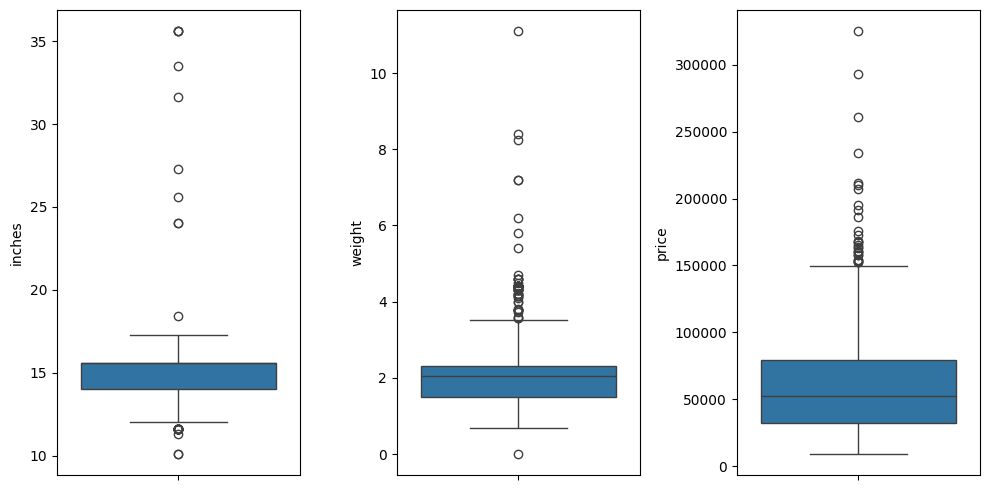

In [245]:
continuous_columns = ['inches','weight','price']
plt.figure(figsize=(10,5))
for i in range(3):
    plt.subplot(1,3,i+1)
    sns.boxplot(y = df[continuous_columns[i]])
plt.tight_layout()

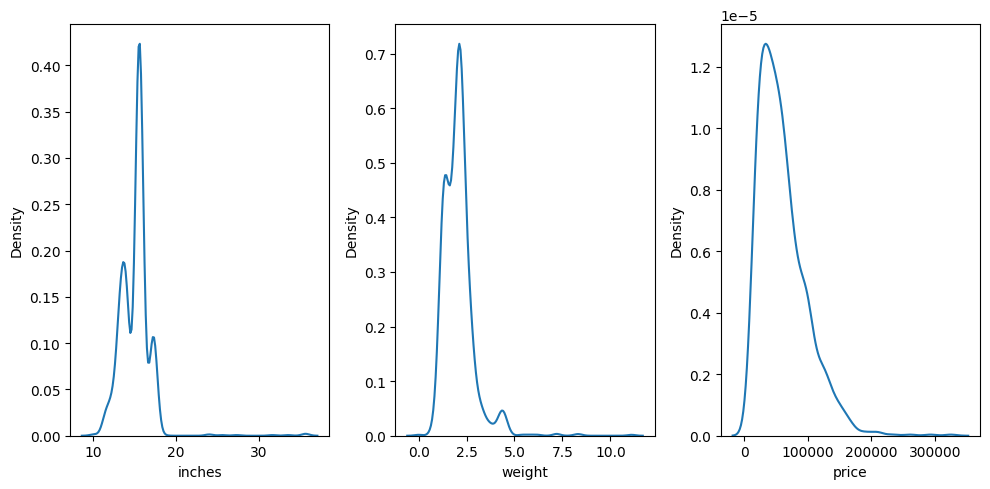

In [246]:
continuous_columns = ['inches','weight','price']
plt.figure(figsize=(10,5))
for i in range(3):
    plt.subplot(1,3,i+1)
    sns.kdeplot(x= df[continuous_columns[i]])
plt.tight_layout()

In [247]:
Q1 = df[['inches','weight']].quantile(0.25)
Q3 = df[['inches','weight']].quantile(0.75)
IQR = Q3-Q1
upper_limit_inches,upper_limit_weight = Q3 + 1.5*IQR
print(upper_limit_inches,upper_limit_weight)
lower_limit_inches,lower_limit_weight = round(Q1 - 1.5*IQR,2)
print(lower_limit_inches,lower_limit_weight)

18.0 3.55
11.6 0.27


#### A) IDENTIFYING OUTLIERS

In [248]:
# outliers from the inches column 
outliers_inches = df[(df['inches']>upper_limit_inches)|(df['inches']<lower_limit_inches)]
print('total_outliers in the inches column: ',len(outliers_inches))
outliers_inches

total_outliers in the inches column:  13


,company,typename,inches,cpu,ram,gpu,opsys,weight,price,ssd,...,flashstorage,hybrid,dual_memory,screen_tech,screen_width,screen_height,aspect_ratio,is_touchscreen,ppi,clock_speed
167,MSI,Gaming,18.4,Intel Core i7 6920HQ 2.9GHz,32.0,Nvidia GTX 980 SLI,Windows 10,4.40,149130.7200,512,...,0,0,1,Full HD,1920,1080,1.78,0,119.72,2.90
370,Lenovo,Notebook,25.6,Intel Core i5 8250U 1.6GHz,8.0,AMD Radeon RX 550,Windows 10,2.10,60978.9600,256,...,0,0,1,IPS,1920,1080,1.78,0,86.05,1.60
376,Lenovo,Notebook,35.6,Intel Core i3 6006U 2GHz,4.0,Intel HD Graphics 520,Windows 10,2.20,21791.5200,0,...,0,0,0,Full HD,1920,1080,1.78,0,61.88,2.00
391,Asus,Notebook,35.6,Intel Core i3 7100U 2.4GHz,8.0,Nvidia GeForce 940MX,Linux,2.30,31808.1600,0,...,0,0,0,Full HD,1920,1080,1.78,0,61.88,2.40
392,Dell,Gaming,27.3,Intel Core i7 7820HK 2.9GHz,16.0,Nvidia GeForce GTX 1070,Windows 10,4.42,149130.7200,256,...,0,0,1,IPS,2560,1440,1.78,0,107.59,2.90
406,Lenovo,Ultrabook,24.0,Intel Core i7 7500U 2.7GHz,24.0,Intel HD Graphics 620,Windows 10,1.32,126912.9600,512,...,0,0,0,Unknown,2560,1440,1.78,0,122.38,2.70
426,Microsoft,Ultrabook,33.5,Intel Core i7 7660U 2.5GHz,8.0,Intel Iris Plus Graphics 640,Windows 10 S,1.25,95850.7200,256,...,0,0,0,Unknown,2256,1504,1.50,1,80.94,2.50
491,Lenovo,Notebook,24.0,Intel Core i5 6200U 2.3GHz,8.0,Intel HD Graphics 520,Windows 7,2.02,71395.2000,256,...,0,0,0,Full HD,1920,1080,1.78,0,91.79,2.30
554,Dell,2 in 1 Convertible,31.6,Intel Core M 7Y30 1.0GHz,4.0,Intel HD Graphics 615,Windows 10,1.39,32127.8400,128,...,0,0,0,Unknown,1366,768,1.78,1,49.59,1.00
622,Lenovo,Notebook,35.6,AMD E-Series E2-9000 2.2GHz,4.0,AMD Radeon R2 Graphics,Windows 10,2.20,18594.7200,128,...,0,0,0,Unknown,1366,768,1.78,0,44.02,2.20


In [56]:
outliers_weights = df[(df['weight']>upper_limit_weight)|(df['weight']<lower_limit_weight)]
print('total_outliers in the weight column: ',len(outliers_weights))
outliers_weights.head()

total_outliers in the weight column:  55


,company,typename,inches,cpu,ram,gpu,opsys,weight,price,ssd,...,flashstorage,hybrid,dual_memory,screen_tech,screen_width,screen_height,aspect_ratio,is_touchscreen,ppi,clock_speed
126,Acer,Notebook,15.6,Intel Core i3 7130U 2.7GHz,4.0,Nvidia GeForce MX130,Windows 10,7.20,30476.1600,256,...,0,0,0,Full HD,1920,1080,1.78,0,141.21,2.7
163,Toshiba,Notebook,15.6,Intel Core i3 7100U 2.4GHz,4.0,Intel HD Graphics 620,Windows 10,5.40,26053.9200,0,...,0,0,0,Unknown,1366,768,1.78,0,100.45,2.4
167,MSI,Gaming,18.4,Intel Core i7 6920HQ 2.9GHz,32.0,Nvidia GTX 980 SLI,Windows 10,4.40,149130.7200,512,...,0,0,1,Full HD,1920,1080,1.78,0,119.72,2.9
208,Dell,Gaming,17.3,Intel Core i7 7700HQ 2.8GHz,16.0,Nvidia GeForce GTX 1060,Windows 10,4.42,130873.7952,256,...,0,0,1,IPS,1920,1080,1.78,0,127.34,2.8
222,Asus,Gaming,17.3,Intel Core i7 7820HK 2.9GHz,32.0,Nvidia GeForce GTX 1080,Windows 10,4.70,207259.2000,512,...,0,0,1,Full HD,1920,1080,1.78,0,127.34,2.9


##### OUTLIERS GREATER THAN UPPER LIMIT

In [249]:
df[df['inches']>upper_limit_inches][['typename','inches','screen_height',
                                     'screen_width','ppi','price']].sort_values(by=['inches','ppi'],ascending = [True,False])

,typename,inches,screen_height,screen_width,ppi,price
167,Gaming,18.4,1080,1920,119.72,149130.72
406,Ultrabook,24.0,1440,2560,122.38,126912.96
491,Notebook,24.0,1080,1920,91.79,71395.20
370,Notebook,25.6,1080,1920,86.05,60978.96
392,Gaming,27.3,1440,2560,107.59,149130.72
554,2 in 1 Convertible,31.6,768,1366,49.59,32127.84
426,Ultrabook,33.5,1504,2256,80.94,95850.72
376,Notebook,35.6,1080,1920,61.88,21791.52
391,Notebook,35.6,1080,1920,61.88,31808.16
622,Notebook,35.6,768,1366,44.02,18594.72


In [250]:
inches_greater_than_19 = df[df['inches']>19][['company','typename','inches','cpu','gpu','screen_height','screen_width',
                                     'ram','opsys', 'weight','ssd','price']]
for k,v in inches_greater_than_19.to_dict().items():
    print(k, ':', v)

company : {370: 'Lenovo', 376: 'Lenovo', 391: 'Asus', 392: 'Dell', 406: 'Lenovo', 426: 'Microsoft', 491: 'Lenovo', 554: 'Dell', 622: 'Lenovo'}
typename : {370: 'Notebook', 376: 'Notebook', 391: 'Notebook', 392: 'Gaming', 406: 'Ultrabook', 426: 'Ultrabook', 491: 'Notebook', 554: '2 in 1 Convertible', 622: 'Notebook'}
inches : {370: 25.6, 376: 35.6, 391: 35.6, 392: 27.3, 406: 24.0, 426: 33.5, 491: 24.0, 554: 31.6, 622: 35.6}
cpu : {370: 'Intel Core i5 8250U 1.6GHz', 376: 'Intel Core i3 6006U 2GHz', 391: 'Intel Core i3 7100U 2.4GHz', 392: 'Intel Core i7 7820HK 2.9GHz', 406: 'Intel Core i7 7500U 2.7GHz', 426: 'Intel Core i7 7660U 2.5GHz', 491: 'Intel Core i5 6200U 2.3GHz', 554: 'Intel Core M 7Y30 1.0GHz', 622: 'AMD E-Series E2-9000 2.2GHz'}
gpu : {370: 'AMD Radeon RX 550', 376: 'Intel HD Graphics 520', 391: 'Nvidia GeForce 940MX', 392: 'Nvidia GeForce GTX 1070', 406: 'Intel HD Graphics 620', 426: 'Intel Iris Plus Graphics 640', 491: 'Intel HD Graphics 520', 554: 'Intel HD Graphics 615', 62

NOTE: for the following data index might change due to above preprocessing but it is clear that the
* inches,screen_resolution and price from the dataset 
      
      {
      inches:{157: 35.6,270: 31.6, 496: 27.3, 820: 35.6, 861: 35.6, 893: 24.0, 960: 25.6, 1026: 24.0, 1136: 33.5}
      screen_width : {427: 2560, 513: 1920, 391: 1920, 413: 2560, 579: 1366, 447: 2256, 397: 1920, 412: 1920, 656: 1366}
      screen_height : {427: 1440, 513: 1080, 391: 1080, 413: 1440, 579: 768, 447: 1504, 397: 1080, 412: 1080, 656: 768}
      price : {427: 126912.96, 513: 71395.2, 391: 60978.96, 413: 149130.72, 579: 32127.84, 447: 95850.72, 397: 21791.52, 412: 31808.16, 656: 18594.72}
      }


* From internet sources (Google AI llama model) The inches are as follows
      
      {
      157: 15.6, 270: 11.6, 496: 15.6, 820: 15.6, 861: 15.6, 893: 14.0, 960: 15.6, 1026: 15.6, 1136: 13.5
      }


* Now clearly for a company and typename the screen size would be almost similar if there is any one outlier the most case would be data error for example as shown above for Lenova company ultraNotebook the screen size would be 14.0 " so we can also fill the outliers with mode of the company and typename

In [251]:
company_typename_inches_dict = df[df['inches']>19][['company','typename','inches']].to_dict()
inches_greater_outlier_indexes = company_typename_inches_dict['company'].keys() 
for index in inches_greater_outlier_indexes:
    mode_inches = df[(df['company']==company_typename_inches_dict['company'][index])&
                (df['typename']==company_typename_inches_dict['typename'][index])]['inches'].mode()[0]
    original_inches = df.loc[index,'inches']
    print(f'index {index}, original_inches : {original_inches},  Mode_inches : {mode_inches}')

index 370, original_inches : 25.6,  Mode_inches : 15.6
index 376, original_inches : 35.6,  Mode_inches : 15.6
index 391, original_inches : 35.6,  Mode_inches : 15.6
index 392, original_inches : 27.3,  Mode_inches : 15.6
index 406, original_inches : 24.0,  Mode_inches : 14.0
index 426, original_inches : 33.5,  Mode_inches : 13.5
index 491, original_inches : 24.0,  Mode_inches : 15.6
index 554, original_inches : 31.6,  Mode_inches : 13.3
index 622, original_inches : 35.6,  Mode_inches : 15.6


* The Mode of inches found from company and typename almost matches with the internet source so the outlier inches will be replaced by mode of tht data found from `company` and `typename`

In [252]:
df[df['weight']>upper_limit_weight][['typename','weight','price']].sort_values(by = ['weight','price'])

,typename,weight,price
837,Gaming,3.58,68145.1200
992,Gaming,3.58,211788.0000
230,Gaming,3.60,159786.7200
751,Gaming,3.74,93186.7200
548,Gaming,3.78,79813.4400
974,Gaming,3.78,82351.6992
436,Gaming,3.78,90522.7200
1062,Gaming,3.78,127818.7200
1003,Gaming,3.78,133146.7200
605,Gaming,3.80,149130.7200


* Clearly the data upto the weight greater than 5kg is consistent but after that weight greater than 5kg and belong to Notebook and ultrabook might be false records

In [253]:
weight_greater_than_5kg = df[df['weight']>5][['company','typename','inches',
                                              'cpu','ram','gpu','opsys','weight','price']]
for k,v in weight_greater_than_5kg.to_dict().items():
    print(k, ':', v)

company : {126: 'Acer', 163: 'Toshiba', 224: 'Lenovo', 279: 'Lenovo', 303: 'Acer', 549: 'Lenovo', 588: 'Asus', 609: 'Dell'}
typename : {126: 'Notebook', 163: 'Notebook', 224: 'Notebook', 279: 'Notebook', 303: 'Notebook', 549: 'Ultrabook', 588: 'Ultrabook', 609: 'Notebook'}
inches : {126: 15.6, 163: 15.6, 224: 15.6, 279: 17.3, 303: 15.6, 549: 14.0, 588: 14.0, 609: 15.6}
cpu : {126: 'Intel Core i3 7130U 2.7GHz', 163: 'Intel Core i3 7100U 2.4GHz', 224: 'Intel Core i3 6006U 2GHz', 279: 'Intel Core i5 7200U 2.5GHz', 303: 'Intel Core i5 7200U 2.5GHz', 549: 'Intel Core i7 6600U 2.6GHz', 588: 'Intel Core i7 7500U 2.7GHz', 609: 'Intel Core i7 8550U 1.8GHz'}
ram : {126: 4.0, 163: 4.0, 224: 8.0, 279: 6.0, 303: 6.0, 549: 12.0, 588: 16.0, 609: 8.0}
gpu : {126: 'Nvidia GeForce MX130', 163: 'Intel HD Graphics 620', 224: 'Intel HD Graphics 520', 279: 'Nvidia GeForce GTX 940M', 303: 'Intel HD Graphics 620', 549: 'Intel HD Graphics 520', 588: 'Intel HD Graphics 620', 609: 'AMD Radeon 530'}
opsys : {126:

* The weights and prices present in dataset
original_weights:

        {
        "weight : {47: 7.2, 54: 8.23, 209: 11.1, 509: 6.2, 854: 7.2, 946: 5.8, 983: 8.4, 1156: 5.4}
        }
        
* From internet sources (Google AI llama model) following are the weights of the same models
internet_source:

        {
        "weight_kg": {47: 2.1, 54: 2.2, 209: 1.4, 509: 2.3, 854: 2.2, 946: 2.5, 983: 1.5, 1156: 2.0}
        }


In [254]:

company_typename_weight_dict = df[df['weight']>5][['company','typename','weight']].to_dict()
weight_greater_outlier_indexes = company_typename_weight_dict['company'].keys() 
for index in weight_greater_outlier_indexes:
    mode_weights = df[(df['company']==company_typename_weight_dict['company'][index])&
                (df['typename']==company_typename_weight_dict['typename'][index])]['weight'].mode()[0]
    original_weights = df.loc[index,'weight']
    print(f'index {index}, original_weights : {original_weights},  Mode_weight : {mode_weights}')

index 126, original_weights : 7.2,  Mode_weight : 2.1
index 163, original_weights : 5.4,  Mode_weight : 1.2
index 224, original_weights : 7.2,  Mode_weight : 2.2
index 279, original_weights : 5.8,  Mode_weight : 2.2
index 303, original_weights : 8.23,  Mode_weight : 2.1
index 549, original_weights : 8.4,  Mode_weight : 1.13
index 588, original_weights : 11.1,  Mode_weight : 1.1
index 609, original_weights : 6.2,  Mode_weight : 2.2


* It is clear that the mode of the weights are approx same as from internet source so we can replace the weights by mode values

##### OUTLIERS LESSER THAN LOWER LIMIT

In [63]:
df[df['inches']<lower_limit_inches][['company','typename','inches','screen_height',
                                     'screen_width','ppi','price']].sort_values(by=['inches','ppi'],ascending = [True,False])

,company,typename,inches,screen_height,screen_width,ppi,price
1039,Lenovo,2 in 1 Convertible,10.1,1200,1920,224.17,29250.7200
1205,Lenovo,2 in 1 Convertible,10.1,1200,1920,224.17,29977.1928
875,Lenovo,2 in 1 Convertible,11.3,1080,1920,194.95,69210.7200


* As the data is consistent and possible we keep the following outliers as it is

In [64]:
df[df['weight']<lower_limit_weight][['company','typename','weight','price']].sort_values(by = ['weight','price'])

,company,typename,weight,price
323,Dell,Ultrabook,0.0002,35324.64


In [65]:
lower_mode_weight = df[(df['company']=='Dell')&(df['typename']=='Notebook')]['weight'].mode()[0]

* As the outlier value is not possible we will replace it with mode for that respective column

#### UPDATING THE OUTLIERS OF INCHES COLUMN

In [66]:
try:
    # Get the index of rows where inches > 19
    idx = df[df['inches'] > 19].index
    # Looping the idx and updating the inches column with mode for that index
    for i in idx: 
        company_value = df.loc[i,'company']
        typename_value = df.loc[i,'typename']
        inch_value = df[(df['company']==company_value)&(df['typename']==typename_value)]['inches'].mode()[0]
        df.loc[i,'inches'] = inch_value

except Exception as e:
    print("Error:", e)
finally:
    print(df.loc[idx,'inches'])

370    15.6
376    15.6
391    15.6
392    15.6
406    14.0
426    13.5
491    15.6
554    13.3
622    15.6
Name: inches, dtype: float64


* Inches column updated safely

#### UPDATING THE OUTLIERS OF WEIGHT COLUMN

In [67]:
try:
    # Get the index of rows where weight > 5
    idx = df[df['weight'] > 5].index
    # Updating the weigth value with the mode from the data
    for i in idx: 
        company_value = df.loc[i,'company']
        typename_value = df.loc[i,'typename']
        weight_value = df[(df['company']==company_value)&(df['typename']==typename_value)]['weight'].mode()[0]
        df.loc[i,'weight'] = weight_value



except Exception as e:
    print("Error:", e)
finally:
    print(df.loc[idx,'weight'])

126    2.10
163    1.20
224    2.20
279    2.20
303    2.10
549    1.13
588    1.10
609    2.20
Name: weight, dtype: float64


In [68]:
# updataing the lower weight vlaue as it is single no need to loop it
try:
    idx = df[df['weight']<lower_limit_weight].index
    df.loc[idx,'weight'] = lower_mode_weight
except Exception as e:
    print(f'Error : {e}')
finally:
    print(df.loc[idx,'weight'])
    print(f'weight obtained from mode of company and type : {lower_mode_weight}')

323    2.2
Name: weight, dtype: float64
weight obtained from mode of company and type : 2.2


#### CONVERTING `price & ppi` FEATURES

In [69]:
# The ouliers in the price column  is normal so we need to apply log transform so that the price value will be neutralized
df['price_log'] = df['price'].apply(np.log)

In [70]:
# As inches  column is redifined we need to adjust the ppi column as ppi is dependent on inches 
df['ppi'] = round(((df['screen_width']**2 + df['screen_height']**2)**0.5)/df['inches'],2)
df.head()

,company,typename,inches,cpu,ram,gpu,opsys,weight,price,ssd,...,hybrid,dual_memory,screen_tech,screen_width,screen_height,aspect_ratio,is_touchscreen,ppi,clock_speed,price_log
0,Apple,Ultrabook,13.3,Intel Core i5 2.3GHz,8.0,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,128,...,0,0,IPS,2560,1600,1.60,0,226.98,2.3,11.175755
1,Apple,Ultrabook,13.3,Intel Core i5 1.8GHz,8.0,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,...,0,0,Unknown,1440,900,1.60,0,127.68,1.8,10.776777
2,HP,Notebook,15.6,Intel Core i5 7200U 2.5GHz,8.0,Intel HD Graphics 620,No OS,1.86,30636.0000,256,...,0,0,Full HD,1920,1080,1.78,0,141.21,2.5,10.329931
3,Apple,Ultrabook,15.4,Intel Core i7 2.7GHz,16.0,AMD Radeon Pro 455,macOS,1.83,135195.3360,512,...,0,0,IPS,2880,1800,1.60,0,220.53,2.7,11.814476
4,Apple,Ultrabook,13.3,Intel Core i5 3.1GHz,8.0,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,256,...,0,0,IPS,2560,1600,1.60,0,226.98,3.1,11.473101


In [71]:
df[['inches','weight','price_log',]].describe()

,inches,weight,price_log
count,1219.000000,1219.000000,1219.000000
mean,15.021903,2.043962,10.825808
std,1.413884,0.676102,0.621803
min,10.100000,0.690000,9.134616
25%,14.000000,1.500000,10.374901
50%,15.600000,2.040000,10.868203
75%,15.600000,2.310000,11.286445
max,18.400000,4.700000,12.691441


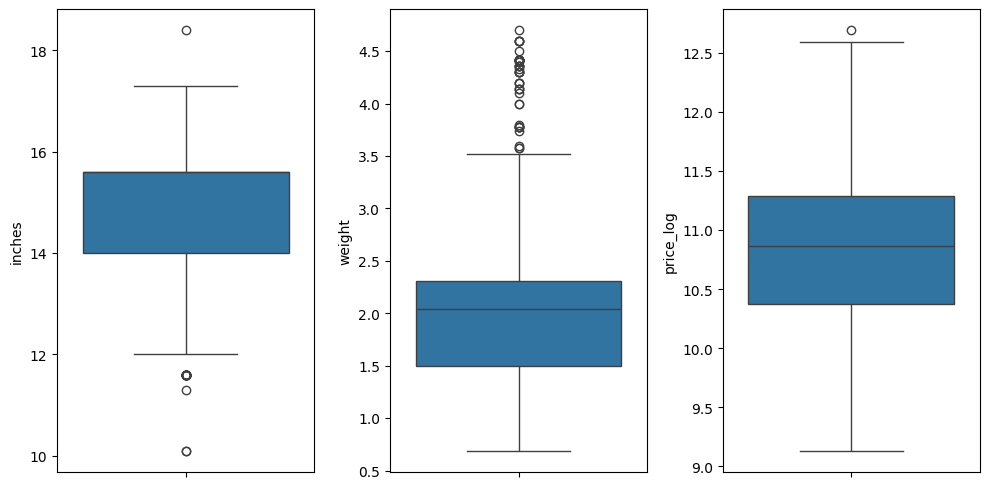

In [72]:
continuous_columns = ['inches','weight','price_log']
plt.figure(figsize=(10,5))
for i in range(3):
    plt.subplot(1,3,i+1)
    sns.boxplot(y = df[continuous_columns[i]])
plt.tight_layout()

**📊 OUTLIER SUMMARY**

- The `.describe()` function was used to understand the **descriptive statistics** of the `inches` and `weight` columns.
  
- **Abnormalities Detected**:
  - Some laptops had **weights greater than 5 kg** and **screen sizes over 20 inches**, which are highly unlikely and considered **data entry errors**.
  - **Screen sizes between 18" and 20+"** and **weights between 4.5 kg and 5+ kg** may exist but are extremely rare.
  - A lower bound screen size of **10"** is valid, as compact laptops exist.
  - A **weight value as low as 0.0002 kg** is **impossible** and marked as a **data error**.

- **Outlier Detection Using IQR Method**:
  - `inches`:  
    - Original limits: **Lower = 11.6**, **Upper = 18.0**
    - Modified limits (based on domain knowledge): **Lower = 10.0**, **Upper = 19.0**
  - `weight`:  
    - Original limits: **Lower = 0.27**, **Upper = 3.55**
    - Modified limits (based on domain knowledge): **Lower = 0.5**, **Upper = 5.0**

- **Outlier Count**:
  - `inches`:  
    - Above upper limit: **9 values**  
    - Below lower limit: **0 values**
  - `weight`:  
    - Above upper limit: **8 values**  
    - Below lower limit: **1 value**

- **Outlier Treatment**:
  - **Mode imputation** was used to replace outliers.
  - The mode was calculated **within the same `Company` and `TypeName`** for accurate context-based imputation.
  - Imputed values were also **cross-verified from online sources**, and results were consistent.

- **Derived Column Adjustment**:
  - The `ppi` (pixels per inch) column was recalculated after imputing the `inches` column, since it depends on screen size.

- **Price Column Transformation**:
  - The `price` column is **right-skewed**, and direct modification isn't feasible.
  - A new column, **`price_log`**, was created by applying **log transformation** to normalize the distribution.


### 7. OVERALL CONCLUSION: DATA CLEANING SUMMARY

- The dataset underwent a comprehensive cleaning process addressing missing values, duplicates, data inconsistencies, and outliers.
- **Missing Values**: All 30 null rows were removed using `df.dropna()`, resulting in a base dataset of 1273 rows.
- **Duplicates**: 29 exact duplicate rows (across 14 instances) were removed. Feature-based price conflicts were handled using a hybrid strategy—rows with large price differences (> ₹3000) were aggregated using median values, while smaller conflicts were retained.
- **Unnecessary Columns**: Columns like `memory` and `screenresolution` were dropped after extracting relevant features.
- **Outliers**: `inches` and `weight` outliers were detected using IQR and domain thresholds, then corrected using mode imputation within the same `Company` and `TypeName`. Extreme anomalies (e.g., 0.0002 kg) were treated as data errors.
- **Derived Features**: The `ppi` column was updated after cleaning `inches`, and a new `price_log` column was created to normalize the skewed `price` distribution.
- **Final Shape**: After all cleaning steps, the dataset size was reduced to **1219 rows**.
- **Integrity Check**: The final dataset contains no missing values, no duplicates, and maintains consistent schema quality, making it ready for analysis and modeling.


## IV. EXPLORATORY DATA ANALYSIS

### 1. UNIVARIATE ANALYSIS

#### A) DISPLAY RELATED DATA

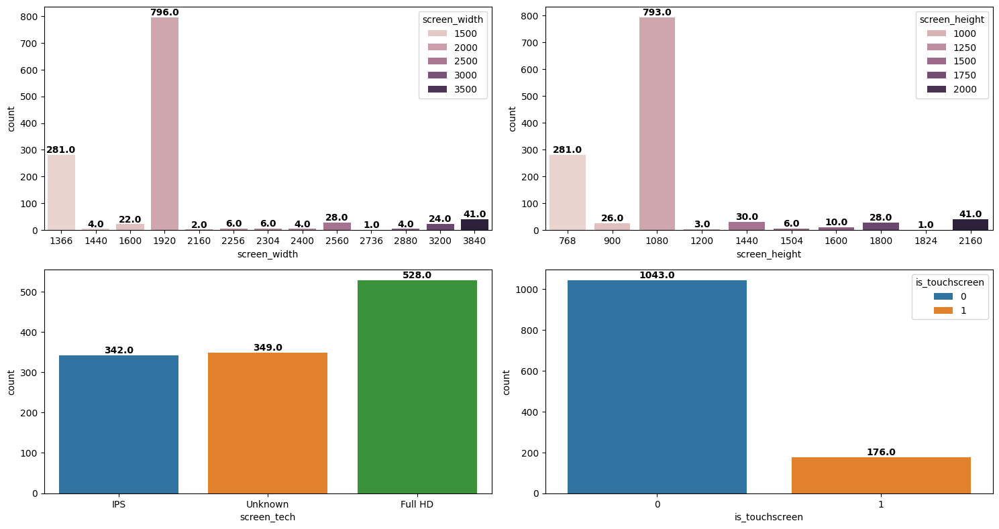

In [73]:
plt.figure(figsize=(15,8))
cols = ['screen_width','screen_height','screen_tech','is_touchscreen']

for i in range(1,5):
    plt.subplot(2,2,i)
    ax = sns.countplot(data = df, x = cols[i-1],hue=cols[i-1])
    
    # annotating the bars for better understanding of the value
    for p in ax.patches:
        if p.get_height()>0:
            ax.annotate(f'{p.get_height()}',  
                        (p.get_x() + p.get_width() / 2, p.get_height()),  
                        ha='center', va='bottom', fontsize=10, fontweight='bold', color='black')
# plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

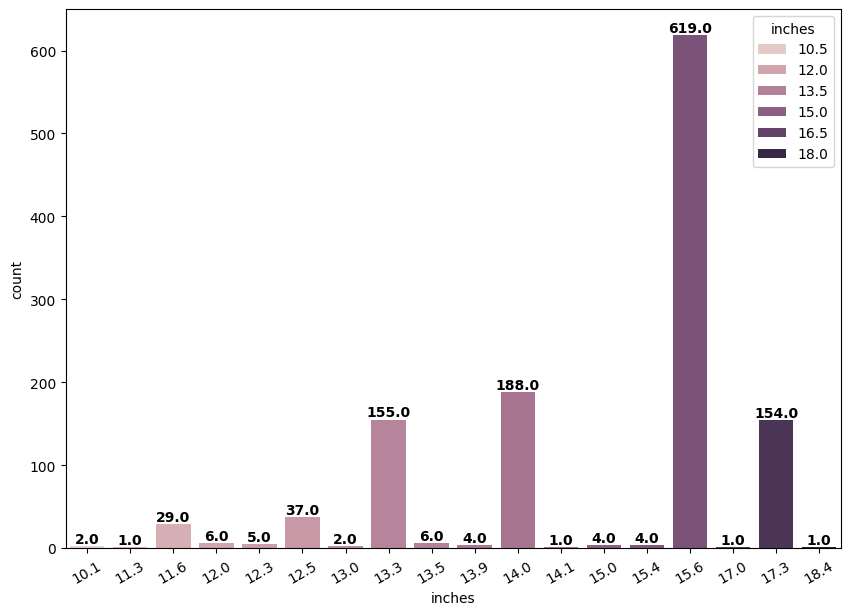

In [74]:
# it is best to visualize screen size as countplot instead of histogram due to unique values not exceeding 
plt.figure(figsize = (10,7))
ax = sns.countplot(data = df, x ='inches',hue = 'inches')
for p in ax.patches:
    if p.get_height()>0:
        ax.annotate(f'{p.get_height()}',  
                    (p.get_x() + p.get_width() / 2, p.get_height()),  
                    ha='center', va='bottom', fontsize=10, fontweight='bold', color='black')
plt.xticks(rotation = 30)
plt.show()

**Observations**

- From the frequency plot of **screen resolution**, it is evident that **1920x1080** is the most common resolution among laptops in the dataset.
- A total of **176 laptops** support the **touchscreen** feature.
- The **15.6" screen size** is the most popular diagonal size, appearing in **619 out of 1219 laptops** in the data.


#### B) STORAGE RELEATED DATA

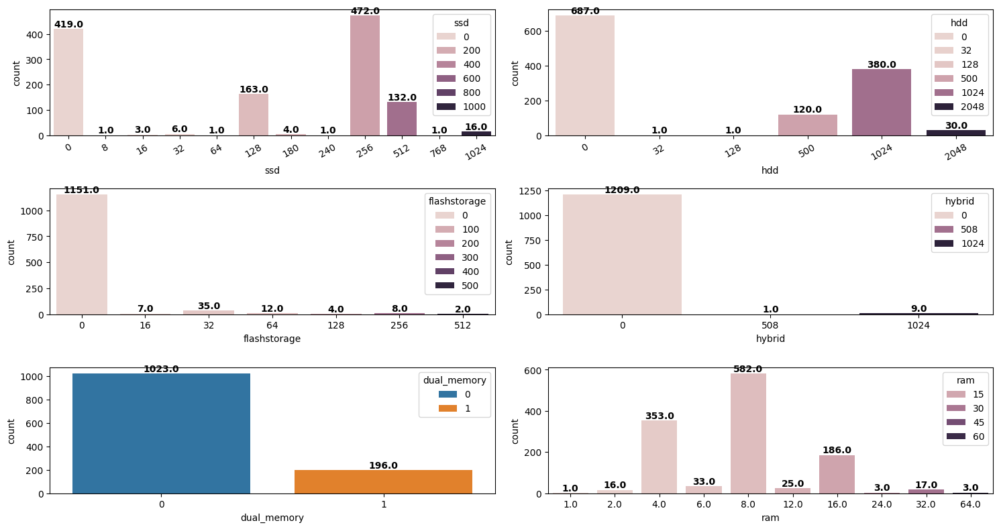

In [75]:
cols = ['ssd','hdd','flashstorage','hybrid','dual_memory','ram']
plt.figure(figsize=(15,8))
for i in range(6):
    plt.subplot(3,2,i+1)
    ax = sns.countplot(data = df, x=cols[i],hue = cols[i])
    for p in ax.patches:
        if p.get_height()>0:
            ax.annotate(f'{p.get_height()}',  
                        (p.get_x() + p.get_width() / 2, p.get_height()),  
                        ha='center', va='bottom', fontsize=10, fontweight='bold', color='black')
    if i <2:
        plt.xticks(rotation=30)
plt.tight_layout()

* The most common type of secondary storage is `SSD` storage.(least count of 0's implies most recorded)
* 196 laptop model have dual_memory specifications
* The most common type of RAM is 8 GB.

#### C) TOP 10 PREFERRED CPU'S & GPU'S

Text(0.5, 1.0, "Top 10 common GPU's")

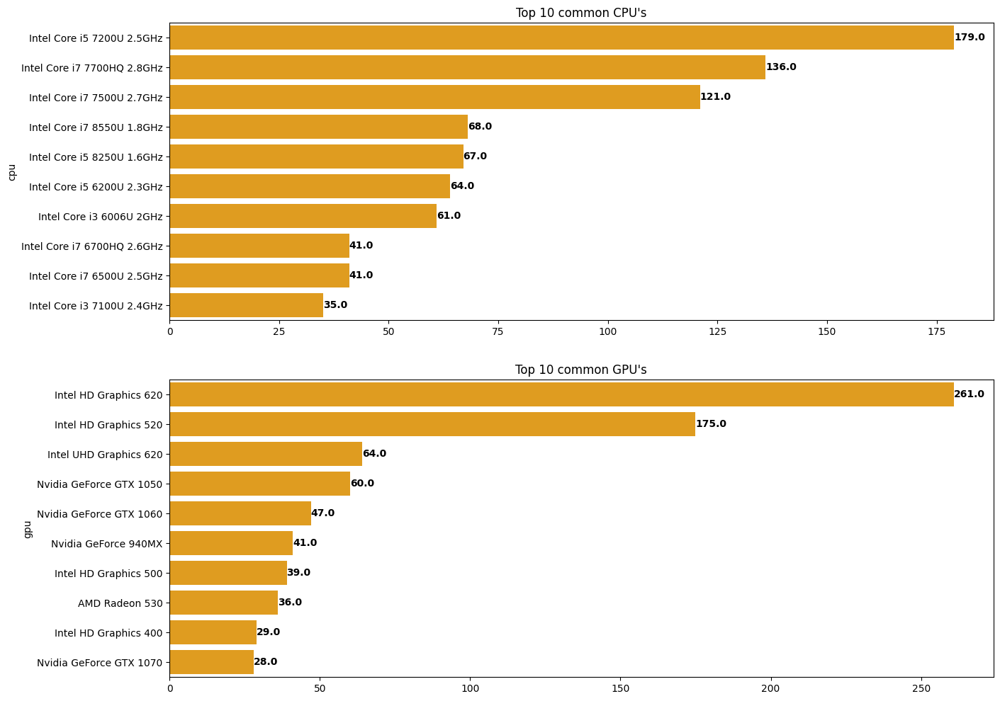

In [76]:
cpu_freq = df['cpu'].value_counts()

plt.figure(figsize=(15,12))
plt.subplot(2,1,1)
ax = sns.barplot(x = cpu_freq.head(10).values,y= cpu_freq.head(10).index,color = 'orange')
for p in ax.patches:
    ax.annotate(f'{p.get_width()}',
                (p.get_width(),(p.get_y()+p.get_height()/2)),
                ha = 'left',va='center',fontsize=10,fontweight = 'bold',color='black')
plt.title("Top 10 common CPU's")
gpu_freq = df['gpu'].value_counts()
plt.subplot(2,1,2)
ax = sns.barplot(x = gpu_freq.head(10).values,y = gpu_freq.head(10).index,color = 'orange')
for p in ax.patches:
    ax.annotate(f'{p.get_width()}',
                (p.get_width(),(p.get_y()+p.get_height()/2)),
                ha = 'left',va='center',fontsize=10,fontweight = 'bold',color='black')
plt.title("Top 10 common GPU's")


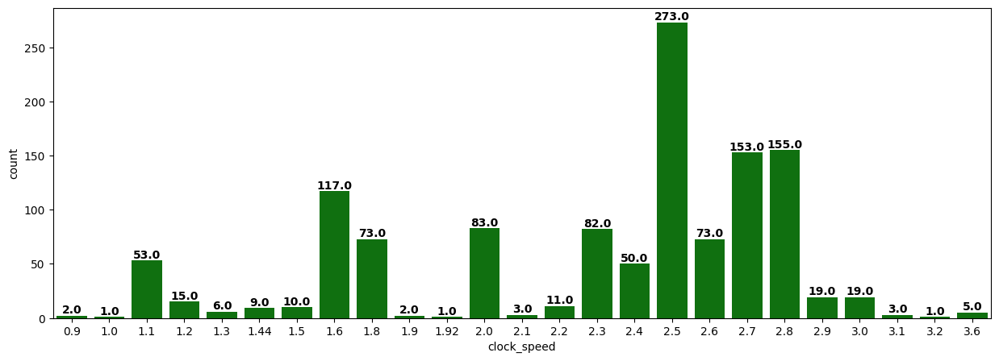

In [77]:
plt.figure(figsize=(15,5))
ax = sns.countplot(data = df,x= 'clock_speed',color='green')
for p in ax.patches:
    if p.get_height()>0:
        ax.annotate(f'{p.get_height()}',  
                    (p.get_x() + p.get_width() / 2, p.get_height()),  
                    ha='center', va='bottom', fontsize=10, fontweight='bold', color='black')

- Among the **top 10 most common CPUs**, all belong to the **Intel** brand, differing only by their specifications (e.g., i3, i5, i7, etc.).
- For the **top 10 most common GPUs**:
  - **Intel** appears **4 times**
  - **NVIDIA** appears **3 times**
  - **AMD** appears **1 time**
- The most common **CPU clock speed** in the dataset is **2.5 GHz**, found in **273 laptop models**.

#### D) FREQUENCY OF `opsys`,`company`,`typename`

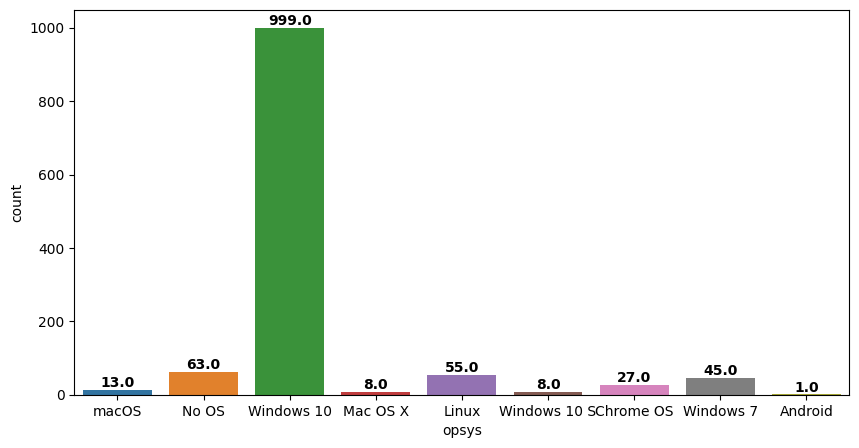

In [78]:
plt.figure(figsize=(10,5))
ax = sns.countplot(data =df, x = 'opsys',hue='opsys')
for p in ax.patches:
    if p.get_height()>0:
        ax.annotate(f'{p.get_height()}',  
                    (p.get_x() + p.get_width() / 2, p.get_height()),  
                    ha='center', va='bottom', fontsize=10, fontweight='bold', color='black')

* Windows 10 is the popular operating system (OS) in the dataset (999 out of 1219)

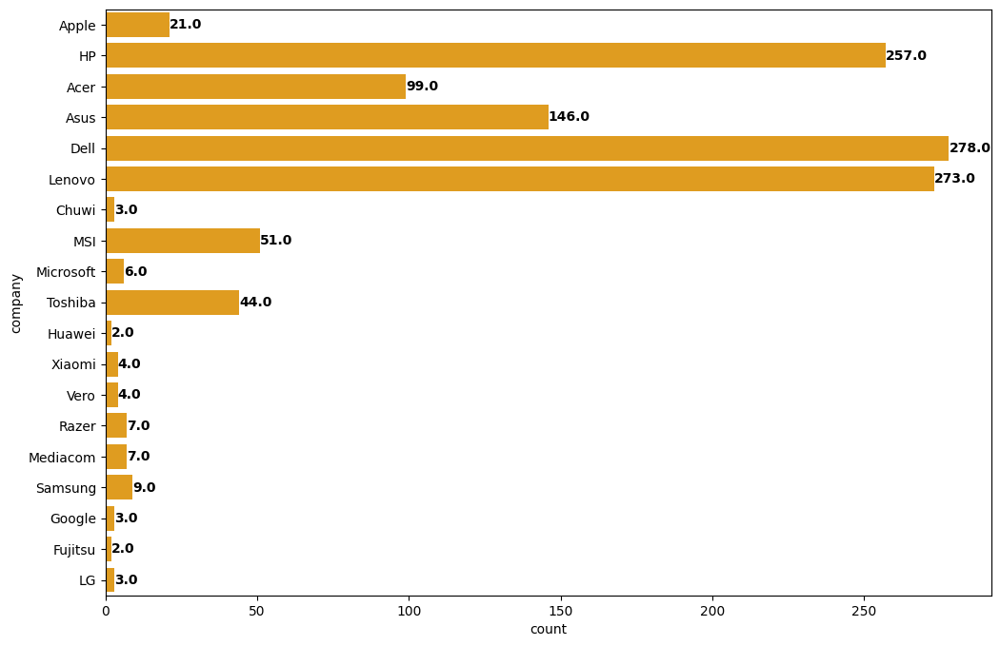

In [79]:
plt.figure(figsize=(12,8))
ax = sns.countplot(data =df, y = 'company',color = 'orange')
for p in ax.patches:
    ax.annotate(f'{p.get_width()}',
                (p.get_width(),(p.get_y()+p.get_height()/2)),
                ha = 'left',va='center',fontsize=10,fontweight = 'bold',color='black')

* Lenova , Dell and HP are the top 3 companies with most varieties

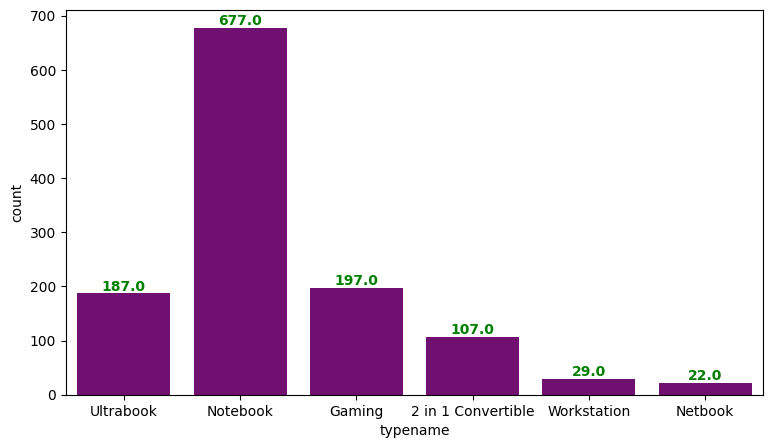

In [80]:
plt.figure(figsize=(9,5))
ax = sns.countplot(data = df, x = 'typename',color = 'purple')
for p in ax.patches:
    if p.get_height()>0:
        ax.annotate(f'{p.get_height()}',  
                    (p.get_x() + p.get_width() / 2, p.get_height()),  
                    ha='center', va='bottom', fontsize=10, fontweight='bold', color='green')

* Notebook is the most common laptop type in the dataset (677 out of 1219)

#### E) FREQUENCY DISTRIBUTION FOR CONTINUOUS VARIABLES

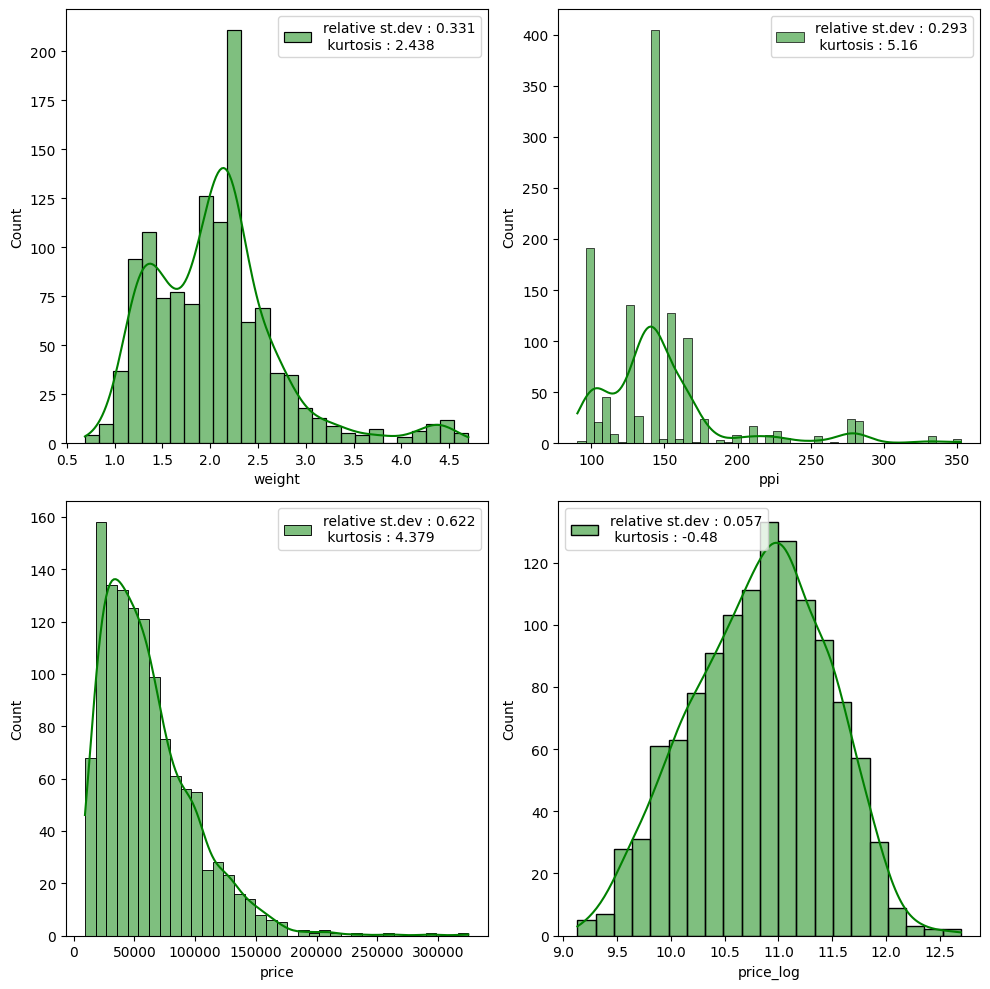

In [81]:
cols  = ['weight','ppi','price','price_log']
plt.figure(figsize=(10,10))
for i in range(1,5):
    plt.subplot(2,2,i)
    plot_label = f'relative st.dev : {round(df[cols[i-1]].std()/df[cols[i-1]].mean(),3)}\n kurtosis : {round(df[cols[i-1]].kurt(),3)}'
    sns.histplot(data = df,x=cols[i-1],color='green',kde=True,label = plot_label)
    plt.legend()
plt.tight_layout()
plt.show()


**🔸Weight**
- The distribution of **weight** is slightly **right-skewed** and has **moderate-variability (0.33)**.
- Most laptops weigh between **1.5 kg and 2.5 kg**, with a peak around **2.2 kg**.
- Very few laptops weigh more than **4 kg**, indicating that such models are rare or may be edge cases.

**🔸 PPI (Pixels Per Inch)**
- The **ppi** distribution is **heavily right-skewed** and also has **moderate-variability (0.29)**.
- A large majority of laptops have **ppi values between 100 and 170**, with a noticeable spike at **141 ppi** (likely 1366x768 on 15.6” screens).
- Higher ppi values (above 200) are rare and represent high-resolution displays.

**🔸 Price**
- The **price** distribution is **strongly right-skewed** and has **hight-variability (0.62)**, with most laptops priced between **₹20,000 and ₹60,000**.
- Few extreme outliers exist with prices above **₹150,000**, suggesting premium or high-end models.
- This skewness justifies the need for a log transformation before modeling.

**🔸 Price (Log Transformed)**
- The `price_log` distribution is **approximately normal (0.05)**, centered around **10.5 to 11**.
- This transformation helps to stabilize variance and make the data more suitable for regression-based modeling.


### 2. BIVARIATE ANALYSIS

* As price column is our main objective we will keep price variable as common variable

#### A) AVERAGE PRICE ESTIMATION PER CATEGORY

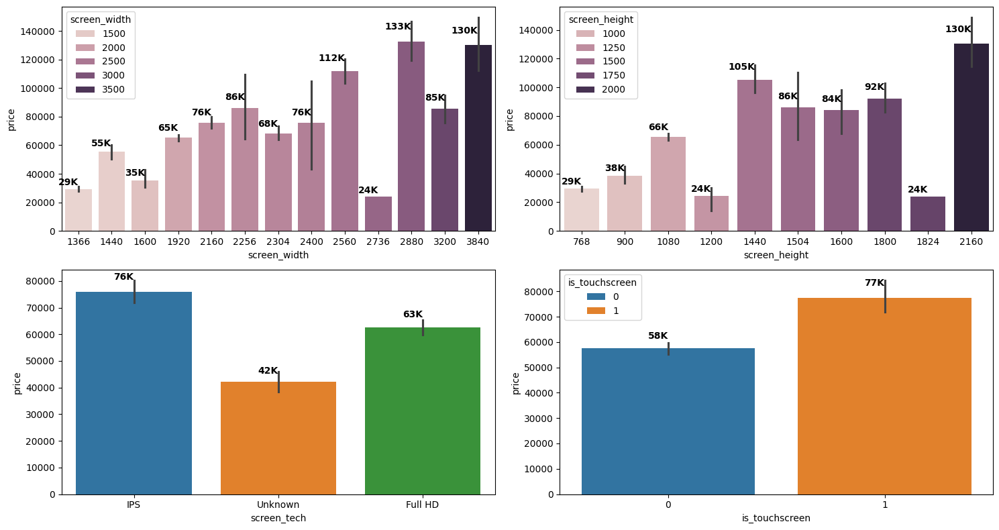

In [82]:
plt.figure(figsize=(15,8))
cols = ['screen_width','screen_height','screen_tech','is_touchscreen']

for i in range(1,5):
    plt.subplot(2,2,i)
    ax = sns.barplot(data = df, x = cols[i-1],y='price',estimator='mean',hue=cols[i-1])
    for p in ax.patches:
        if p.get_height()>0:
            ax.annotate(f'{round(p.get_height()/1000)}K',  
                        (p.get_x() + p.get_width() / 2, p.get_height()*1.05),  
                        ha='right', va='bottom', fontsize=10, fontweight='bold', color='black')
# plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

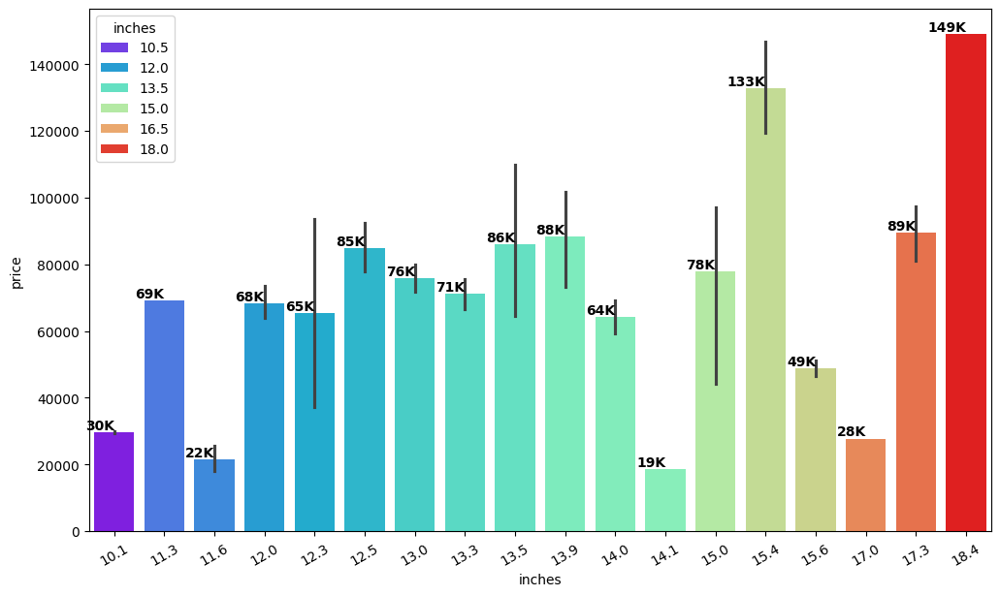

In [83]:
# it is best to visualize screen size as countplot instead of histogram due to unique values not exceeding 
plt.figure(figsize = (12,7))
ax = sns.barplot(data = df, x ='inches',y = 'price',estimator='mean',hue='inches',palette='rainbow')
for p in ax.patches:
    if p.get_height()>0:
        ax.annotate(f'{round(p.get_height()/1000)}K',  
                    (p.get_x() + p.get_width() / 2, p.get_height()),  
                    ha='right', va='bottom', fontsize=10, fontweight='bold', color='black')
plt.xticks(rotation = 30)
plt.show()

* Although it is not clear but there is a trend where increase in screen resolution increase in mean price
* Touchscreen has high mean price than the laptops without touchscreen
*  While there's a **positive correlation** between screen size and price, the relationship is **non-linear**. Some screen sizes are associated with premium offerings, while others deviate due to market positioning or model scarcity.

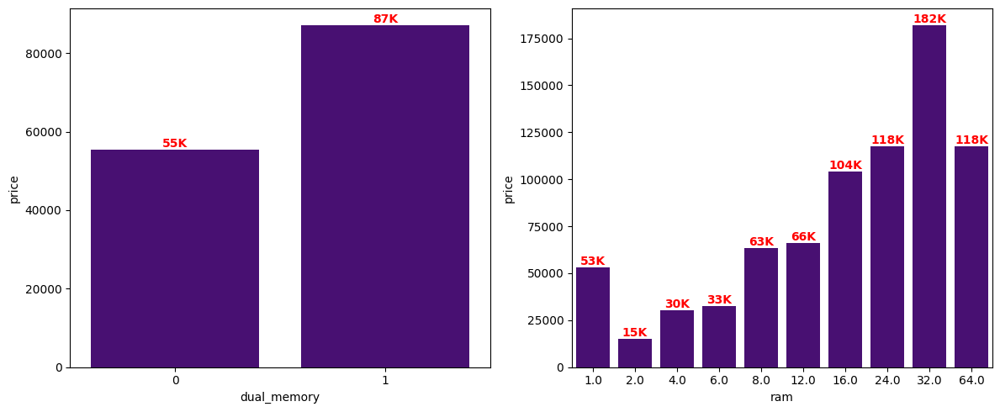

In [84]:
# generating figure and axes for the subplot
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# plotting the first bar plot
ax1 = sns.barplot(data=df, x='dual_memory', y='price', estimator='mean', color='indigo',errorbar=None, ax=axes[0])
for p in ax1.patches:
    ax1.annotate(f'{round(p.get_height()/1000)}K',
                 (p.get_x() + p.get_width() / 2, p.get_height()),
                 ha='center', va='bottom', fontsize=10, fontweight='bold', color='red')

# plotting the second bar plot
ax2 = sns.barplot(data=df, x='ram', y='price', estimator='mean', color='indigo',errorbar = None, ax=axes[1])
for p in ax2.patches:
    ax2.annotate(f'{round(p.get_height()/1000)}K',
                 (p.get_x() + p.get_width() / 2, p.get_height()),
                 ha='center', va='bottom', fontsize=10, fontweight='bold', color='red')

# making the spacing better to avoid overlapping
plt.tight_layout()
plt.show()


* on avg dual memory laptops has high pricing range
* increase in ram mostly has increase in pricing of the laptop

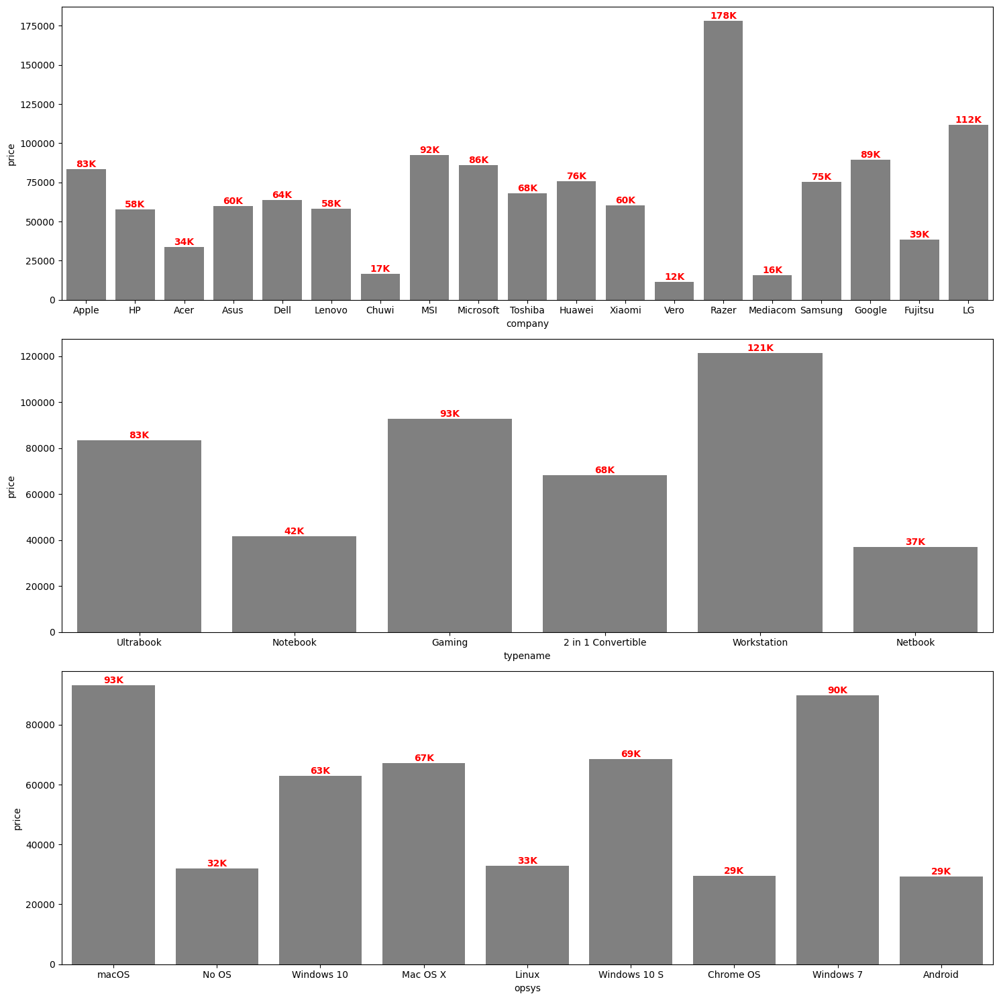

In [85]:


fig,axes = plt.subplots(3,1,figsize = (15,15))
ax1 = sns.barplot(data=df, x='company', y='price', estimator='mean', color='grey',errorbar = None,ax = axes[0])
for p in ax1.patches:
    ax1.annotate(f'{round(p.get_height()/1000)}K',
                 (p.get_x() + p.get_width() / 2, p.get_height()),
                 ha='center', va='bottom', fontsize=10, fontweight='bold', color='red')
ax2 = sns.barplot(data=df, x='typename', y='price', estimator='mean', color='grey',errorbar = None,ax = axes[1])
for p in ax2.patches:
    ax2.annotate(f'{round(p.get_height()/1000)}K',
                 (p.get_x() + p.get_width() / 2, p.get_height()),
                 ha='center', va='bottom', fontsize=10, fontweight='bold', color='red')
ax3 = sns.barplot(data=df, x='opsys', y='price', estimator='mean', color='grey',errorbar = None,ax = axes[2])
for p in ax3.patches:
    ax3.annotate(f'{round(p.get_height()/1000)}K',
                 (p.get_x() + p.get_width() / 2, p.get_height()),
                 ha='center', va='bottom', fontsize=10, fontweight='bold', color='red')
plt.tight_layout()
plt.show()

* Razer and LG laptops have the highest average prices (₹178K and ₹112K), while Chuwi and Mediacom are the most budget-friendly (~₹17K).
* Workstations and Gaming laptops are the most expensive types, averaging ₹121K and ₹93K respectively.
* Notebooks and Netbooks are the cheapest types (~₹42K and ₹37K), appealing to budget users.
* Ultrabooks also command high prices (₹83K), indicating premium build and specs.
* macOS and Windows 7 systems have the highest average prices (~₹93K and ₹90K).
* No OS, Linux, and Android laptops are the most affordable (₹29K–₹33K), likely used in low-cost devices.

#### B) PRICE DISTRIBUTION AMONG CATEGORIES

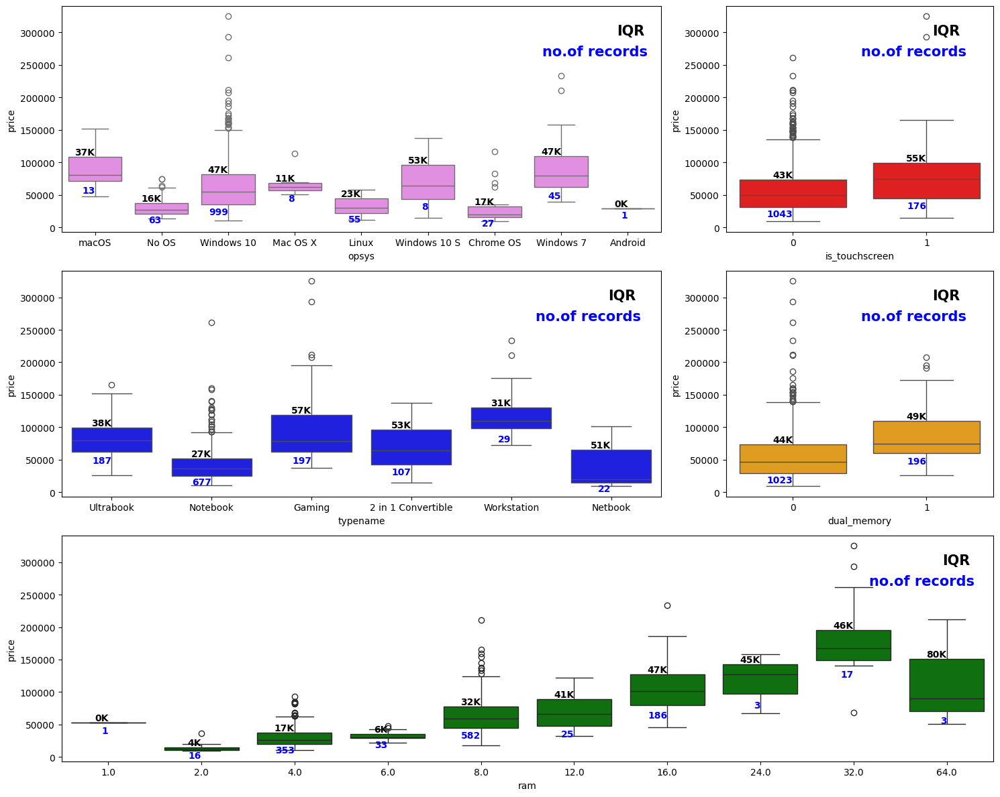

In [86]:
# df['ram'] = df['ram'].astype('str')
cols = ['opsys', 'is_touchscreen', 'typename', 'dual_memory', 'ram']
fig = plt.figure(figsize=(15, 12))

# Manually defining subplots grid for each plot 
positions = [ (3, 3, (1, 2)),   # First plot (spanning 2 slots in row 1)
              (3, 3, 3),        # Second plot (single slot in row 1)
              (3, 3, (4, 5)),   # Third plot (spanning 2 slots in row 2)
              (3, 3, 6),        # Fourth plot (single slot in row 2)
              (3, 3, (7, 9))]   # Fifth plot (spanning entire row 3)


# Looping through the columns (& the position and span of the plot), the index only used for selecting the color of the plot
for i, (col, pos) in enumerate(zip(cols, positions)):
    ax = fig.add_subplot(*pos)  # Unpacking position tuple
    sns.boxplot(data=df, x=col, y='price', color=['violet', 'red', 'blue', 'orange', 'green'][i], ax=ax)
    # ax.set_xticklabels(ax.get_xticklabels(), rotation=30)

    # Annotating the IQR
    for category in df[col].unique():
        data_category = df[df[col] == category]['price']
        Q1, Q3 = np.percentile(data_category, [25, 75])
        IQR = Q3 - Q1
        x_pos = list(df[col].unique()).index(category)
        # as ram column is numerical the should be done based on column value instead of value_counts(because unique 
        # extracts category in order of descending frequency of the data)
        if col=='ram':
            x_pos = sorted(list(df[col].unique())).index(category)
        ax.text(x_pos, Q3, f'{IQR/1000:.0f}K', ha='right', va='bottom', fontsize=10, color='black', fontweight='bold')
        no_of_records = len(data_category)
        ax.text(x_pos, Q1*0.9, f'{no_of_records}', ha='right', va='top', fontsize=10, color='blue', fontweight='bold')


    ax.text(len(df[col].unique())-0.75, df['price'].max()*0.9, f'IQR', ha='right', va='bottom', fontsize=15, color='black', fontweight='bold')
    ax.text(len(df[col].unique())-0.7, df['price'].max()*0.8, f'no.of records', ha='right', va='bottom', fontsize=15, color='blue', fontweight='bold')

plt.tight_layout()
plt.show()


* Mac os has high median price indicating premium trend
* The laptops with touch screen has higher median prices compared to the laptops without touchscreen 
* Gaming type laptops has high variability (57k) while workstation are rare(29) and expensive
* The laptops with dual memory has higher median prices compared to the laptops without dual_memory
* We can clearly see increase in price median and price variability for increase in ram size
* The models with 4 GB Ram category (353 models) has low variance(17k IQR) in prices.

Text(18.3, 259963.77599999998, 'no.of records')

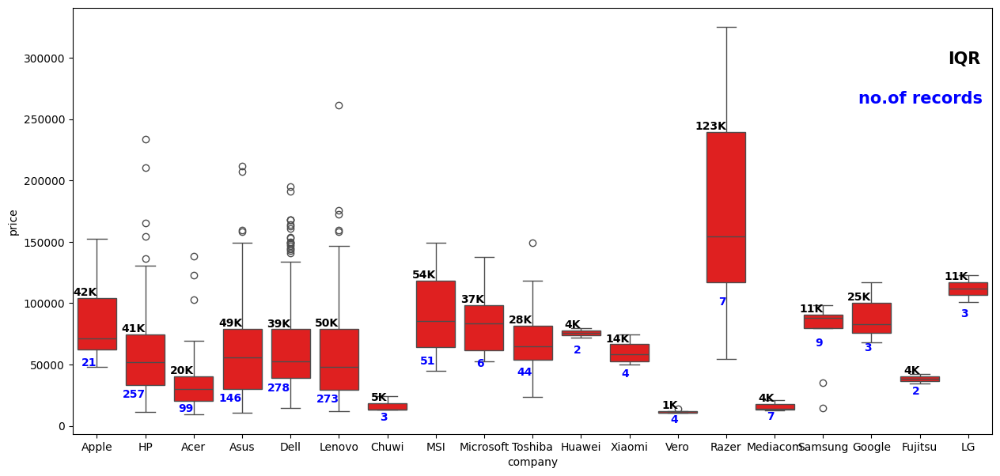

In [87]:
plt.figure(figsize = (15,7))
ax = sns.boxplot(data=df, x='company', y='price', color='red')
# ax.set_xticklabels(ax.get_xticklabels(), rotation=30)
col = 'company'
# Annotate IQR
for category in df[col].unique():
    data_category = df[df[col] == category]['price']
    Q1, Q3 = np.percentile(data_category, [25, 75])
    IQR = Q3 - Q1
    x_pos = list(df[col].unique()).index(category)
    ax.text(x_pos, Q3, f'{IQR/1000:.0f}K', ha='right', va='bottom', fontsize=10, color='black', fontweight='bold')
    no_of_records = len(data_category)
    ax.text(x_pos, Q1*0.9, f'{no_of_records}', ha='right', va='top', fontsize=10, color='blue', fontweight='bold')


ax.text(len(df[col].unique())-0.75, df['price'].max()*0.9, f'IQR', ha='right', va='bottom', fontsize=15, color='black', fontweight='bold')
ax.text(len(df[col].unique())-0.7, df['price'].max()*0.8, f'no.of records', ha='right', va='bottom', fontsize=15, color='blue', fontweight='bold')


* Razer Laptop exhibits high price variability(123k) despite having a low number of records(7), suggesting premium and diverse offerings.
* Dell, Lenova and HP each with over 250 models display similar price distributions, indicating they are closely competing in the mainstream laptop market.
* Brands like Apple and MSI, though with fewer models than Dell/Lenovo/HP, show higher median prices, hinting at a focus on premium segments.
* Companies like Chuwi, Vero, and Mediacom have low prices and limited offerings, possibly targeting the budget segment.



#### C) PRICE DISTRIBUTION WRT CONTINUOUS FEATURES

<Axes: xlabel='clock_speed', ylabel='price_log'>

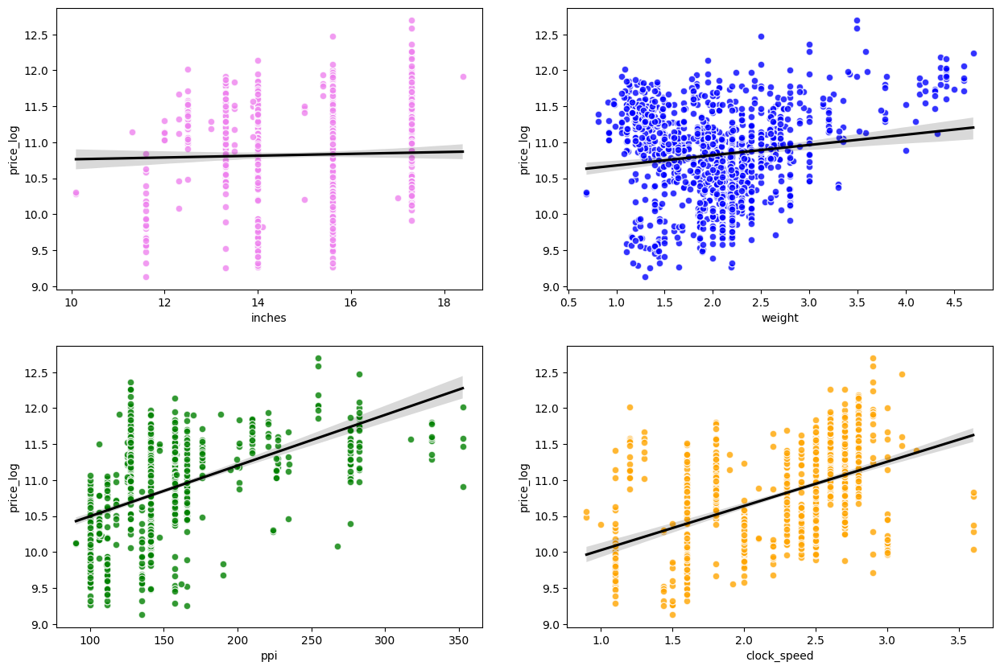

In [88]:
# SCATTERPLOT ANALYSIS OF CORRELATION COLUMNS
fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(2,2,1)
sns.regplot(data=df, x='inches', y='price_log', ax=ax1, 
            scatter=True, color='black', scatter_kws={'color': 'violet','edgecolor':'white','s':40})
ax2 = fig.add_subplot(2,2,2)
sns.regplot(data=df, x='weight', y='price_log', ax=ax2, 
            scatter=True, color='black', scatter_kws={'color': 'blue','edgecolor':'white','s':40})
ax3 = fig.add_subplot(2,2,3)
sns.regplot(data=df, x='ppi', y='price_log', ax=ax3, 
            scatter=True, color='black', scatter_kws={'color': 'green','edgecolor':'white','s':40})
ax4 = fig.add_subplot(2,2,4)
sns.regplot(data=df, x='clock_speed', y='price_log', ax=ax4, 
            scatter=True, color='black', scatter_kws={'color': 'orange','edgecolor':'white','s':40})

Among the 4 plots 
* ppi shows the strongest positive correlation with price_log -- higer display quality clearly increase the price 
* clock speed also has strong positive trend suggesting better processors(cpu) come with higher prices 
* weight shows a slight positive correlation possibly indicating that heavier laptops (like gaming / workstation) cost more. 
* inches has minimal impact on price_log indicating prices don't vary across screen sizes

<Axes: >

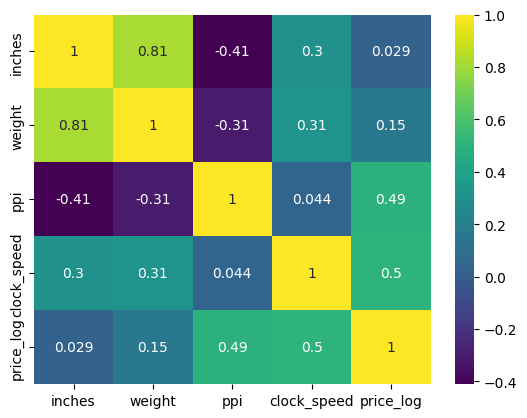

In [89]:
sns.heatmap(df[['inches','weight','ppi','clock_speed','price_log']].corr(method = 'pearson'),annot=True,cmap= 'viridis')

* as discussed above ppi and clock speed has moderate linear relationship with price_log 
* weight has low linear relationship with price_log 
* inches has negligible relationship with price_log 
* inches and weight has high positive correlation indicating heavier laptops comes with large screen size.

note: The high correlation between inches and weight column may affect Linear models. So if the final model selection is linear then dropping one of the feature between inches and weight( probably inches) is good practice to avoid multicollinearity issue.

#### D) KDE PLOT OF PRICE FEATURE WRT CATEGORIES

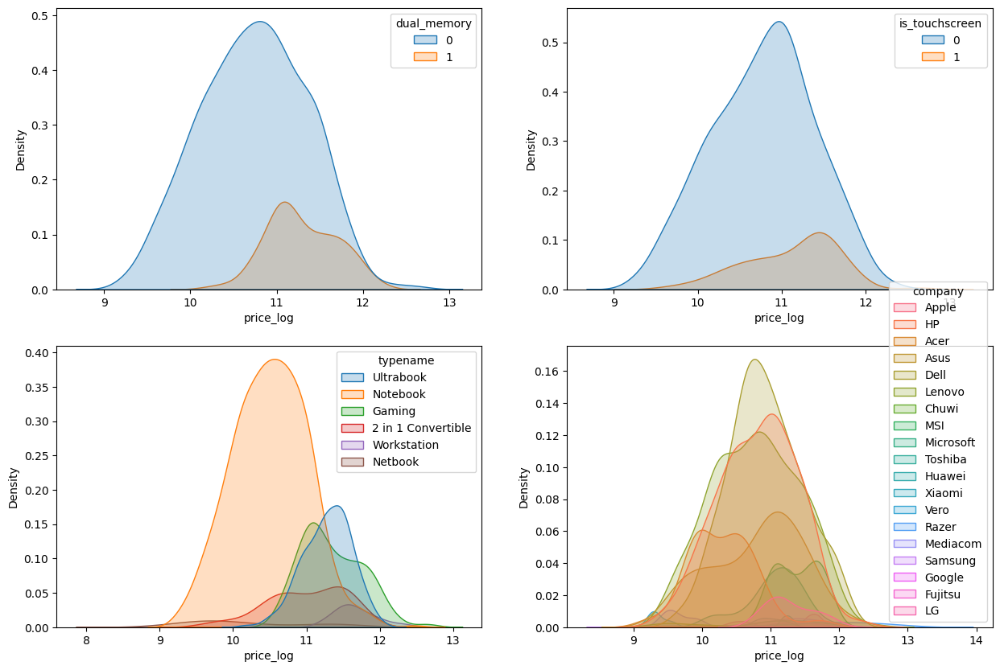

In [90]:
fig = plt.figure(figsize=(15,10))
cols = ['dual_memory','is_touchscreen','typename','company',]
for i in range(4):
    ax1 = fig.add_subplot(2,2,i+1)
    sns.kdeplot(data = df, x='price_log',hue=cols[i],fill=True,color = 'violet',ax=ax1)

### 3. MULTIVARIATE ANALYSIS

<Axes: xlabel='clock_speed', ylabel='price_log'>

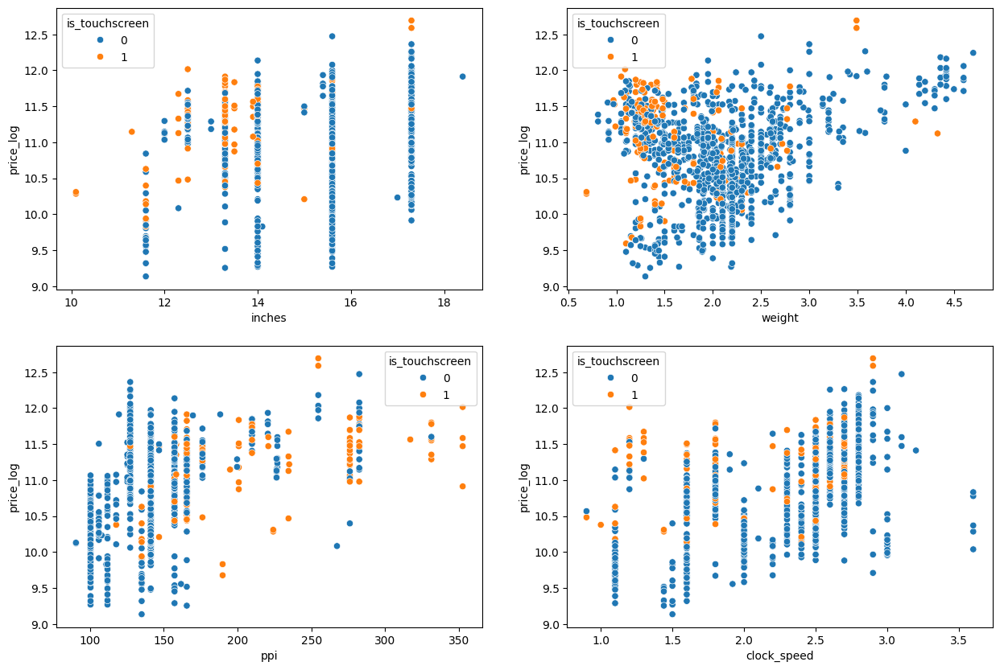

In [91]:
# SCATTERPLOT ANALYSIS OF CORRELATION COLUMNS
fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(2,2,1)
sns.scatterplot(data = df, x='inches',y='price_log',hue='is_touchscreen',color = 'violet',ax=ax1)
ax2 = fig.add_subplot(2,2,2)
sns.scatterplot(data = df, x='weight',y='price_log',hue='is_touchscreen',color = 'blue',ax=ax2)
ax3 = fig.add_subplot(2,2,3)
sns.scatterplot(data = df, x='ppi',y='price_log',hue='is_touchscreen',color = 'green',ax=ax3)

ax4 = fig.add_subplot(2,2,4)
sns.scatterplot(data = df, x='clock_speed',y='price_log',hue='is_touchscreen',color = 'orange',ax=ax4)


- Touchscreen laptops tend to:
    - Be lighter
    - Have higher PPI
    - Cost more at similar spec levels

- Touchscreen appears to amplify price, especially when combined with other premium features.

<Axes: xlabel='clock_speed', ylabel='price_log'>

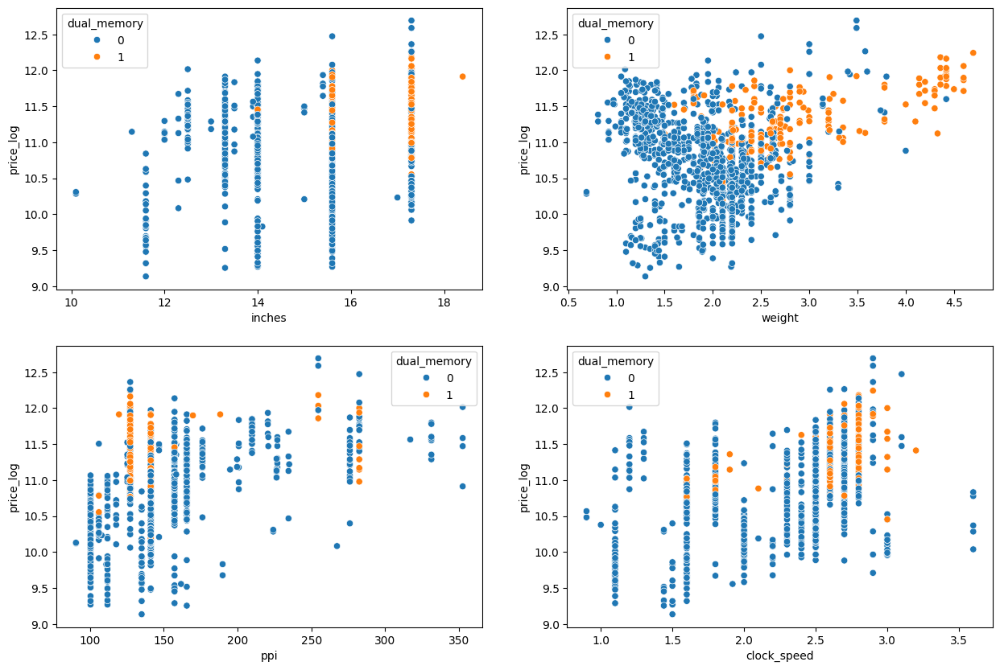

In [92]:
# SCATTERPLOT ANALYSIS OF CORRELATION COLUMNS
fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(2,2,1)
sns.scatterplot(data = df, x='inches',y='price_log',hue='dual_memory',color = 'violet',ax=ax1)
ax2 = fig.add_subplot(2,2,2)
sns.scatterplot(data = df, x='weight',y='price_log',hue='dual_memory',color = 'blue',ax=ax2)
ax3 = fig.add_subplot(2,2,3)
sns.scatterplot(data = df, x='ppi',y='price_log',hue='dual_memory',color = 'green',ax=ax3)
ax4 = fig.add_subplot(2,2,4)
sns.scatterplot(data = df, x='clock_speed',y='price_log',hue='dual_memory',color = 'orange',ax=ax4)

- Dual memory feature is mosi common in the laptops whcih tend to : 
    - Be heavier
    - High processor 
    - Low ppi 
    - High screen size 

* on similar spec level dual memory laptop costs more.

### 4. OVERALL CONCLUSION: EDA SUMMARY


#### Univariate Analysis
- **Screen Resolution:**  
  - **1920x1080** (Full HD) is the most common resolution.
- **Touchscreen Feature:**  
  - 176 laptop models support touchscreen.
- **Screen Size:**  
  - The **15.6"** diagonal size is most frequent (619/1219 models).
- **Storage & Memory:**  
  - SSD is the most common secondary storage.
  - 196 laptop models have dual memory.
  - 8 GB is the most common RAM size.
- **CPU & GPU:**  
  - Among the top 10 CPUs, all are Intel variants.
  - Top 10 GPUs: Intel (4), NVIDIA (3), AMD (1).
  - The most common CPU clock speed is **2.5 GHz** (273 models).
- **Operating System & Brands:**  
  - Windows 10 dominates (999/1219 laptops).
  - Lenovo, Dell, and HP lead in brand variety.
  - Notebook is the predominant laptop type.
- **Weight:**  
  - The distribution is slightly right-skewed with moderate variability.  
  - Most laptops weigh between **1.5 kg and 2.5 kg**, peaking around **2.2 kg**.
- **PPI (Pixels Per Inch):**  
  - Heavily right-skewed with most values between **100 and 170 ppi**, peaking near **141 ppi**.
- **Price:**  
  - Strongly right-skewed, with most models between **₹20,000 and ₹60,000**, and a few outliers above **₹150,000**.
  - A log transformation of price results in an almost normal distribution (centered around 10.5 to 11).

#### Bivariate Analysis
- **Screen Resolution vs. Price:**  
  - Higher resolution is generally associated with an increase in mean price.
- **Touchscreen vs. Price:**  
  - Laptops with touchscreen features tend to have a higher mean price.
- **Screen Size vs. Price:**  
  - A positive but non-linear correlation exists; certain screen sizes imply premium models.
- **Dual Memory & RAM:**  
  - Dual memory laptops and increased RAM generally command higher prices.
- **Brand, Type & OS Trends:**  
  - Premium brands like Razer, LG, Apple, and MSI show higher average prices.
  - Budget models are often from brands like Chuwi and Mediacom.
  - Different laptop types (workstations, gaming, notebooks, netbooks, ultrabooks) and operating systems display distinct pricing trends.
- **Correlation Insights:**  
  - **PPI** and **clock speed** show strong positive correlations with log-transformed price.
  - **Weight** has a slight positive trend, possibly indicating that heavier laptops (e.g., gaming/workstations) are costlier.
  - **Inches (screen size)** shows minimal impact on price when considered alone.
  - A high positive correlation exists between **inches and weight**, suggesting that larger screens are generally found in heavier laptops.

#### Multivariate Analysis
- **Touchscreen Laptops:**  
  - Tend to be lighter, offer higher PPI, and are priced higher.
- **Dual Memory Laptops:**  
  - Generally heavier, with higher-performing processors, lower PPI, and larger screens.
- **Key Observations:**  
  - Premium features like touchscreen and dual memory amplify pricing, especially when combined with other high-end specs.
  - **Multicollinearity Alert:** The strong correlation between **inches** and **weight** could negatively impact linear models, suggesting one may need to be dropped (preferably **inches**) if using such models.

*Overall, the EDA reveals distinct trends and correlations among laptop specifications that drive pricing, with both univariate and bivariate analyses confirming premium features and higher-performance metrics positively impacting prices.*


## V. FEATURE ENGINEERING 

### 1. REMOVING UNNECESSARY COLUMUNS

In [93]:
df.columns

Index(['company', 'typename', 'inches', 'cpu', 'ram', 'gpu', 'opsys', 'weight',
       'price', 'ssd', 'hdd', 'flashstorage', 'hybrid', 'dual_memory',
       'screen_tech', 'screen_width', 'screen_height', 'aspect_ratio',
       'is_touchscreen', 'ppi', 'clock_speed', 'price_log'],
      dtype='object')

In [94]:
try:
    df = df.drop(columns=['screen_width','screen_height','aspect_ratio'])
    print('dropped unnecessary columnn')
except: 
    print('error raised, the unnecessary columns are removed')
df.info()

dropped unnecessary columnn
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1219 entries, 0 to 1218
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   company         1219 non-null   object 
 1   typename        1219 non-null   object 
 2   inches          1219 non-null   float64
 3   cpu             1219 non-null   object 
 4   ram             1219 non-null   float64
 5   gpu             1219 non-null   object 
 6   opsys           1219 non-null   object 
 7   weight          1219 non-null   float64
 8   price           1219 non-null   float64
 9   ssd             1219 non-null   int64  
 10  hdd             1219 non-null   int64  
 11  flashstorage    1219 non-null   int64  
 12  hybrid          1219 non-null   int64  
 13  dual_memory     1219 non-null   int64  
 14  screen_tech     1219 non-null   object 
 15  is_touchscreen  1219 non-null   int64  
 16  ppi             1219 non-null   float64
 17  clock

* We can remove screen_width, screen_height, aspect_ratio as the data is captured by ppi 


### 2. HYPOTHESIS TESTING

In [95]:
df.head()

,company,typename,inches,cpu,ram,gpu,opsys,weight,price,ssd,hdd,flashstorage,hybrid,dual_memory,screen_tech,is_touchscreen,ppi,clock_speed,price_log
0,Apple,Ultrabook,13.3,Intel Core i5 2.3GHz,8.0,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,128,0,0,0,0,IPS,0,226.98,2.3,11.175755
1,Apple,Ultrabook,13.3,Intel Core i5 1.8GHz,8.0,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,0,128,0,0,Unknown,0,127.68,1.8,10.776777
2,HP,Notebook,15.6,Intel Core i5 7200U 2.5GHz,8.0,Intel HD Graphics 620,No OS,1.86,30636.0000,256,0,0,0,0,Full HD,0,141.21,2.5,10.329931
3,Apple,Ultrabook,15.4,Intel Core i7 2.7GHz,16.0,AMD Radeon Pro 455,macOS,1.83,135195.3360,512,0,0,0,0,IPS,0,220.53,2.7,11.814476
4,Apple,Ultrabook,13.3,Intel Core i5 3.1GHz,8.0,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,256,0,0,0,0,IPS,0,226.98,3.1,11.473101


In [96]:
df.columns

Index(['company', 'typename', 'inches', 'cpu', 'ram', 'gpu', 'opsys', 'weight',
       'price', 'ssd', 'hdd', 'flashstorage', 'hybrid', 'dual_memory',
       'screen_tech', 'is_touchscreen', 'ppi', 'clock_speed', 'price_log'],
      dtype='object')

#### A) CORRELATION ANALYSIS

In [97]:
continuous_variables = ['clock_speed','inches','weight','ppi','ssd','hdd','flashstorage','hybrid','ram']

In [98]:
# correlation analysis

def correlation_test(df,cont_variable,target_variable):
    var_stat,var_p_value = shapiro(df[cont_variable])
    if var_p_value>=0.05:
        print(f'{cont_variable} is normally distributed --> using pearson correlation')
        corr, p_value = pearsonr(df[target_variable],df[cont_variable])
    else:
        print(f'{cont_variable} is not normally distributed --> using spearman correlation')
        corr, p_value = spearmanr(df[target_variable],df[cont_variable])
    if p_value <0.05:
        print(f'p_value: {p_value}, So "{cont_variable}" is statistcally significant and required\n') 
    else:
        print(f'p_value: {p_value}, So "{cont_variable}" is statistcally insignificant and does not required  <<==  <<==\n') 
    return corr,p_value

corr_parameter_dict = {}    
for i in continuous_variables:
    corr,p_value = correlation_test(df,i,'price_log')
    corr_parameter_dict[i] = [corr,p_value]


clock_speed is not normally distributed --> using spearman correlation
p_value: 3.5444070112480644e-88, So "clock_speed" is statistcally significant and required

inches is not normally distributed --> using spearman correlation
p_value: 0.049936128435960625, So "inches" is statistcally significant and required

weight is not normally distributed --> using spearman correlation
p_value: 0.40253405594418346, So "weight" is statistcally insignificant and does not required  <<==  <<==

ppi is not normally distributed --> using spearman correlation
p_value: 3.100454573825902e-85, So "ppi" is statistcally significant and required

ssd is not normally distributed --> using spearman correlation
p_value: 1.848760707511492e-170, So "ssd" is statistcally significant and required

hdd is not normally distributed --> using spearman correlation
p_value: 8.570820715623201e-08, So "hdd" is statistcally significant and required

flashstorage is not normally distributed --> using spearman correlation
p_

* From variability test it is found that all continuous variables distribution is not normal. so, for correlation analysis spearman method is employed 
* From spearman corr test it is found that weight and hybrid columns are statistically insignificant.
* Later we will descretize inches and weight columns and perform anova test to check for any significance.

#### B) T-TEST

In [99]:
categorical_variables = ['is_touchscreen','dual_memory']

In [100]:
def students_ttest(df,cat_variable,target_variable):
    if df[cat_variable].nunique()!=2:
        print(f"{cat_variable} variable doesn't contain 2 categories use anova or other tests for proper results ")
        return None
    variable_group1,variable_group2 =[df[df[cat_variable]==var][target_variable]for var in df[cat_variable].unique()]
    stat,var_p_value = levene(variable_group1,variable_group2)
    #Null Hypothesis for shape test ==> variances are equal
    if var_p_value>=0.05: #Failing to Reject Null Hypothesis
        print(f'{var_p_value} is greater than or equal 0.05, variances are equal --> Proceeding with students ttest for "{cat_variable}" column')
        t_stat,p_value = ttest_ind(variable_group1,variable_group2,equal_var=True)

    else: # Rejecting Null hypothesis
        print(f'{var_p_value} is less than 0.05, variances are significantly different --> Using Welchs ttest for "{cat_variable}" column')
        t_stat,p_value = ttest_ind(variable_group1,variable_group2,equal_var=False)
    # Null Hypothesis for categorical_variable: The means of two groups are equal ==> cat_variable doesn't impact the target variable
    if p_value <0.05:# Rejecting null hypothesis
        print(f'p_value: {p_value}, So "{cat_variable}" is statistcally significant and required\n') 

    else:# Accepting Null Hypothesis
        print(f'p_value: {p_value}, So "{cat_variable}" is statistcally insignificant and does not required  <<==  <<==\n') 
    return t_stat,p_value

ttest_parameter_dict = {}    
for i in categorical_variables:
    t_stat,p_value = students_ttest(df,i,'price_log')
    ttest_parameter_dict[i] = [t_stat,p_value]


0.05586640088092453 is greater than or equal 0.05, variances are equal --> Proceeding with students ttest for "is_touchscreen" column
p_value: 1.5854720429319426e-11, So "is_touchscreen" is statistcally significant and required

6.94911531134758e-11 is less than 0.05, variances are significantly different --> Using Welchs ttest for "dual_memory" column
p_value: 5.892730598203667e-45, So "dual_memory" is statistcally significant and required



* the binary categorical variables `is_touchscreen` and `dual_memory` need to undergo ttest to determine significance in pric_log column 
* The variance in the is_touchscreen feature categories was found to be equal from levene test; therefore, a Student’s t-test was conducted, which showed that the feature is statistically significant.
* The variance in the is_touchscreen feature categories was found to be not equal from levene test; therefore, a Welch’s t-test was conducted, which showed that the feature is statistically significant.

#### C) ANOVA TEST 

In [101]:
multi_categorical_variables = list(set(df.columns) - set(continuous_variables) - {'price', 'price_log'} - set(categorical_variables))
print(multi_categorical_variables)

['gpu', 'company', 'cpu', 'typename', 'opsys', 'screen_tech']


In [102]:

def anova_test(df,cat_variable,target_variable):
    variable_groups =[df[df[cat_variable]==var][target_variable]for var in df[cat_variable].unique()]
    stat,var_p_value = levene(*variable_groups)
    #Null Hypothesis for shape test ==> variances are equal
    if var_p_value>=0.05: #Failing to Reject Null Hypothesis
        print(f'{var_p_value} is greater than or equal 0.05, variances are equal --> Proceed with one-way anova for "{cat_variable}" column')
        f_stat, p_value = f_oneway(*variable_groups)

    else: # Rejecting Null hypothesis
        print(f'{var_p_value} is less than 0.05, variances are significantly different --> Use Welchs anova for "{cat_variable}" column')
        anova_results = pg.welch_anova(data=df, dv="price_log", between=cat_variable)
        p_value = anova_results.iloc[0]['p-unc']
        
    # Null Hypothesis for categorical_variable: The means of two groups are equal ==> cat_variable doesn't impact the target variable
    if p_value <0.05:# Rejecting null hypothesis
        print(f'p_value: {p_value}, So "{cat_variable}" is statistcally significant and required\n') 

    else:# Accepting Null Hypothesis
        print(f'p_value: {p_value}, So "{cat_variable}" is statistcally insignificant and does not required  <<==  <<==\n') 
    return p_value

anova_parameter_dict = {}    
for i in multi_categorical_variables:
    p_value = anova_test(df,i,'price_log')
    anova_parameter_dict[i] = p_value

2.5958473475894558e-39 is less than 0.05, variances are significantly different --> Use Welchs anova for "gpu" column
p_value: 3.775903211451267e-101, So "gpu" is statistcally significant and required

1.1746229639582795e-10 is less than 0.05, variances are significantly different --> Use Welchs anova for "company" column
p_value: 2.515369246797676e-16, So "company" is statistcally significant and required

5.5785034215251994e-14 is less than 0.05, variances are significantly different --> Use Welchs anova for "cpu" column
p_value: 1.0, So "cpu" is statistcally insignificant and does not required  <<==  <<==

6.788945541232906e-15 is less than 0.05, variances are significantly different --> Use Welchs anova for "typename" column
p_value: 6.118759913181161e-59, So "typename" is statistcally significant and required

1.2294219360538114e-05 is less than 0.05, variances are significantly different --> Use Welchs anova for "opsys" column
p_value: 4.436872778718627e-21, So "opsys" is statist

In [103]:
#The `cpu` column is showing 1.0 and produced a warning, it is because many categories in the `cpu` column has too few values when 
# you observe value_counts we can see that within group variance is negligible
print(df['cpu'].nunique())
df['cpu'].value_counts().tail(53)

118


cpu
AMD A6-Series A6-9220 2.5GHz             2
AMD E-Series 9000e 1.5GHz                1
Intel Core i7 2.9GHz                     1
Intel Celeron Dual Core N3060 1.60GHz    1
AMD A12-Series 9700P 2.5GHz              1
Intel Core i7 7500U 2.5GHz               1
Intel Pentium Dual Core 4405U 2.1GHz     1
AMD A4-Series 7210 2.2GHz                1
Intel Core i7 6560U 2.2GHz               1
Intel Core M m7-6Y75 1.2GHz              1
AMD FX 8800P 2.1GHz                      1
Intel Core M M7-6Y75 1.2GHz              1
Intel Core i5 7200U 2.50GHz              1
Intel Core i5 7200U 2.70GHz              1
Intel Core i5 7200U 2.7GHz               1
Intel Pentium Dual Core N4200 1.1GHz     1
Intel Core M m3 1.2GHz                   1
Intel Pentium Dual Core 4405Y 1.5GHz     1
Intel Core i7 2.8GHz                     1
Intel Core M 6Y54 1.1GHz                 1
Intel Core i7 2.2GHz                     1
Intel Core i5 2.9GHz                     1
Intel Core i7 2.7GHz                     1
Samsung

* Almost 52 out of 118 groups contain only 1 record so welch anova test failed

* Levene's test revealed that all multi categorical features exhibits heterogenous vaiances across groups; Therefore, Welch's anova test was apllied for the categories.
* The results of Welch’s ANOVA indicated that the cpu feature is statistically insignificant. However, this is likely due to the fact that cpu contains many low-frequency categories (with fewer than 2 observations).
* To address this issue, we will group rare categories under a new label "Other" for both the cpu and gpu columns, and re-run the ANOVA test to obtain more reliable results.

### 3. CREATING & TESTING NEW FEATURES & APPLYING HYPOTHESIS TESTING

#### A) DISCRETIZATION OF INCHES AND WEIGHT COLUMN

In [104]:
# Define bins and labels for screen size
inches_bins = [0, 12, 14, 16, float('inf')]  #0 and float('inf') is given to avoid np.nan values
inches_labels = ["Ultraportable", "Thin & Light", "Mainstream", "Desktop Replacement"]

# Apply binning
df['screen_category'] = pd.cut(df['inches'], bins=inches_bins, labels=inches_labels, include_lowest=True)

# Display
df[['inches', 'screen_category']].head()

,inches,screen_category
0,13.3,Thin & Light
1,13.3,Thin & Light
2,15.6,Mainstream
3,15.4,Mainstream
4,13.3,Thin & Light


In [105]:

# Define bins and labels for weight
weight_bins = [0, 1.5, 2.5, 4, float('inf')]  
weight_labels = ["Ultra-Light", "Lightweight", "Medium", "Heavy"]

# Apply binning
df['weight_category'] = pd.cut(df['weight'], bins=weight_bins, labels=weight_labels, include_lowest=True)

# Display
df[['weight', 'weight_category']].head()


,weight,weight_category
0,1.37,Ultra-Light
1,1.34,Ultra-Light
2,1.86,Lightweight
3,1.83,Lightweight
4,1.37,Ultra-Light


#### B) GROUPING CPU and GPU COLUMN

In [106]:
# converting cpu and gpu columns
df['cpu_common'] =df['cpu'].apply(lambda x: x if len(df[df['cpu']==x]) >9 else 'other')
df['gpu_common'] =df['gpu'].apply(lambda x: x if len(df[df['gpu']==x]) >9 else 'other')
print(df['cpu_common'].nunique())
print(df['gpu_common'].nunique())

23
25


#### C) PERFORMING ANOVA TEST FOR NEW FEATURES

In [107]:
new_features = ['screen_category','weight_category','cpu_common','gpu_common']
for i in new_features:
    p_value = anova_test(df,i,'price_log')

0.04582519027042498 is less than 0.05, variances are significantly different --> Use Welchs anova for "screen_category" column
p_value: 4.4218193074794834e-30, So "screen_category" is statistcally significant and required

7.633601867110344e-05 is less than 0.05, variances are significantly different --> Use Welchs anova for "weight_category" column
p_value: 6.77758760416546e-60, So "weight_category" is statistcally significant and required

2.1135976722155184e-95 is less than 0.05, variances are significantly different --> Use Welchs anova for "cpu_common" column
p_value: 6.648476087697272e-106, So "cpu_common" is statistcally significant and required

1.280661211935475e-58 is less than 0.05, variances are significantly different --> Use Welchs anova for "gpu_common" column
p_value: 1.7838546487316967e-107, So "gpu_common" is statistcally significant and required



* The inches and weight column are descritized into screen_category and weight_category columns respectively.
* The rare groups(<10 occurence) in the cpu and gpu features are grouped into 'other' category
* after performing levene test it is found that variability is heterogenous across groups so welch's anova test is performet 
* The welch's Anova test reveled that all 4 features are signinficant.

### 4. OVERALL CONCLUSION : FEATURE ENGINEERING

Based on statistical testing and preprocessing insights, the following feature engineering steps and conclusions were drawn:

- From normality tests, all continuous variables were found to have non-normal distributions. Therefore, **Spearman correlation** was used instead of Pearson's for assessing relationships.
- **Spearman correlation results** indicated that `weight` and `hybrid` columns were **statistically insignificant**, suggesting limited predictive power in their raw form.
- To capture possible non-linear effects and improve interpretability, the **`inches`** and **`weight`** columns were **discretized** into new features: `screen_category` and `weight_category`.

#### Binary Categorical Variables
- For binary variables such as **`is_touchscreen`** and **`dual_memory`**, **Levene’s test** was conducted to check variance equality between groups:
  - `is_touchscreen`: Equal variances ⇒ **Student’s t-test** → statistically **significant**.
  - `dual_memory`: Unequal variances ⇒ **Welch’s t-test** → statistically **significant**.

#### Multi-Categorical Variables
- **Levene’s test** on all multi-categorical variables revealed **heterogeneous variances**.
  - Therefore, **Welch’s ANOVA** was applied.
- Initially, the **`cpu`** feature was found to be **statistically insignificant**, likely due to many rare categories with insufficient samples.
- To improve category robustness:
  - Rare categories (<10 occurrences) in **`cpu`** and **`gpu`** were grouped into a new category labeled `"Other"`.
  - Discretized versions of `inches` and `weight` were also added to mitigate multicollinearity and skewness.
- After these refinements, **Welch’s ANOVA** confirmed that all four features (`cpu`, `gpu`, `screen_category`, `weight_category`) were **statistically significant** in relation to the `price_log`.

##### Summary
- **Feature engineering decisions** were data-driven, guided by statistical tests.
- **Discretization** and **grouping rare categories** improved model robustness.
- **Statistical testing** ensured that only meaningful features are retained for modeling, setting a strong foundation for the predictive phase.


## VI. INITIAL ASSESSMENT FOR SELECTING THE BEST ML MODEL

### 1.ENCODING

#### A) NOMINAL/ORDINAL ENCODING

In [108]:
from sklearn.preprocessing import OneHotEncoder
# one_hot_encoding to verify model performances
cols1 = df.select_dtypes(include='object').columns.difference(['cpu','gpu'])
onehot_encoding_initial = OneHotEncoder(sparse_output=False,drop='first')
onehot_encoding_initial_array = onehot_encoding_initial.fit_transform(df[cols1])
onehot_encoding_initial_df = pd.DataFrame(data = onehot_encoding_initial_array,columns = onehot_encoding_initial.get_feature_names_out())
onehot_encoding_initial_df.head()

,company_Apple,company_Asus,company_Chuwi,company_Dell,company_Fujitsu,company_Google,company_HP,company_Huawei,company_LG,company_Lenovo,...,opsys_Windows 10 S,opsys_Windows 7,opsys_macOS,screen_tech_IPS,screen_tech_Unknown,typename_Gaming,typename_Netbook,typename_Notebook,typename_Ultrabook,typename_Workstation
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [109]:
#Ordinal Encoding for object datatype
# cols1 = df.select_dtypes(include='object').columns
cols2 = df.select_dtypes(include = 'category').columns
# cols = list(cols1) + list(cols2)
screen_order = ['Ultraportable','Thin & Light','Mainstream','Desktop Replacement'][::-1]
weight_order = ['Heavy','Medium','Lightweight','Ultra-Light']
# order = [df[col].unique() for col in cols1]
# order = order +[screen_order,weight_order]
ordinal_encoding_initial = OrdinalEncoder(categories =[screen_order,weight_order] )
ordinal_encoding_initial_array = ordinal_encoding_initial.fit_transform(df[cols2])
ordinal_encoding_initial_df = pd.DataFrame(data = ordinal_encoding_initial_array,columns = cols2)
ordinal_encoding_initial_df.head()

,screen_category,weight_category
0,2.0,3.0
1,2.0,3.0
2,1.0,2.0
3,1.0,2.0
4,2.0,3.0


In [110]:
df_initial_encoded = pd.concat([ordinal_encoding_initial_df,df.select_dtypes(include='number'),onehot_encoding_initial_df],axis=1)
df_initial_encoded.head()

,screen_category,weight_category,inches,ram,weight,price,ssd,hdd,flashstorage,hybrid,...,opsys_Windows 10 S,opsys_Windows 7,opsys_macOS,screen_tech_IPS,screen_tech_Unknown,typename_Gaming,typename_Netbook,typename_Notebook,typename_Ultrabook,typename_Workstation
0,2.0,3.0,13.3,8.0,1.37,71378.6832,128,0,0,0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,2.0,3.0,13.3,8.0,1.34,47895.5232,0,0,128,0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,1.0,2.0,15.6,8.0,1.86,30636.0000,256,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,1.0,2.0,15.4,16.0,1.83,135195.3360,512,0,0,0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,2.0,3.0,13.3,8.0,1.37,96095.8080,256,0,0,0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


* for basic evalutaion using  ordinalEncoder to encode all variables

### 2. FEATURE-TARGET VARIABLE SEGMENTATION

In [111]:
X_initial = df_initial_encoded.drop(columns = ['price_log','price'])
y_initial = df_initial_encoded['price_log']
y_initial_exp = df_initial_encoded['price']
print('X_initial.shape:',X_initial.shape)
print('y_initial.shape:',y_initial.shape)
print('y_initial_exp.shape:',y_initial_exp.shape)


X_initial.shape: (1219, 92)
y_initial.shape: (1219,)
y_initial_exp.shape: (1219,)


### 3. SCALING

In [112]:
X_initial = X_initial.astype('float64')
sc = StandardScaler()
X_initial.iloc[:,:] = sc.fit_transform(X_initial)
X_initial.head()

,screen_category,weight_category,inches,ram,weight,ssd,hdd,flashstorage,hybrid,dual_memory,...,opsys_Windows 10 S,opsys_Windows 7,opsys_macOS,screen_tech_IPS,screen_tech_Unknown,typename_Gaming,typename_Netbook,typename_Notebook,typename_Ultrabook,typename_Workstation
0,1.035410,1.324623,-1.218353,-0.092287,-0.997244,-0.312188,-0.792922,-0.147525,-0.089807,-0.437714,...,-0.081278,-0.195782,9.631679,1.601352,-0.633364,-0.439044,-0.13557,-1.117621,2.349195,-0.156108
1,1.035410,1.324623,-1.218353,-0.092287,-1.041634,-0.991830,-0.792922,3.974725,-0.089807,-0.437714,...,-0.081278,-0.195782,9.631679,-0.624472,1.578872,-0.439044,-0.13557,-1.117621,2.349195,-0.156108
2,-0.363886,-0.096781,0.409039,-0.092287,-0.272204,0.367454,-0.792922,-0.147525,-0.089807,-0.437714,...,-0.081278,-0.195782,-0.103824,-0.624472,-0.633364,-0.439044,-0.13557,0.894757,-0.425678,-0.156108
3,-0.363886,-0.096781,0.267527,1.334000,-0.316594,1.726738,-0.792922,-0.147525,-0.089807,-0.437714,...,-0.081278,-0.195782,9.631679,1.601352,-0.633364,-0.439044,-0.13557,-1.117621,2.349195,-0.156108
4,1.035410,1.324623,-1.218353,-0.092287,-0.997244,0.367454,-0.792922,-0.147525,-0.089807,-0.437714,...,-0.081278,-0.195782,9.631679,1.601352,-0.633364,-0.439044,-0.13557,-1.117621,2.349195,-0.156108


### 4. DATA PARTITIONING

In [113]:

X_initial_train,X_initial_test,y_initial_train,y_initial_test = train_test_split(X_initial,y_initial,test_size=0.2,random_state=42)
print('X_initial_train.shape',X_initial_train.shape)
print('X_initial_test.shape',X_initial_test.shape)
print('y_initial_train.shape',y_initial_train.shape)
print('y_initial_test.shape',y_initial_test.shape)


X_initial_train.shape (975, 92)
X_initial_test.shape (244, 92)
y_initial_train.shape (975,)
y_initial_test.shape (244,)


### 5. MODEL SELECTION

In [114]:
from sklearn.linear_model import Lasso,Ridge
models = {
    "Linear":LinearRegression(),
    "Lasso": Lasso(),
    "Ridge": Ridge(),
    "KNN":KNeighborsRegressor(n_neighbors=5),
    "Decision Tree":DecisionTreeRegressor(random_state=42),
    "Random Forest":RandomForestRegressor(n_estimators=100,random_state=42),
    "SVR-Linear":SVR(kernel = 'linear'),
    "SVR-NonLinear":SVR(kernel='rbf'),
    "XGBoost":XGBRegressor(n_estimators=100,random_state = 42)
}

In [115]:
def model_predictions(model,X_train,y_train,X_test):
    model.fit(X_train,y_train)
    return model.predict(X_train),model.predict(X_test)
def metrics(y_pred,y_test):
    r2 = r2_score(y_pred,y_test)
    mae = mean_absolute_error(y_pred,y_test)
    mse = mean_squared_error(y_pred,y_test)
    rmse = root_mean_squared_error(y_pred,y_test)
    return {"MAE":round(mae,2),"MSE":round(mse,2),"RMSE":round(rmse,2),"R2_SCORE":round(r2,4)}

In [116]:
predictions = {}
results = {}
for name,model in models.items():
    y_initial_train_pred,y_initial_test_pred = model_predictions(model,X_initial_train,y_initial_train,X_initial_test)
    train_results = metrics(y_initial_train_pred,y_initial_train)
    test_results = metrics(y_initial_test_pred,y_initial_test)
    predictions[name] = [y_initial_train_pred,y_initial_test_pred]
    results[name+"_train_results"] = train_results 
    results[name+"_test_results"] = test_results 

In [117]:
results_df = pd.DataFrame(results).T.round(3)
for col in results_df.columns:
    results_df[col] = results_df[col].apply(lambda x: x if abs(x)<3 else 0)
pd.set_option('display.float_format', '{:.3f}'.format)
results_df

,MAE,MSE,RMSE,R2_SCORE
Linear_train_results,0.180,0.050,0.230,0.842
Linear_test_results,0.000,0.000,0.000,-0.004
Lasso_train_results,0.510,0.390,0.620,0.000
Lasso_test_results,0.510,0.390,0.620,0.000
Ridge_train_results,0.180,0.050,0.230,0.841
Ridge_test_results,0.190,0.060,0.250,0.815
KNN_train_results,0.160,0.050,0.220,0.851
KNN_test_results,0.190,0.060,0.250,0.811
Decision Tree_train_results,0.000,0.000,0.000,1.000
Decision Tree_test_results,0.210,0.080,0.290,0.778


In [118]:
# resetting the pd.set_option
pd.reset_option('display.float_format')

### 6. GRAPHICAL REPRESENTATIONS OF Y_TEST and Y_PRED FOR VARIOUS MODELS

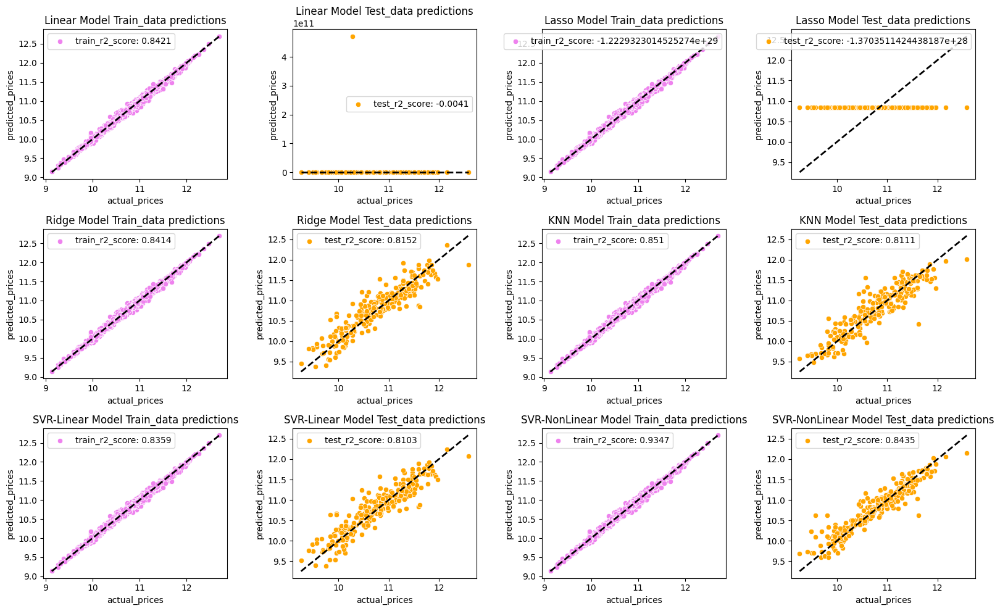

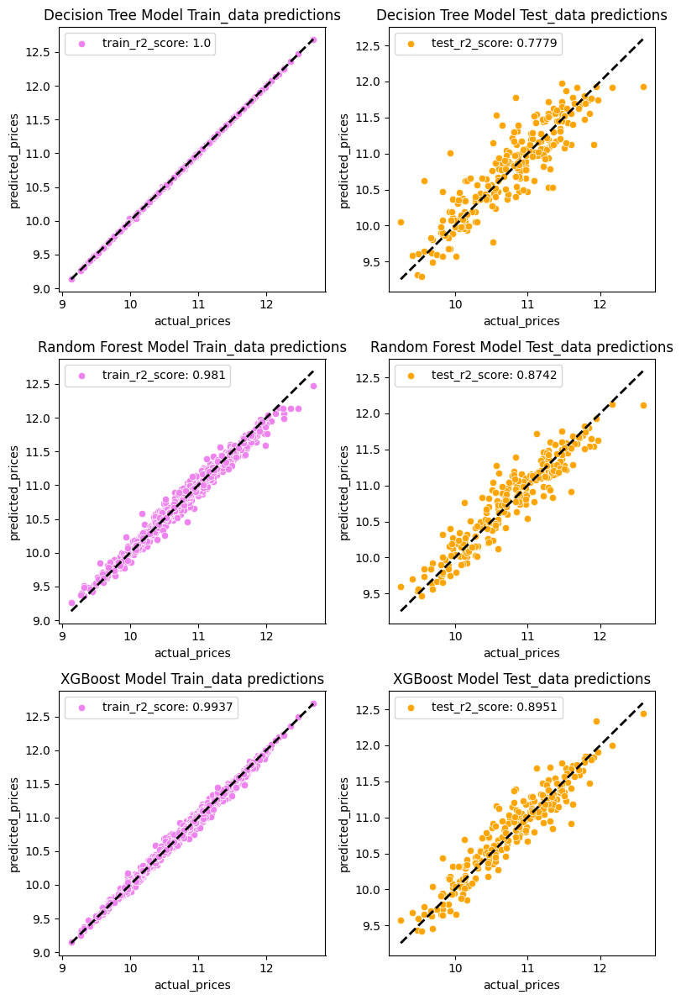

In [119]:
fig1 = plt.figure(figsize=(16,10))
plot_no =1 
for model,[y_inital_train_pred,y_initial_test_pred] in predictions.items():
    if model in ['Linear','Lasso','Ridge','SVR-Linear','SVR-NonLinear','KNN']:
        ax1 = fig1.add_subplot(3,4,plot_no)
        sns.scatterplot(x=y_initial_train,y=y_initial_train_pred,ax=ax1,color = 'violet',
                        label=f"train_r2_score: {results[f'{model}_train_results']['R2_SCORE']}")
        sns.lineplot(x=[y_initial_train.min(),y_initial_train.max()],y=[y_initial_train.min(),y_initial_train.max()],
                     color = 'black',ls='--',lw=2,ax = ax1,)
        ax1.set_xlabel('actual_prices')
        ax1.set_ylabel('predicted_prices')
        ax1.set_title(f'{model} Model Train_data predictions')
        ax2 = fig1.add_subplot(3,4,plot_no+1)
        sns.scatterplot(x=y_initial_test,y=y_initial_test_pred,ax=ax2,color = 'orange',
                        label=f"test_r2_score: {results[f'{model}_test_results']['R2_SCORE']}")
        sns.lineplot(x=[y_initial_test.min(),y_initial_test.max()],y=[y_initial_test.min(),y_initial_test.max()],
                     color = 'black',ls = '--',lw = 2,ax = ax2)
        ax2.set_xlabel('actual_prices')
        ax2.set_ylabel('predicted_prices')
        ax2.set_title(f'{model} Model Test_data predictions')
        plot_no+=2
plt.tight_layout()
plt.show()
fig2 = plt.figure(figsize=(8,12))
plot_no =1 
for model,[y_initial_train_pred,y_initial_test_pred] in predictions.items():
    if model in ['Decision Tree','Random Forest','XGBoost']:
        ax1 = fig2.add_subplot(3,2,plot_no)
        sns.scatterplot(x=y_initial_train,y=y_initial_train_pred,ax=ax1,color = 'violet',
                        label=f"train_r2_score: {results[f'{model}_train_results']['R2_SCORE']}")
        sns.lineplot(x=[y_initial_train.min(),y_initial_train.max()],y=[y_initial_train.min(),y_initial_train.max()],
                     color = 'black',ls='--',lw=2,ax = ax1,)
        ax1.set_xlabel('actual_prices')
        ax1.set_ylabel('predicted_prices')
        ax1.set_title(f'{model} Model Train_data predictions')
        ax2 = fig2.add_subplot(3,2,plot_no+1)
        sns.scatterplot(x=y_initial_test,y=y_initial_test_pred,ax=ax2,color = 'orange',
                        label=f"test_r2_score: {results[f'{model}_test_results']['R2_SCORE']}")
        sns.lineplot(x=[y_initial_test.min(),y_initial_test.max()],y=[y_initial_test.min(),y_initial_test.max()],
                     color = 'black',ls = '--',lw = 2,ax = ax2)
        ax2.set_xlabel('actual_prices')
        ax2.set_ylabel('predicted_prices')
        ax2.set_title(f'{model} Model Test_data predictions')
        plot_no+=2
plt.tight_layout()
plt.show()

* Randomforest and XGBoost are performing well so we will further use cv_score to check overall performance

In [120]:
rfr = RandomForestRegressor(n_estimators=100, random_state=42)
rfr_scores = cross_validate(rfr, X_initial, y_initial, cv=5, scoring=['r2', 'neg_root_mean_squared_error'], return_train_score=True)
rfr_scores_exp = cross_validate(rfr, X_initial, y_initial_exp, cv=5, scoring=['r2', 'neg_root_mean_squared_error'], return_train_score=True)

xgb = XGBRegressor(n_estimators = 100,random_state = 42)
xgb_scores = cross_validate(xgb, X_initial, y_initial, cv=5, scoring=['r2', 'neg_root_mean_squared_error'], return_train_score=True)
xgb_scores_exp = cross_validate(xgb, X_initial, y_initial_exp, cv=5, scoring=['r2', 'neg_root_mean_squared_error'], return_train_score=True)

print('rfr_scores: ')
for i in rfr_scores:
    if ('r2' in i) or ('neg' in i):
        print(f'{i}: {rfr_scores[i]}, Mean :{rfr_scores[i].mean()}\n')

print('rfr_scores_exp: ')
for i in rfr_scores:
    if ('r2' in i) or ('neg' in i):
        print(f'{i}: {rfr_scores_exp[i]}, Mean :{rfr_scores_exp[i].mean()}\n')

print('xgb_scores: ')            
for i in xgb_scores:
    if ('r2' in i) or ('neg' in i):
        print(f'{i}: {xgb_scores[i]}, Mean : {xgb_scores[i].mean()}\n')

print('xgb_scores_exp: ')            
for i in xgb_scores:
    if ('r2' in i) or ('neg' in i):
        print(f'{i}: {xgb_scores_exp[i]}, Mean : {xgb_scores_exp[i].mean()}\n')


rfr_scores: 
test_r2: [0.85761807 0.89016725 0.88236972 0.83091019 0.85631617], Mean :0.8634762816415517

train_r2: [0.98312789 0.98317637 0.98233815 0.98346918 0.98356948], Mean :0.9831362139732253

test_neg_root_mean_squared_error: [-0.2176792  -0.20563666 -0.22950976 -0.23577761 -0.24208947], Mean :-0.2261385417216621

train_neg_root_mean_squared_error: [-0.08169137 -0.08064109 -0.08093508 -0.08091633 -0.07909368], Mean :-0.08065550717952394

rfr_scores_exp: 
test_r2: [0.83925184 0.82844746 0.83504484 0.76869784 0.7640892 ], Mean :0.8071062361019973

train_r2: [0.97529789 0.97745051 0.97396733 0.97729009 0.97885781], Mean :0.976572726331832

test_neg_root_mean_squared_error: [-14248.21303461 -14296.06856635 -17212.10686874 -17609.33832514
 -18119.87367214], Mean :-16297.120093396235

train_neg_root_mean_squared_error: [-5956.64221222 -5758.277264   -5860.30296667 -5685.98349477
 -5479.0418433 ], Mean :-5748.049556191088

xgb_scores: 
test_r2: [0.87880516 0.88173767 0.90260667 0.8338

### 7. MODEL EVALUATION

In [121]:
xgb.fit(X_initial_train,y_initial_train)
y_initial_train_pred = xgb.predict(X_initial_train)
y_initial_test_pred = xgb.predict(X_initial_test)
xgb_train_score = metrics(y_initial_train_pred,y_initial_train)
xgb_test_score = metrics(y_initial_test_pred,y_initial_test)
print('Train Metrics:')
for k,v in xgb_train_score.items(): 
    print(f'{k} : {v}')

print('\nTest Metrics:')
for k,v in xgb_test_score.items():
    print(f'{k} : {v}')

Train Metrics:
MAE : 0.03
MSE : 0.0
RMSE : 0.05
R2_SCORE : 0.9937

Test Metrics:
MAE : 0.15
MSE : 0.04
RMSE : 0.2
R2_SCORE : 0.8951


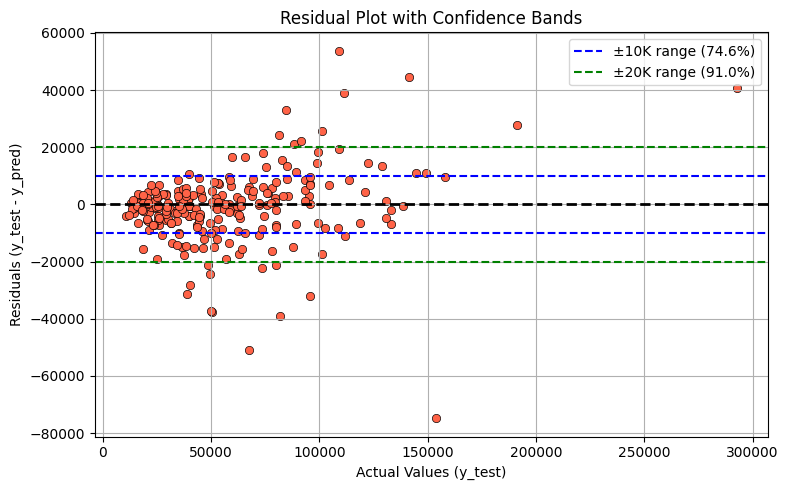

In [122]:
# calculating residuals
residuals = np.exp(y_initial_test) - np.exp(y_initial_test_pred)

# Computing percentages to plot
total_points = len(residuals)
within_10k = np.sum((residuals >= -10000) & (residuals <= 10000)) / total_points * 100
within_20k = np.sum((residuals >= -20000) & (residuals <= 20000)) / total_points * 100


# Plot
plt.figure(figsize=(8, 5))
sns.scatterplot(x=np.exp(y_initial_test), y=residuals, color='tomato', edgecolor='black')
plt.axhline(0, linestyle='--', color='black', linewidth=2)
plt.axhline(-10000, linestyle='--', color='blue', linewidth=1.5, label=f'±10K range ({within_10k:.1f}%)')
plt.axhline(10000, linestyle='--', color='blue', linewidth=1.5)
plt.axhline(-20000, linestyle='--', color='green', linewidth=1.5, label=f'±20K range ({within_20k:.1f}%)')
plt.axhline(20000, linestyle='--', color='green', linewidth=1.5)

plt.title("Residual Plot with Confidence Bands")
plt.xlabel("Actual Values (y_test)")
plt.ylabel("Residuals (y_test - y_pred)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


* For the model to be not biased towards tree based model one hot encoding is carried out for nominal features 
* For the ordinal categorical featues ordinal encoding is performed 
* The best performing model is XGBoost. Now we perform feature selection and feature importance analysis

Initial XGBOOSTModel Assessment
* Residual analysis indicates that the model performs poorly on high-end laptops, with larger errors observed in this segment.

* This suggests the model struggles to generalize for premium-range laptops. The likely contributing factors are:

    * Underrepresentation of high-end laptops in the dataset, leading to model bias toward mid- and low-range devices.

    * Imbalanced data split, where high-end laptops were not evenly distributed across training and test sets.

* To address this, we will implement stratified sampling based on the target variable to ensure proportional representation of all price ranges during the train-test split.

### 8. Overall Conclusion: Modeling Strategy and Initial Evaluation

The following conclusions were drawn from the initial modeling experiments and evaluation:

- For **baseline modeling**, all categorical features were initially encoded using **OrdinalEncoder** to quickly assess model performance.
- **Random Forest** and **XGBoost** outperformed other models, prompting deeper evaluation using **cross-validation scores** to ensure consistency across folds.

##### Encoding Strategy
- To reduce bias toward tree-based models and maintain generalizability:
  - **Nominal categorical features** were **one-hot encoded**.
  - **Ordinal features** retained **ordinal encoding** to preserve inherent order and avoid unnecessary dimensionality.

##### Initial XGBoost Evaluation
- **XGBoost** emerged as the **best-performing model**, warranting deeper analysis through feature selection and importance evaluation.
- **Residual analysis** revealed that:
  - The model **underperforms on high-end laptops**, with **larger prediction errors** in this segment.
  - This is attributed to **class imbalance** — high-end laptops are underrepresented in the dataset.
  - Potential **imbalanced data split** may have resulted in poor generalization across premium-range samples.

##### Next Steps
- To mitigate these issues and improve fairness:
  - **Stratified sampling** based on binned `price_log` values will be implemented for **train-test splitting**, ensuring proportional representation across all price segments.
- These refinements aim to create a more balanced, fair, and generalizable model for laptop price prediction.


## VII. COMPREHENSIVE FEATURE SELECTION AND IMPORTANCE ANALYSIS FOR MODEL OPTIMIZATION

### 1. DATA ENCODING

#### A) NOMINAL/ORDINAL ENCODING

In [123]:
#Ordinal Encoding for object datatype
cols1 = df.select_dtypes(include='object').columns
cols1 = [col for col in cols1 if col not in ['cpu','gpu','cpu_common','gpu_common']]
cols2 = df.select_dtypes(include = 'category').columns
cols = list(cols1) + list(cols2)
screen_order = ['Ultraportable','Thin & Light','Mainstream','Desktop Replacement'][::-1]
weight_order = ['Heavy','Medium','Lightweight','Ultra-Light']
order = [df[col].unique() for col in cols1]

# fs tag implies feature selection
order = order +[screen_order,weight_order]
ordinal_encoding_fs = OrdinalEncoder(categories = order)
oe_encoding_fs_array = ordinal_encoding_fs.fit_transform(df[cols])
ordinal_encoding_fs_df = pd.DataFrame(data = oe_encoding_fs_array,columns = cols)
ordinal_encoding_fs_df.head()

,company,typename,opsys,screen_tech,screen_category,weight_category
0,0.0,0.0,0.0,0.0,2.0,3.0
1,0.0,0.0,0.0,1.0,2.0,3.0
2,1.0,1.0,1.0,2.0,1.0,2.0
3,0.0,0.0,0.0,0.0,1.0,2.0
4,0.0,0.0,0.0,0.0,2.0,3.0


In [124]:
df_fs_encoded = pd.concat([ordinal_encoding_fs_df,df[['cpu','gpu']],df.select_dtypes(include='number')],axis=1)
df_fs_encoded = df_fs_encoded.drop(columns = ['price'])
df_fs_encoded.head()

,company,typename,opsys,screen_tech,screen_category,weight_category,cpu,gpu,inches,ram,weight,ssd,hdd,flashstorage,hybrid,dual_memory,is_touchscreen,ppi,clock_speed,price_log
0,0.0,0.0,0.0,0.0,2.0,3.0,Intel Core i5 2.3GHz,Intel Iris Plus Graphics 640,13.3,8.0,1.37,128,0,0,0,0,0,226.98,2.3,11.175755
1,0.0,0.0,0.0,1.0,2.0,3.0,Intel Core i5 1.8GHz,Intel HD Graphics 6000,13.3,8.0,1.34,0,0,128,0,0,0,127.68,1.8,10.776777
2,1.0,1.0,1.0,2.0,1.0,2.0,Intel Core i5 7200U 2.5GHz,Intel HD Graphics 620,15.6,8.0,1.86,256,0,0,0,0,0,141.21,2.5,10.329931
3,0.0,0.0,0.0,0.0,1.0,2.0,Intel Core i7 2.7GHz,AMD Radeon Pro 455,15.4,16.0,1.83,512,0,0,0,0,0,220.53,2.7,11.814476
4,0.0,0.0,0.0,0.0,2.0,3.0,Intel Core i5 3.1GHz,Intel Iris Plus Graphics 650,13.3,8.0,1.37,256,0,0,0,0,0,226.98,3.1,11.473101


#### B) LEAKAGE-FREE TARGET MEAN ENCODING FOR `cpu` AND `gpu` FEATURES + SPLITING FEATURES (`x`) AND TARGET (`y`)

In [125]:
def kfold_cpu_gpu_encoding(kf,df_encoded):
    # Store mappings for final global use (if it is decided to use target mean encoding in the final model)
    cpu_mean_mappings = []
    gpu_mean_mappings = []
    global_means_cpu = []
    global_means_gpu = []
    X_encoded = df_encoded.drop(columns = ['price_log'])
    y_series = df_encoded['price_log']
    # Fold-wise encoding for leakage-free target mean 
    for train_idx, val_idx in kf.split(X_encoded):
        train_fold = X_encoded.iloc[train_idx].copy()
        val_fold = X_encoded.iloc[val_idx].copy()
        y_train_fold = y_series.iloc[train_idx]

        # CPU encoding
        cpu_mean_map = y_train_fold.groupby(train_fold['cpu']).mean().to_dict()
        global_mean_cpu = y_train_fold.mean()

        val_fold['cpu_mean'] = val_fold['cpu'].map(cpu_mean_map).fillna(global_mean_cpu)

        cpu_mean_mappings.append(cpu_mean_map)
        global_means_cpu.append(global_mean_cpu)

        # GPU encoding
        gpu_mean_map = y_train_fold.groupby(train_fold['gpu']).mean().to_dict()
        global_mean_gpu = y_train_fold.mean()

        val_fold['gpu_mean'] = val_fold['gpu'].map(gpu_mean_map).fillna(global_mean_gpu)

        gpu_mean_mappings.append(gpu_mean_map)
        global_means_gpu.append(global_mean_gpu)

        # Store in full encoded set
        X_encoded.loc[val_idx, 'cpu_mean'] = val_fold['cpu_mean']
        X_encoded.loc[val_idx, 'gpu_mean'] = val_fold['gpu_mean']

    # Final global encoding (averaged across folds) — for future use
    
            
    cpu_mean_final_map = {
        key: np.mean([fold_map.get(key, np.nan) for fold_map in cpu_mean_mappings if key in fold_map])
        for key in set(X_encoded['cpu'])
    }
    gpu_mean_final_map = {
        key: np.mean([fold_map.get(key, np.nan) for fold_map in gpu_mean_mappings if key in fold_map])
        for key in set(X_encoded['gpu'])
    }

    final_global_mean_cpu = np.mean(global_means_cpu)
    final_global_mean_gpu = np.mean(global_means_gpu)

    return {'cpu_mean_final_map':cpu_mean_final_map,'gpu_mean_final_map':gpu_mean_final_map,
            'final_global_mean_cpu':final_global_mean_cpu,
            'final_global_mean_gpu':final_global_mean_gpu,
            'X_encoded':X_encoded,'y_series':y_series}

In [126]:

kf = KFold(n_splits=5,shuffle=True,random_state=42)
map_dictionary = kfold_cpu_gpu_encoding(kf = kf, df_encoded = df_fs_encoded)
X_fs = map_dictionary['X_encoded']
y_fs = map_dictionary['y_series'] 

# other mapping for future encoding of cpu_mean and gpu_mean mappings 
# Not used anywhere in the code
cpu_mean_final_map = map_dictionary['cpu_mean_final_map']
gpu_mean_final_map = map_dictionary['gpu_mean_final_map']
final_global_mean_cpu = map_dictionary['final_global_mean_cpu']
final_global_mean_gpu= map_dictionary['final_global_mean_gpu']
pd.concat([X_fs,y_fs],axis=1).head()

,company,typename,opsys,screen_tech,screen_category,weight_category,cpu,gpu,inches,ram,...,hdd,flashstorage,hybrid,dual_memory,is_touchscreen,ppi,clock_speed,cpu_mean,gpu_mean,price_log
0,0.0,0.0,0.0,0.0,2.0,3.0,Intel Core i5 2.3GHz,Intel Iris Plus Graphics 640,13.3,8.0,...,0,0,0,0,0,226.98,2.3,11.301072,11.396478,11.175755
1,0.0,0.0,0.0,1.0,2.0,3.0,Intel Core i5 1.8GHz,Intel HD Graphics 6000,13.3,8.0,...,0,128,0,0,0,127.68,1.8,11.030615,10.932775,10.776777
2,1.0,1.0,1.0,2.0,1.0,2.0,Intel Core i5 7200U 2.5GHz,Intel HD Graphics 620,15.6,8.0,...,0,0,0,0,0,141.21,2.5,10.718522,10.900033,10.329931
3,0.0,0.0,0.0,0.0,1.0,2.0,Intel Core i7 2.7GHz,AMD Radeon Pro 455,15.4,16.0,...,0,0,0,0,0,220.53,2.7,10.831023,10.831023,11.814476
4,0.0,0.0,0.0,0.0,2.0,3.0,Intel Core i5 3.1GHz,Intel Iris Plus Graphics 650,13.3,8.0,...,0,0,0,0,0,226.98,3.1,11.596266,11.596266,11.473101


In [127]:
try:
    X_fs = X_fs.drop(columns = ['cpu','gpu'])
except:
    pass
X_fs.head()


,company,typename,opsys,screen_tech,screen_category,weight_category,inches,ram,weight,ssd,hdd,flashstorage,hybrid,dual_memory,is_touchscreen,ppi,clock_speed,cpu_mean,gpu_mean
0,0.0,0.0,0.0,0.0,2.0,3.0,13.3,8.0,1.37,128,0,0,0,0,0,226.98,2.3,11.301072,11.396478
1,0.0,0.0,0.0,1.0,2.0,3.0,13.3,8.0,1.34,0,0,128,0,0,0,127.68,1.8,11.030615,10.932775
2,1.0,1.0,1.0,2.0,1.0,2.0,15.6,8.0,1.86,256,0,0,0,0,0,141.21,2.5,10.718522,10.900033
3,0.0,0.0,0.0,0.0,1.0,2.0,15.4,16.0,1.83,512,0,0,0,0,0,220.53,2.7,10.831023,10.831023
4,0.0,0.0,0.0,0.0,2.0,3.0,13.3,8.0,1.37,256,0,0,0,0,0,226.98,3.1,11.596266,11.596266


In [128]:
X_fs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1219 entries, 0 to 1218
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   company          1219 non-null   float64
 1   typename         1219 non-null   float64
 2   opsys            1219 non-null   float64
 3   screen_tech      1219 non-null   float64
 4   screen_category  1219 non-null   float64
 5   weight_category  1219 non-null   float64
 6   inches           1219 non-null   float64
 7   ram              1219 non-null   float64
 8   weight           1219 non-null   float64
 9   ssd              1219 non-null   int64  
 10  hdd              1219 non-null   int64  
 11  flashstorage     1219 non-null   int64  
 12  hybrid           1219 non-null   int64  
 13  dual_memory      1219 non-null   int64  
 14  is_touchscreen   1219 non-null   int64  
 15  ppi              1219 non-null   float64
 16  clock_speed      1219 non-null   float64
 17  cpu_mean      

In [129]:
y_fs.head()

0    11.175755
1    10.776777
2    10.329931
3    11.814476
4    11.473101
Name: price_log, dtype: float64

* The cpu and gpu column is encoded with target-mean enconding technique. To avoid data leakage The KFOLD with 5 cross folds are used 
* The remaining features are encoded with ordinal encoding

### 2. WRAPPER METHOD TO FIND THE BEST FEATURES WITHIN THE LIMITED SELECTION

In [130]:
# Model setup
model_fs = XGBRegressor(n_estimators=100, random_state=42, max_depth=4)

model_fs_scores = []
for i in range(1, len(X_fs.columns) + 1):  # Range of feature selection
    print(i,end=' ')
    X_encoded = X_fs.copy()
    y_series = y_fs.copy()
    # Applying RFE
    rfe = RFE(estimator=model_fs, n_features_to_select=i)
    X_selected = rfe.fit_transform(X_encoded, y_series)
    selected_features = X_encoded.columns[rfe.support_]

    # Cross-validation score on selected columns
    scores = cross_validate(model_fs, X_selected, y_series, cv=kf, scoring='r2', return_train_score=True)
    train_score, test_score = np.round([scores['train_score'], scores['test_score']], 3)
    train_score_mean, test_score_mean = np.round([train_score.mean(), test_score.mean()], 2)

    # Save result
    model_fs_scores.append([i, selected_features, train_score, test_score, train_score_mean, test_score_mean])
    



1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 

In [131]:
fs_scores_df = pd.DataFrame(model_fs_scores,columns = ['no_of_features','features','train_score','test_score','train_mean_score','test_mean_score',])
fs_scores_df

,no_of_features,features,train_score,test_score,train_mean_score,test_mean_score
0,1,"Index(['ram'], dtype='object')","[0.599, 0.622, 0.612, 0.617, 0.617]","[0.656, 0.542, 0.603, 0.591, 0.587]",0.61,0.60
1,2,"Index(['ram', 'ssd'], dtype='object')","[0.696, 0.703, 0.702, 0.704, 0.705]","[0.706, 0.666, 0.673, 0.671, 0.678]",0.70,0.68
2,3,"Index(['ram', 'ssd', 'gpu_mean'], dtype='object')","[0.871, 0.871, 0.87, 0.872, 0.871]","[0.733, 0.786, 0.748, 0.737, 0.784]",0.87,0.76
3,4,"Index(['ram', 'ssd', 'cpu_mean', 'gpu_mean'], ...","[0.912, 0.917, 0.919, 0.918, 0.919]","[0.821, 0.825, 0.714, 0.79, 0.804]",0.92,0.79
4,5,"Index(['ram', 'ssd', 'ppi', 'cpu_mean', 'gpu_m...","[0.95, 0.954, 0.953, 0.951, 0.95]","[0.851, 0.866, 0.81, 0.841, 0.848]",0.95,0.84
5,6,"Index(['screen_category', 'ram', 'ssd', 'ppi',...","[0.952, 0.953, 0.956, 0.951, 0.951]","[0.867, 0.874, 0.828, 0.852, 0.853]",0.95,0.85
6,7,"Index(['opsys', 'screen_category', 'ram', 'ssd...","[0.958, 0.959, 0.963, 0.958, 0.958]","[0.878, 0.888, 0.835, 0.873, 0.875]",0.96,0.87
7,8,"Index(['opsys', 'screen_category', 'ram', 'wei...","[0.976, 0.976, 0.975, 0.975, 0.974]","[0.886, 0.884, 0.855, 0.878, 0.892]",0.98,0.88
8,9,"Index(['opsys', 'screen_category', 'inches', '...","[0.977, 0.976, 0.978, 0.975, 0.974]","[0.895, 0.882, 0.857, 0.88, 0.903]",0.98,0.88
9,10,"Index(['opsys', 'screen_category', 'inches', '...","[0.978, 0.976, 0.977, 0.974, 0.974]","[0.884, 0.886, 0.858, 0.888, 0.897]",0.98,0.88


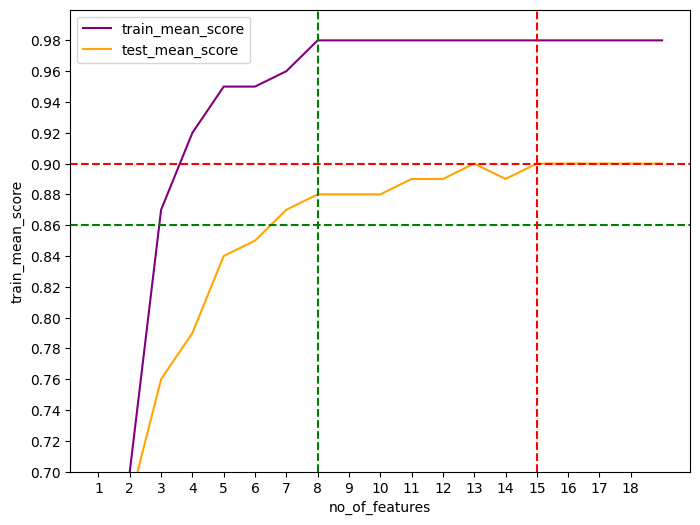

In [132]:
plt.figure(figsize=(8,6))
ax = sns.lineplot(data = fs_scores_df,x = 'no_of_features',y='train_mean_score',color = 'purple',label = 'train_mean_score')
sns.lineplot(data = fs_scores_df,x = 'no_of_features',y='test_mean_score',color = 'orange',label = 'test_mean_score')
plt.axhline(y=0.86,ls='--',color = 'green')
plt.axhline(y=0.9,ls='--',color = 'red')
plt.axvline(x=8,ls = '--',color = 'green')
plt.axvline(x=15,ls = '--',color = 'red')
plt.xticks(list(range(1,19)))
plt.ylim(0.7,1)
ax.set_yticks([x/100 for x in list(range(70,100,2))])
plt.show()

* We can see there is no major changes after 10 features(i.e. test accuracy is 0.86~0.88) so keeping performance and complexity in mind we will select atmost 16 features


In [133]:
# Extracting 11 features
for i in range(0,15):
    print(fs_scores_df.iloc[i]['features'].to_list())

['ram']
['ram', 'ssd']
['ram', 'ssd', 'gpu_mean']
['ram', 'ssd', 'cpu_mean', 'gpu_mean']
['ram', 'ssd', 'ppi', 'cpu_mean', 'gpu_mean']
['screen_category', 'ram', 'ssd', 'ppi', 'cpu_mean', 'gpu_mean']
['opsys', 'screen_category', 'ram', 'ssd', 'ppi', 'cpu_mean', 'gpu_mean']
['opsys', 'screen_category', 'ram', 'weight', 'ssd', 'ppi', 'cpu_mean', 'gpu_mean']
['opsys', 'screen_category', 'inches', 'ram', 'weight', 'ssd', 'ppi', 'cpu_mean', 'gpu_mean']
['opsys', 'screen_category', 'inches', 'ram', 'weight', 'ssd', 'dual_memory', 'ppi', 'cpu_mean', 'gpu_mean']
['opsys', 'screen_category', 'inches', 'ram', 'weight', 'ssd', 'dual_memory', 'ppi', 'clock_speed', 'cpu_mean', 'gpu_mean']
['typename', 'opsys', 'screen_category', 'inches', 'ram', 'weight', 'ssd', 'dual_memory', 'ppi', 'clock_speed', 'cpu_mean', 'gpu_mean']
['company', 'typename', 'opsys', 'screen_category', 'inches', 'ram', 'weight', 'ssd', 'dual_memory', 'ppi', 'clock_speed', 'cpu_mean', 'gpu_mean']
['company', 'typename', 'opsys',

In [134]:
rfe_selected_features = fs_scores_df.iloc[14]['features'].to_list()
print(rfe_selected_features)

['company', 'typename', 'opsys', 'screen_category', 'inches', 'ram', 'weight', 'ssd', 'flashstorage', 'dual_memory', 'is_touchscreen', 'ppi', 'clock_speed', 'cpu_mean', 'gpu_mean']


### 3. FEATURE IMPORTANCE ANALYSIS

#### A) SINGLE FEATURE PREDICTION SCORE

In [135]:
def single_feature_score(column,X_var,y_var):
    X_one = X_var[[column]]
    model = XGBRegressor(n_estimators = 100,random_state =42,max_depth = 4)
    model.fit(X_one,y_var)
    scores = cross_validate(model, X_one, y_var, cv=kf, scoring='r2', return_train_score=True)
    train_score, test_score = np.round([scores['train_score'], scores['test_score']], 3)
    train_score_mean, test_score_mean = np.round([train_score.mean(), test_score.mean()], 2)
    return [column,train_score_mean,test_score_mean]

In [136]:
single_feature_results =[]
for i in X_fs.columns:
    result = single_feature_score(i,X_fs,y_fs)
    single_feature_results.append(result)

In [137]:
individual_feature_performance_df = pd.DataFrame(single_feature_results,columns = ['feature_name','train_mean_score','test_mean_score'])
individual_feature_performance_df = individual_feature_performance_df.sort_values(by=['test_mean_score','train_mean_score'],ascending=False)
individual_feature_performance_df

,feature_name,train_mean_score,test_mean_score
17,cpu_mean,0.70,0.60
7,ram,0.61,0.60
16,clock_speed,0.53,0.50
18,gpu_mean,0.62,0.49
9,ssd,0.50,0.48
15,ppi,0.53,0.47
1,typename,0.41,0.40
8,weight,0.51,0.33
6,inches,0.22,0.20
3,screen_tech,0.20,0.19


* AS XGBOOST is a tree based model the effeciency will not be captured for features with less categories for example dual_memory and is_touchscreen as they have only 2 categories.
* so this method might not be the best but gives a general idea how the continuous columns perform wrt price variable

#### B) INDIVIDUAL FEATURE IMPORTANCE ON XGBOOST MODEL

In [138]:
# We will use all 18 features and select 15 features 
# all 18 features will be from above X_encoded and 
model_fs = XGBRegressor(n_estimators = 100,random_state = 42,max_depth = 4)
model_fi_score = cross_val_score(model_fs,X_fs,y_fs,cv=5)
print(model_fi_score)
print(model_fi_score.mean())

[0.87571634 0.90912006 0.90399137 0.84637084 0.87217152]
0.8814740271220891


In [139]:
#XGB feature_importance selection
model_fs.fit(X_fs,y_fs)
model_feature_importance_score = pd.Series(model_fs.feature_importances_, index=X_fs.columns).sort_values(ascending=False)
print(model_feature_importance_score)

ram                0.487855
ssd                0.109235
cpu_mean           0.083928
screen_category    0.073107
ppi                0.072256
gpu_mean           0.053286
opsys              0.019897
typename           0.019321
weight             0.015931
inches             0.012435
clock_speed        0.010617
flashstorage       0.008780
is_touchscreen     0.008592
dual_memory        0.008319
company            0.005550
hdd                0.004862
screen_tech        0.003155
weight_category    0.002405
hybrid             0.000468
dtype: float32


* `ram` column has high feature_importance for XGBRegressor Model.Followed by `ssd,cpu_mean,ppi` etc.
* This implies memory storage and processors(cpu,gpu) are key factors influencing the target variable (price).

In [140]:
fi_selected_features = model_feature_importance_score.index[:15].to_list()
print(fi_selected_features)

['ram', 'ssd', 'cpu_mean', 'screen_category', 'ppi', 'gpu_mean', 'opsys', 'typename', 'weight', 'inches', 'clock_speed', 'flashstorage', 'is_touchscreen', 'dual_memory', 'company']


#### C) PERMUTATION IMPORTANCE OF FEATURE

In [141]:
print('Model_name:',type(model))
perm_importance = permutation_importance(model_fs, X_fs, y_fs, scoring='r2', random_state=42)
perm_importance_df = pd.DataFrame({'Feature': X_fs.columns, 'R2_decrease': perm_importance.importances_mean})
perm_importance_df = perm_importance_df.sort_values(by='R2_decrease', ascending=False)
print(perm_importance_df)

Model_name: <class 'str'>
            Feature  R2_decrease
17         cpu_mean     0.141932
18         gpu_mean     0.140577
7               ram     0.127684
9               ssd     0.081187
15              ppi     0.064811
8            weight     0.062409
2             opsys     0.027480
16      clock_speed     0.023077
0           company     0.022367
6            inches     0.014765
4   screen_category     0.013702
1          typename     0.009862
10              hdd     0.005984
14   is_touchscreen     0.004570
11     flashstorage     0.004496
3       screen_tech     0.004096
13      dual_memory     0.003106
5   weight_category     0.000969
12           hybrid     0.000077


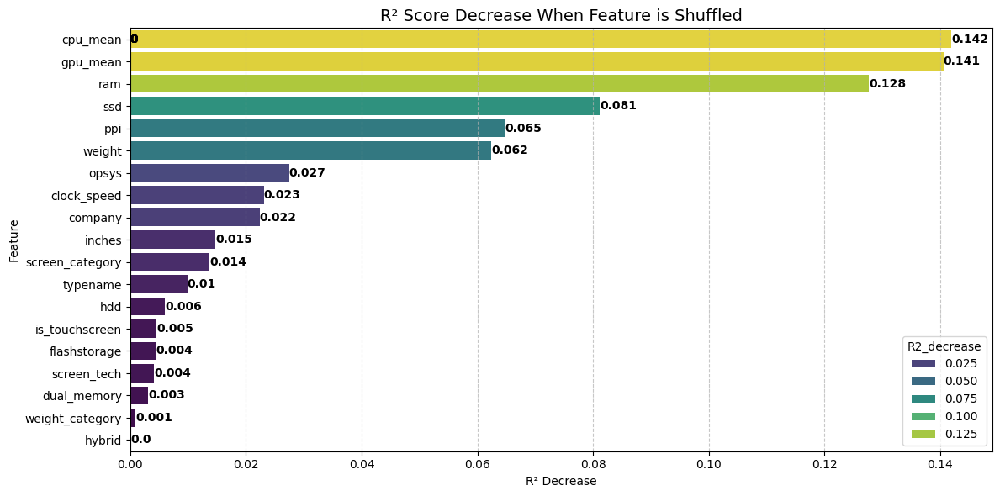

In [142]:
# Plot
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='R2_decrease', y='Feature', data=perm_importance_df,hue='R2_decrease', palette='viridis')
for p in ax.patches:
    ax.annotate(f'{round(p.get_width(),3)}',
                (p.get_width(),p.get_y()+p.get_height()/2),
                ha = 'left',va='center',fontsize=10,fontweight = 'bold',color='black')
plt.title('R² Score Decrease When Feature is Shuffled', fontsize=14)
plt.xlabel('R² Decrease')
plt.ylabel('Feature')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

**Conclusions drawn from permutation importance**

1) The top features by importance (based on $R^{2}$ drop when shuffled):
    * `cpu_mean` (0.142)
    * `cpu_mean` (0.141)
    * `ram` (0.128)
    * `ssd` (0.081)
These four are key drivers of model performance, indicating that hardware components strongly influence the price variable (target variable).

2) Features with minimal $R^{2}$ impact (<0.01) suggests:
* The contribute little predictive power or Their effect is captured by other correlated features (i.e. redundancy)
* ex: weight_category,dual_memory, hybrid etc
3) `screen_category` has lower importance (0.014) than its source `inches` (0.015) which may indicate that discretization added less value than the raw continous variables 
4) similarly `weight_category` has near-zero importance so we can drop both screen_category and weight_category
5) The fact that no single feature completely tanks performance when shuffled(i.e drop in $R^{2}$ not greater than 0.2) suggest:
    * Model is robust with information spread across multiple features.
    * Model is less prove to overfitting on a single dominant feature


In [143]:
pi_selected_features = perm_importance_df['Feature'][:15].to_list()
print(pi_selected_features)

['cpu_mean', 'gpu_mean', 'ram', 'ssd', 'ppi', 'weight', 'opsys', 'clock_speed', 'company', 'inches', 'screen_category', 'typename', 'hdd', 'is_touchscreen', 'flashstorage']


#### D) SHAPELY ADDITIVE EXPLANATIONS (SHAP ) ANALYSIS

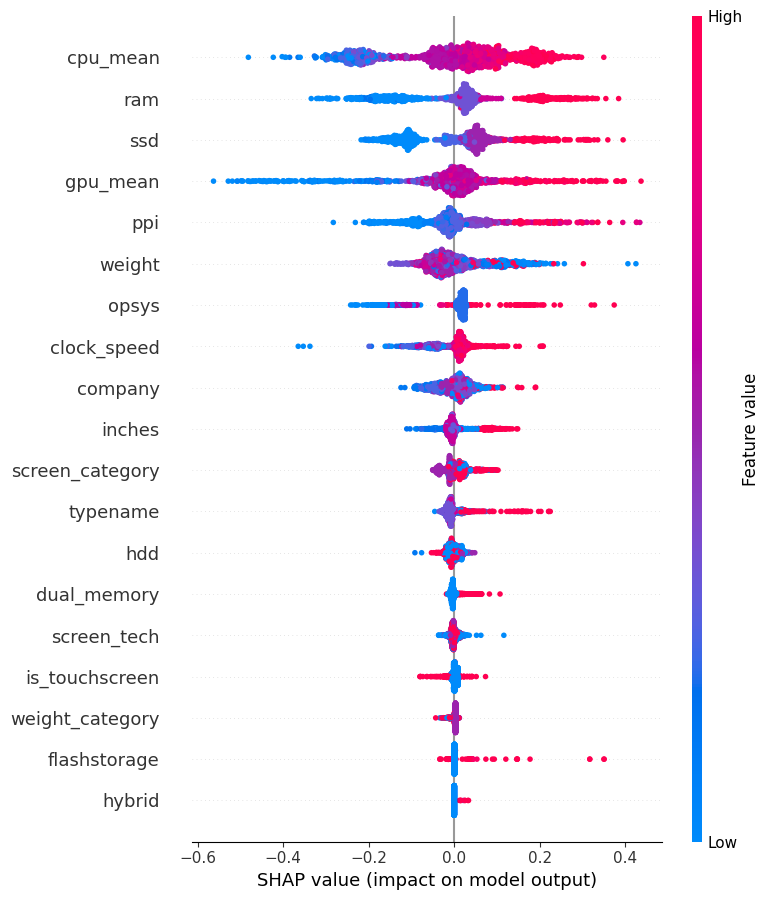

In [144]:

explainer = shap.Explainer(model_fs, X_fs)
shap_values = explainer(X_fs)

# Plot summary of feature importance
shap.summary_plot(shap_values, X_fs)

* `ram,cpu_mean,ssd,gpu_mean` are top performing features from shap analysis


In [145]:
# Compute mean absolute SHAP values for each feature
shap_importance = np.abs(shap_values.values).mean(axis=0)
# Create a DataFrame for better visualization
shap_importance_df = pd.DataFrame({'feature': X_fs.columns, 'importance': shap_importance})
# Sort features by importance (descending order)
shap_importance_df = shap_importance_df.sort_values(by='importance', ascending=False)
# Get the list of features in order of SHAP importance
shap_selected_features = shap_importance_df['feature'][:15].tolist()
print(shap_selected_features)

['cpu_mean', 'ram', 'ssd', 'gpu_mean', 'ppi', 'weight', 'opsys', 'clock_speed', 'company', 'inches', 'screen_category', 'typename', 'hdd', 'dual_memory', 'screen_tech']


### 4. TOP FEATURES SELECTION FROM ABOVE ANALYSIS

In [146]:
all_4_common_features = set(rfe_selected_features).intersection(fi_selected_features,pi_selected_features,shap_selected_features)
print([col for col in shap_selected_features if col in all_4_common_features]+
      [col for col in all_4_common_features if col not in shap_selected_features])

['cpu_mean', 'ram', 'ssd', 'gpu_mean', 'ppi', 'weight', 'opsys', 'clock_speed', 'company', 'inches', 'screen_category', 'typename']


In [147]:
perm_shap_common_features = set(pi_selected_features).intersection(shap_selected_features)
print(perm_shap_common_features-all_4_common_features)

{'hdd'}


In [148]:
fi_perm_common_features = set(pi_selected_features).intersection(fi_selected_features)
print(fi_perm_common_features-all_4_common_features)

{'is_touchscreen', 'flashstorage'}


In [149]:
fi_shap_common_features = set(fi_selected_features).intersection(shap_selected_features)
print(fi_shap_common_features-all_4_common_features)

{'dual_memory'}


In [150]:
top_features = ['company','typename','opsys','cpu_mean','gpu_mean'
                'ram', 'ssd','hdd','flashstorage','hybrid','dual_memory',
                'inches','ppi','is_touchscreen','weight','clock_speed']

* As `ssd` is involved we also need to include other storage types like `hdd,hybrid,flashstorage & dual memory`.
* as screen_category and inches are same columns we should eliminate one 
* from permutation importance and shap analysis it is clear that inches column has high effect on accuracy and screen_category is derived from inches so we are dropping `screen_category` column

### 5. Overall Conclusion: Feature Selection


To optimize model performance and minimize overfitting, the following strategies were applied:

##### Encoding Strategy
- The **`cpu`** and **`gpu`** features were encoded using **target mean encoding**, which captures the relationship between category and target price.
  - To **prevent data leakage**, **K-Fold target encoding** was employed with **5 cross-validation folds**, ensuring each fold was encoded without access to its own target values.
- All **remaining categorical features** were encoded using **Ordinal Encoding**, maintaining simplicity while preserving categorical structure.

##### Feature Selection
- **Tree-based models** like XGBoost can underrepresent **binary categorical features** (e.g., `dual_memory`, `is_touchscreen`) due to their limited split options.
- **Top influential features** from permutation importance and SHAP analysis include:
  - `ram`, `cpu_mean`, `ssd`, and `gpu_mean`
  - These indicate that **memory and processor specs** are the primary drivers of price.
- Features such as `weight_category`, `dual_memory`, and `hybrid` had **minimal impact (<0.01 $R^{2}$ drop)**, suggesting redundancy or weak signal.
- **Discretized columns** like `screen_category` and `weight_category` showed **lower importance** compared to their continuous counterparts:
  - `screen_category` had lower impact than `inches` (0.014 vs. 0.015)
  - `weight_category` had near-zero importance
  - Hence, **`screen_category` and `weight_category` were dropped**
- No single feature had an outsized impact (no $R^{2}$ drop > 0.2 when shuffled), indicating:
  - The model is **robust**, relying on a **diverse set of features**.
  - It is **less prone to overfitting** on any one dominant variable.
- Based on test accuracy (~0.86–0.88) and complexity trade-offs, the **top 16 features** were selected for the final model.

These steps ensured efficient feature representation and robust model behavior while focusing on hardware specifications that directly influence laptop pricing.


## IX. MODEL IMPLEMENTATION & HYPERPARAMETER TUNING

In [151]:
df.columns

Index(['company', 'typename', 'inches', 'cpu', 'ram', 'gpu', 'opsys', 'weight',
       'price', 'ssd', 'hdd', 'flashstorage', 'hybrid', 'dual_memory',
       'screen_tech', 'is_touchscreen', 'ppi', 'clock_speed', 'price_log',
       'screen_category', 'weight_category', 'cpu_common', 'gpu_common'],
      dtype='object')

In [152]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1219 entries, 0 to 1218
Data columns (total 23 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   company          1219 non-null   object  
 1   typename         1219 non-null   object  
 2   inches           1219 non-null   float64 
 3   cpu              1219 non-null   object  
 4   ram              1219 non-null   float64 
 5   gpu              1219 non-null   object  
 6   opsys            1219 non-null   object  
 7   weight           1219 non-null   float64 
 8   price            1219 non-null   float64 
 9   ssd              1219 non-null   int64   
 10  hdd              1219 non-null   int64   
 11  flashstorage     1219 non-null   int64   
 12  hybrid           1219 non-null   int64   
 13  dual_memory      1219 non-null   int64   
 14  screen_tech      1219 non-null   object  
 15  is_touchscreen   1219 non-null   int64   
 16  ppi              1219 non-null   float64 


In [153]:
ordinal_encoding_main = OrdinalEncoder()
ordinal_encoding_main_array = ordinal_encoding_main.fit_transform(df[['company','typename','opsys','cpu_common','gpu_common']])
ordinal_encoding_main_df = pd.DataFrame(ordinal_encoding_main_array,columns = ['company','typename','opsys','cpu_common','gpu_common'])
ordinal_encoding_main_df = ordinal_encoding_main_df.astype('category')
ordinal_encoding_main_df.head()

,company,typename,opsys,cpu_common,gpu_common
0,1.0,4.0,8.0,22.0,24.0
1,1.0,4.0,8.0,22.0,24.0
2,7.0,3.0,4.0,8.0,12.0
3,1.0,4.0,8.0,22.0,24.0
4,1.0,4.0,8.0,22.0,24.0


In [154]:
final_numerical_columns = ['ram','ssd','hdd','flashstorage','hybrid','dual_memory',
                           'inches','ppi','is_touchscreen','weight','clock_speed','price_log','price']
df_main_encoded = pd.concat([ordinal_encoding_main_df,df[final_numerical_columns]],axis = 1)
df_main_encoded.head()

,company,typename,opsys,cpu_common,gpu_common,ram,ssd,hdd,flashstorage,hybrid,dual_memory,inches,ppi,is_touchscreen,weight,clock_speed,price_log,price
0,1.0,4.0,8.0,22.0,24.0,8.0,128,0,0,0,0,13.3,226.98,0,1.37,2.3,11.175755,71378.6832
1,1.0,4.0,8.0,22.0,24.0,8.0,0,0,128,0,0,13.3,127.68,0,1.34,1.8,10.776777,47895.5232
2,7.0,3.0,4.0,8.0,12.0,8.0,256,0,0,0,0,15.6,141.21,0,1.86,2.5,10.329931,30636.0000
3,1.0,4.0,8.0,22.0,24.0,16.0,512,0,0,0,0,15.4,220.53,0,1.83,2.7,11.814476,135195.3360
4,1.0,4.0,8.0,22.0,24.0,8.0,256,0,0,0,0,13.3,226.98,0,1.37,3.1,11.473101,96095.8080


In [155]:
# dropping target_variable
X = df_main_encoded.drop(columns = ['price_log','price'])

# clear distinction of price_log and price column is necessary
# because converting log to exp just before calculations will become tedious
y_log = df_main_encoded['price_log']
y_exp = df_main_encoded['price']

* As our confirmed model is tree based model, Ordinal encoding is used for nominal data, after encoding the data type of nominal feature is set to `category` and  instead in the model defining we made sure to turn on enable_categorical = True feature so that the model don't treat the nominal feature as numerical columns with order.

### 1. HYPERPARAMETER TUNING

In [156]:
run_flag = False #running the hyperparameter tuning only once saving it from running again and again 
# run_flag = True   #--uncomment/comment this line to run/not-run the cell block


######### For consistent results the cv should be same
if run_flag:
    cv_splitter = KFold(n_splits=5, shuffle=True, random_state=42)

    def run_grid_search(X, y, param_grid, base_params=None, cv=cv_splitter, verbose=1, scoring='neg_root_mean_squared_error'):
        base_params = base_params or {}
        model = XGBRegressor(enable_categorical='True',random_state=42, **base_params)
        grid = GridSearchCV(
            estimator=model,
            param_grid=param_grid,
            scoring=scoring,
            cv=cv,
            verbose=verbose,
            n_jobs=-1
        )
        grid.fit(X, y)
        print("Best Params:", grid.best_params_)
        return grid.best_params_

    ######## Stage 1
    param_grid_stage1 = {
        'max_depth': [3, 4, 5, 6 ],
        'n_estimators': [100, 200, 300, 400, 500],
        'learning_rate': [0.03, 0.05, 0.07, 0.09]
    }
    # best_params_stage1 = run_grid_search(X, y_log, param_grid_stage1)
    best_params_stage1 = {'max_depth':5,'n_estimators':500,'learning_rate':0.04}
    ######## Stage 2
    param_grid_stage2 = {

        'colsample_bytree': [0.4, 0.5, 0.6, 0.7, 0.8],
        'subsample': [0.2, 0.4, 0.6, 0.8, 1.0]
    }
    # best_params_stage2 = run_grid_search(X, y_log, param_grid_stage2, base_params=best_params_stage1)
    best_params_stage2 = {'colsample_bytree':0.5,'subsample':0.6}


    ######## Stage 3
    param_grid_stage3 = {
        'gamma': [0, 0.1, 0.3],
        'reg_alpha': [0, 0.1, 0.3, 0.4, ],
        'reg_lambda': [0, 0.3, 0.6, 0.9, 1.3, 1.6, 1.9, 2]
    }
    best_params_stage3 = run_grid_search(X, y_log, param_grid_stage3, base_params={**best_params_stage1, **best_params_stage2})

    ####### Combine all best parameters
    final_best_params = {**best_params_stage1, **best_params_stage2, **best_params_stage3}
    print("\n✅ Final Best Hyperparameters for XGBRegressor:")
    for k, v in final_best_params.items():
        print(f"{k}: {v}")
    

In [157]:

final_best_params = {
    'max_depth': 6,
    'n_estimators': 200,
    'learning_rate': 0.07,
    'colsample_bytree': 0.5,
    'subsample': 0.8,
    'gamma': 0,
    'reg_alpha': 0,
    'reg_lambda':1}

* The optimum parameters found using hyper parameter training are as follows: 
    *  `max_depth = 6`
    * `n_estimators = 200`
    * `learning_rate = 0.07`
    * `colsample_bytree = 0.5`
    * `subsample = 0.8 `
    * `gamma = 0`
    * `reg_alpha = 0`
    * `reg_lambda = 1`

### 2. MODEL TRAINING & EVALUATIONS

In [158]:
main_model = XGBRegressor(enable_categorical=True,random_state = 42,objective='reg:squarederror',**final_best_params)

In [159]:
def stratified_cross_validate_regression(X, y_log,y_exp, model, n_splits=5, random_state=42, bins=7, verbose=False):
    # Create stratification bins
    y_binned = pd.qcut(y_exp, q=bins, duplicates='drop', labels=False)

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)

    log_rmse_list, log_mae_list, log_r2_list, exp_rmse_list, exp_mae_list, exp_r2_list = [], [], [], [], [], []
    y_max_list = []
    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y_binned)):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_log_train, y_log_val = y_log.iloc[train_idx], y_log.iloc[val_idx]
        y_exp_train,y_exp_val =y_exp.iloc[train_idx],y_exp.iloc[val_idx]

        model.fit(X_train, y_log_train)
        y_log_preds = model.predict(X_val)
        y_exp_preds = np.exp(y_log_preds)
        
        log_rmse = root_mean_squared_error(y_log_val, y_log_preds)
        log_mae = mean_absolute_error(y_log_val, y_log_preds)
        log_r2 = r2_score(y_log_val, y_log_preds)
        exp_rmse = root_mean_squared_error(y_exp_val, y_exp_preds)
        exp_mae = mean_absolute_error(y_exp_val, y_exp_preds)
        exp_r2 = r2_score(y_exp_val, y_exp_preds)

        log_rmse_list.append(log_rmse)
        log_mae_list.append(log_mae)
        log_r2_list.append(log_r2)
        
        exp_rmse_list.append(exp_rmse)
        exp_mae_list.append(exp_mae)
        exp_r2_list.append(exp_r2)
        y_max_list.append(max(y_exp_val))
        
        if verbose:
            print(f"Fold {fold + 1} log_metrics: RMSE={log_rmse:.2f}, MAE={log_mae:.2f}, R²={log_r2:.3f}")
            print(f"Fold {fold + 1} exp_metrics: RMSE={exp_rmse:.2f}, MAE={exp_mae:.2f}, R²={log_r2:.3f}")

    results = {
        'log_RMSE ':log_rmse_list,
        'log_mae': log_mae_list ,
        'log_r2':log_r2_list,
        'exp_RMSE ':exp_rmse_list,
        'exp_mae': exp_mae_list ,
        'exp_r2':exp_r2_list,
        'y_max':y_max_list
    }

    results_mean = {
        'log_RMSE Mean': np.mean(log_rmse_list),
        'log_RMSE Std': np.std(log_rmse_list),
        'log_MAE Mean': np.mean(log_mae_list),
        'log_R2 Mean': np.mean(log_r2_list),
        'exp_RMSE Mean': np.mean(exp_rmse_list),
        'exp_RMSE Std': np.std(exp_rmse_list),
        'exp_MAE Mean': np.mean(exp_mae_list),
        'exp_R2 Mean': np.mean(exp_r2_list)
    }
    

    return results,results_mean
results,results_mean = stratified_cross_validate_regression(X,y_log,y_exp,main_model)
for k,v in results.items():
    print(k, ':',v)
results_mean

log_RMSE  : [0.1810169237777973, 0.1879033463708645, 0.1742425045987525, 0.19624391473691474, 0.19804538786044415]
log_mae : [0.13649477267845317, 0.14173448766671584, 0.1298127080014791, 0.1456226661265308, 0.14758221988934353]
log_r2 : [0.9170054570870494, 0.9083940506579967, 0.9213614649903319, 0.8990219427028522, 0.8977843631914335]
exp_RMSE  : [14655.91350981782, 13181.166990429245, 12515.41915518931, 14040.457965191503, 15038.727461702276]
exp_mae : [8650.897599686217, 8695.240612813779, 8127.355086481815, 8756.571783222338, 9109.55182959748]
exp_r2 : [0.8722934317611479, 0.8750044448180259, 0.881778071192636, 0.8446127356180717, 0.8394246689959622]
y_max : [324954.72, 292986.72, 191211.264, 233845.92, 261018.72]


{'log_RMSE Mean': 0.18749041546895465,
 'log_RMSE Std': 0.009006830082213596,
 'log_MAE Mean': 0.1402493708725045,
 'log_R2 Mean': 0.9087134557259325,
 'exp_RMSE Mean': 13886.33701646603,
 'exp_RMSE Std': 929.5897516878861,
 'exp_MAE Mean': 8667.923382360324,
 'exp_R2 Mean': 0.8626226704771687}

* The average model accuaracy for log_scale is 0.9 and for exp_scale is 0.86. The feature selection, hyperparameter tuning and stratified sampling showed a significant increase of 3% in model accuracy
* before applying them the log_scale accuracy is 0.87 and exp_scale accuracy is 0.83

In [160]:
# X_train,X_test,y_train,y_test = train_test_split(X_top_features,y,test_size=0.2,random_state=42)
y_binned = pd.qcut(y_exp, q=7, duplicates='drop')  # q=10 means deciles
print(sorted(y_binned.unique()))
# Now use stratify with the binned variable
X_train, X_test, y_log_train, y_log_test, y_exp_train, y_exp_test = train_test_split(
    X, y_log, y_exp,
    test_size=0.2,
    random_state=42,
    stratify=y_binned
)
# obtaining y_train_exp,y_test_exp (original price column) for future analysis
print(max(y_exp_train),max(y_exp_test))



[Interval(9270.719, 24503.472, closed='right'), Interval(24503.472, 35004.96, closed='right'), Interval(35004.96, 46353.6, closed='right'), Interval(46353.6, 58607.467, closed='right'), Interval(58607.467, 74059.2, closed='right'), Interval(74059.2, 99580.32, closed='right'), Interval(99580.32, 324954.72, closed='right')]
324954.72 233845.92


In [161]:
main_model = XGBRegressor(enable_categorical=True,random_state = 42,objective='reg:squarederror',**final_best_params)
main_model.fit(X_train,y_log_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.5, device=None, early_stopping_rounds=None,
             enable_categorical=True, eval_metric=None, feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.07, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=200, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [162]:
y_log_train_pred = main_model.predict(X_train) 
y_log_test_pred = main_model.predict(X_test)

# converting to exp_scale 
y_exp_train_pred,y_exp_test_pred = np.exp(y_log_train_pred),np.exp(y_log_test_pred)
# Calculate Metrics
def calculate_metrics(y_train,y_train_pred,y_test,y_test_pred,verbose = False):
    train_mae = mean_absolute_error(y_train, y_train_pred)
    test_mae = mean_absolute_error(y_test, y_test_pred)
    train_rmse = root_mean_squared_error(y_train,y_train_pred)
    test_rmse = root_mean_squared_error(y_test, y_test_pred)
    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    if verbose:
        print(f"Train MAE: {train_mae:.2f}, Test MAE: {test_mae:.2f}")
        print(f"Train RMSE: {train_rmse:.2f}, Test RMSE: {test_rmse:.2f}")
        print(f"Train R²: {train_r2:.2f}, Test R²: {test_r2:.2f}")

    return {'train_mae':train_mae,'test_mae':test_mae,
            'train_rmse':train_rmse,'test_rmse':test_rmse,
            'train_r2':train_r2,'test_r2':test_r2}
print('Metrics withrespect to log_scale: ')
metrics_log = calculate_metrics(y_log_train,y_log_train_pred,y_log_test,y_log_test_pred,verbose=True)
print('\nMetrics withrespect to original_scale (rs/-): ')
metrics_exp = calculate_metrics(y_exp_train,y_exp_train_pred,y_exp_test,y_exp_test_pred,verbose=True)

Metrics withrespect to log_scale: 
Train MAE: 0.05, Test MAE: 0.13
Train RMSE: 0.07, Test RMSE: 0.17
Train R²: 0.99, Test R²: 0.92

Metrics withrespect to original_scale (rs/-): 
Train MAE: 2943.64, Test MAE: 7981.27
Train RMSE: 4643.39, Test RMSE: 12750.29
Train R²: 0.99, Test R²: 0.87


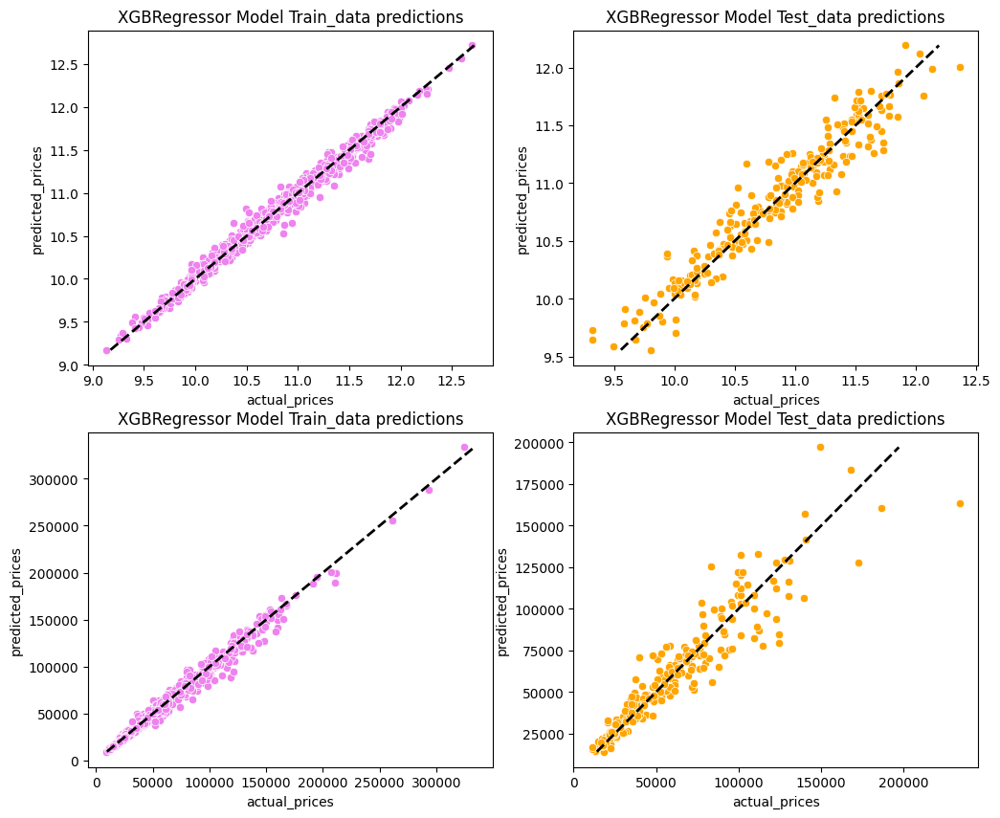

In [163]:
fig = plt.figure(figsize=(12,10))
a = [y_log_train,y_log_train_pred,y_log_test,y_log_test_pred]
b = [y_exp_train,y_exp_train_pred,y_exp_test,y_exp_test_pred]
plot_no = 1
for i in [a,b]:
    ax1 = fig.add_subplot(2,2,plot_no)
    sns.scatterplot(x=i[0],y=i[1],ax=ax1,color = 'violet')
    sns.lineplot(x=[i[1].min(),i[1].max()],y=[i[1].min(),i[1].max()],color = 'black',ls='--',lw=2,ax = ax1)
    ax1.set_xlabel('actual_prices')
    ax1.set_ylabel('predicted_prices')
    ax1.set_title(f'XGBRegressor Model Train_data predictions')
    ax2 = fig.add_subplot(2,2,plot_no+1)
    sns.scatterplot(x=i[2],y=i[3],ax=ax2,color = 'orange')
    sns.lineplot(x=[i[3].min(),i[3].max()],y=[i[3].min(),i[3].max()],color = 'black',ls = '--',lw = 2,ax = ax2)
    ax2.set_xlabel('actual_prices')
    ax2.set_ylabel('predicted_prices')
    ax2.set_title(f'XGBRegressor Model Test_data predictions')
    plot_no+=2

plt.show()

* The train predictions is almost a straight line but the test predictions has high deviation from stratight line as increase in price

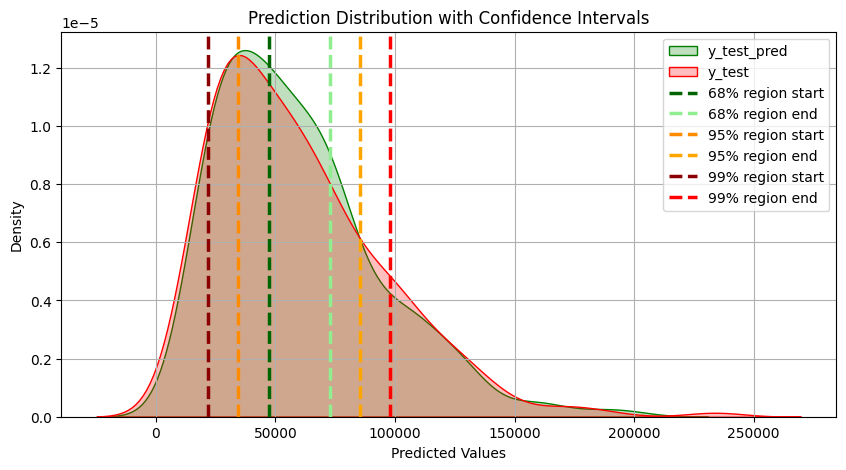

59863.94
47113.64977475376 72614.23303774625
34363.358143257516 85364.52466924248
21613.066511761266 98114.81630073873
 Percent within 1 SD (≈68%): 28.69%
 Percent within 1.645 SD (≈95%): 54.51%
 Percent within 1.926 SD (≈99%): 78.69%


In [164]:
test_rmse = metrics_exp['test_rmse']
# RMSE boundaries
sd_1 = test_rmse
sd_2 = 2 * test_rmse
sd_3 = 3 * test_rmse

# Create the KDE plot
plt.figure(figsize=(10, 5))
sns.kdeplot(data=y_exp_test_pred, color='green', fill=True,label= 'y_test_pred')
sns.kdeplot(data= y_exp_test,color = 'red',fill = True,label = 'y_test')

# Vertical lines for SDs
mean_pred = np.mean(y_exp_test_pred)

# Lines at mean ± sd_1
plt.axvline(x=mean_pred - sd_1, color='darkgreen', linestyle='--', linewidth=2.5, label='68% region start')
plt.axvline(x=mean_pred + sd_1, color='lightgreen', linestyle='--', linewidth=2.5, label='68% region end')
plt.axvline(x=mean_pred - sd_2, color='darkorange', linestyle='--', linewidth=2.5, label='95% region start')
plt.axvline(x=mean_pred + sd_2, color='orange', linestyle='--', linewidth=2.5, label='95% region end')
plt.axvline(x=mean_pred - sd_3, color='darkred', linestyle='--', linewidth=2.5, label='99% region start')
plt.axvline(x=mean_pred + sd_3, color='red', linestyle='--', linewidth=2.5, label='99% region end')


# Plot formatting
# plt.ylim(0, 1.6e-5)
plt.legend()
plt.title("Prediction Distribution with Confidence Intervals")
plt.xlabel("Predicted Values")
plt.ylabel("Density")
plt.grid(True)
plt.show()

# ✅ Now calculate how much data falls within each region
y_1 = np.array(y_exp_test_pred)

# Centered around the median or mean if needed (optional)
mean_pred = np.mean(y_1)
print(mean_pred)
within_1sd = np.mean((y_1 >= mean_pred - sd_1) & (y_1 <= mean_pred + sd_1))
within_2sd = np.mean((y_1 >= mean_pred - sd_2) & (y_1 <= mean_pred + sd_2))
within_3sd = np.mean((y_1 >= mean_pred - sd_3) & (y_1 <= mean_pred + sd_3))
print(mean_pred - sd_1,mean_pred +sd_1)
print(mean_pred - sd_2,mean_pred +sd_2)
print(mean_pred - sd_3,mean_pred +sd_3)


print(f" Percent within 1 SD (≈68%): {within_1sd*100:.2f}%")
print(f" Percent within 1.645 SD (≈95%): {within_2sd*100:.2f}%")
print(f" Percent within 1.926 SD (≈99%): {within_3sd*100:.2f}%")


* The above plot shows the distributions of y_exp_pred and y_exp_text. 
* Despite both distributions being skewed, there is a high degree of overlap between them, suggesting that the model's predictions align closely with the actual values in most cases. This high overlap indicates that the model is generally reliable in its predictions."

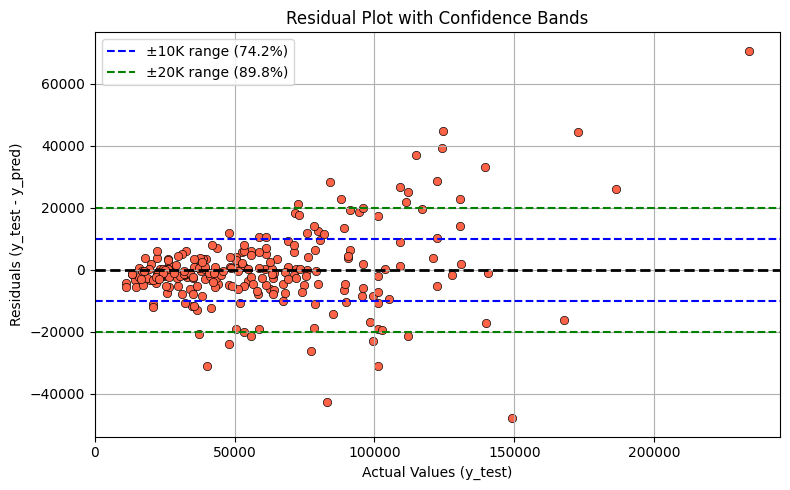

In [165]:
# Residuals
residuals = y_exp_test - y_exp_test_pred

# Computing percentages within 10k and 20k instead of using rmse for real world interpretation
total_points = len(residuals)
within_10k = np.sum((residuals >= -10000) & (residuals <= 10000)) / total_points * 100
within_20k = np.sum((residuals >= -20000) & (residuals <= 20000)) / total_points * 100




# Plot
plt.figure(figsize=(8, 5))
sns.scatterplot(x=y_exp_test, y=residuals, color='tomato', edgecolor='black')
plt.axhline(0, linestyle='--', color='black', linewidth=2)
plt.axhline(-10000, linestyle='--', color='blue', linewidth=1.5, label=f'±10K range ({within_10k:.1f}%)')
plt.axhline(10000, linestyle='--', color='blue', linewidth=1.5)
plt.axhline(-20000, linestyle='--', color='green', linewidth=1.5, label=f'±20K range ({within_20k:.1f}%)')
plt.axhline(20000, linestyle='--', color='green', linewidth=1.5)

plt.title("Residual Plot with Confidence Bands")
plt.xlabel("Actual Values (y_test)")
plt.ylabel("Residuals (y_test - y_pred)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
#

In [166]:
within_10k_price_below_1L = np.sum(((residuals>=-10000) & (residuals <= 10000) ) & (y_exp_test <=100000))/sum((y_exp_test<100000))
within_20k_price_below_1L = np.sum(((residuals>=-20000) & (residuals <= 20000) ) & (y_exp_test <=100000))/sum((y_exp_test<=100000))
within_10k_price_above_1L = np.sum(((residuals>=-10000) & (residuals <= 10000) ) & (y_exp_test > 100000))/sum((y_exp_test> 100000))
within_20k_price_above_1L = np.sum(((residuals>=-20000) & (residuals <= 20000) ) & (y_exp_test > 100000))/sum((y_exp_test> 100000))

print('The percentage of Low end laptops prediction that has error below 10,000 rs/- is :',round(within_10k_price_below_1L*100,2))
print('The percentage of Low end laptops prediction that has error below 20,000 rs/- is :',round(within_20k_price_below_1L*100,2))
print('The percentage of high end laptops prediction that has error below 10,000 rs/- is :',round(within_10k_price_above_1L*100,2))
print('The percentage of high end laptops prediction that has error below 20,000 rs/- is :',round(within_20k_price_above_1L*100,2))
print('\nThe percentage of Low end laptops prediction that has error above 20,000 rs/- is :',round(100-within_20k_price_below_1L*100,2))
print('The percentage of high end laptops prediction that has error above 20,000 rs/- is :',round(100-within_20k_price_above_1L*100,2))


The percentage of Low end laptops prediction that has error below 10,000 rs/- is : 81.34
The percentage of Low end laptops prediction that has error below 20,000 rs/- is : 95.22
The percentage of high end laptops prediction that has error below 10,000 rs/- is : 31.43
The percentage of high end laptops prediction that has error below 20,000 rs/- is : 57.14

The percentage of Low end laptops prediction that has error above 20,000 rs/- is : 4.78
The percentage of high end laptops prediction that has error above 20,000 rs/- is : 42.86


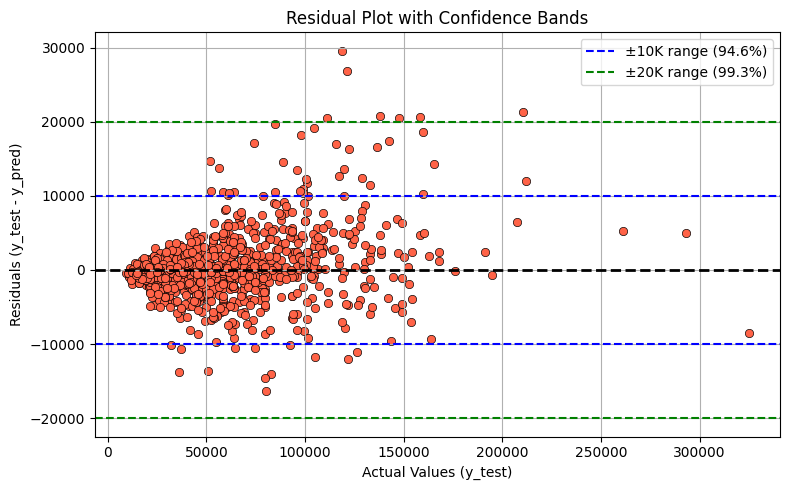

In [167]:
# Residuals
residuals = y_exp_train - y_exp_train_pred

# Compute percentages to plot 
total_points = len(residuals)
within_10k = np.sum((residuals >= -10000) & (residuals <= 10000)) / total_points * 100
within_20k = np.sum((residuals >= -20000) & (residuals <= 20000)) / total_points * 100

# other percentages to therotically understand the behaviour of low and high end laptops 


# Plot
plt.figure(figsize=(8, 5))
sns.scatterplot(x=y_exp_train, y=residuals, color='tomato', edgecolor='black')
plt.axhline(0, linestyle='--', color='black', linewidth=2)
plt.axhline(-10000, linestyle='--', color='blue', linewidth=1.5, label=f'±10K range ({within_10k:.1f}%)')
plt.axhline(10000, linestyle='--', color='blue', linewidth=1.5)
plt.axhline(-20000, linestyle='--', color='green', linewidth=1.5, label=f'±20K range ({within_20k:.1f}%)')
plt.axhline(20000, linestyle='--', color='green', linewidth=1.5)

plt.title("Residual Plot with Confidence Bands")
plt.xlabel("Actual Values (y_test)")
plt.ylabel("Residuals (y_test - y_pred)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
#

* Residual increase with higher prices indicating the model struggling with high-end laptop 
* The IQR of the actual prices (32,655-79813) suggests the model sees most data in this mid-range.
* Data scarcity for high priced laptops likely to lead poor generalization in that range.
* The residual spread appears heteroscedastic(variance increases with price) which suggests non-constant prediction error. 
* Despite stratified sampling, the model might need more high-price examples or price-sensitive features to improve performance.



### 3. MODEL INTERPRETATION & FEATURE CONTRIBUTION ANALYSIS

#### A) FEATURE IMPORTANCE

In [168]:
main_model_feature_importance_score = pd.Series(main_model.feature_importances_, index=X_train.columns)
main_model_feature_importance_score = main_model_feature_importance_score.sort_values(ascending=False)
main_model_feature_importance_score

ram               0.406864
typename          0.122373
ssd               0.112519
ppi               0.060801
clock_speed       0.050511
cpu_common        0.050492
flashstorage      0.041340
gpu_common        0.035621
company           0.023774
opsys             0.022722
hdd               0.015002
weight            0.014621
inches            0.014161
dual_memory       0.014149
is_touchscreen    0.012917
hybrid            0.002135
dtype: float32

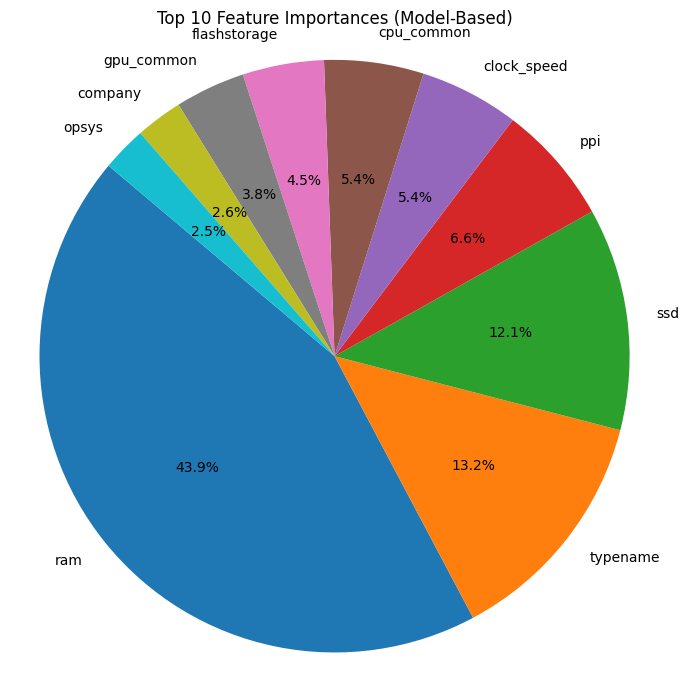

In [169]:


# Pie chart
plt.figure(figsize=(7, 7))
plt.pie(main_model_feature_importance_score[:10], labels=main_model_feature_importance_score.index[:10], autopct='%1.1f%%', startangle=140)
plt.title("Top 10 Feature Importances (Model-Based)")
plt.axis('equal')
plt.tight_layout()
plt.show()

* The pie chart of model-based feature importacne shows the top 10  contributors
    * ram contributes 44% 
    * typename contributes 13% 
    * ssd contributes 12.1% 
* Remaining feature contributes the reamining 30%

#### B) PERMUTATION IMPORTANCE

In [170]:
print('Model_name:',type(main_model))
perm_result = permutation_importance(main_model, X_train, y_log_train, scoring='r2', n_repeats=10, random_state=42)
perm_importance = pd.Series(perm_result.importances_mean, index=X_train.columns)
perm_importance = perm_importance.sort_values(ascending=False)
print(perm_importance)

Model_name: <class 'xgboost.sklearn.XGBRegressor'>
ram               0.161176
cpu_common        0.148104
gpu_common        0.079781
ssd               0.057245
ppi               0.056205
company           0.048271
typename          0.047647
weight            0.037973
clock_speed       0.035544
opsys             0.020959
inches            0.008333
hdd               0.005021
is_touchscreen    0.002079
flashstorage      0.001365
dual_memory       0.001325
hybrid            0.000023
dtype: float64


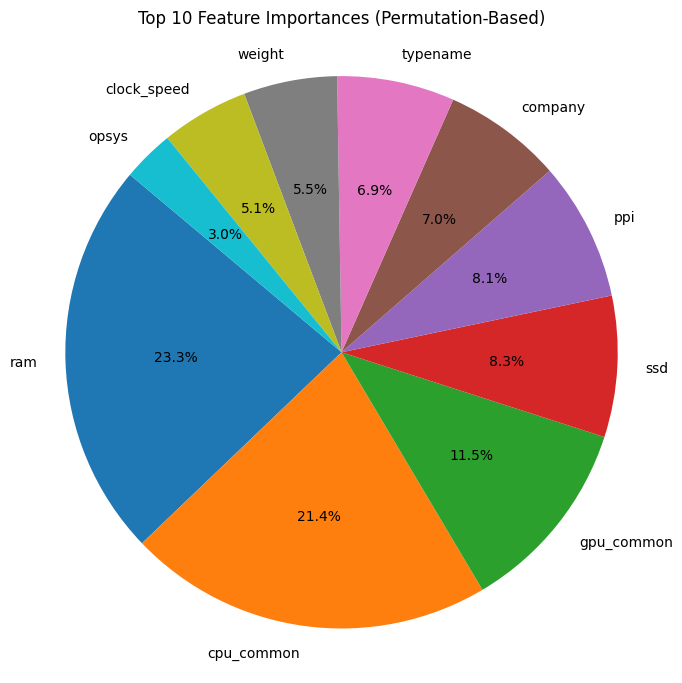

In [171]:
plt.figure(figsize=(7, 7))
plt.pie(perm_importance[:10], labels=perm_importance.index[:10], autopct='%1.1f%%', startangle=140)
plt.title("Top 10 Feature Importances (Permutation-Based)")
plt.axis('equal')
plt.tight_layout()
plt.show()

* The pie chart of permutation-based feature importacne shows the top 10  contributors
    * ram contributes 23% 
    * typename contributes 21% 
    * ssd contributes 11% 
* Remaining feature contributes the reamining 45%

#### C) SHAP ANALYSIS

 93%|=================== | 906/975 [00:19<00:01]       

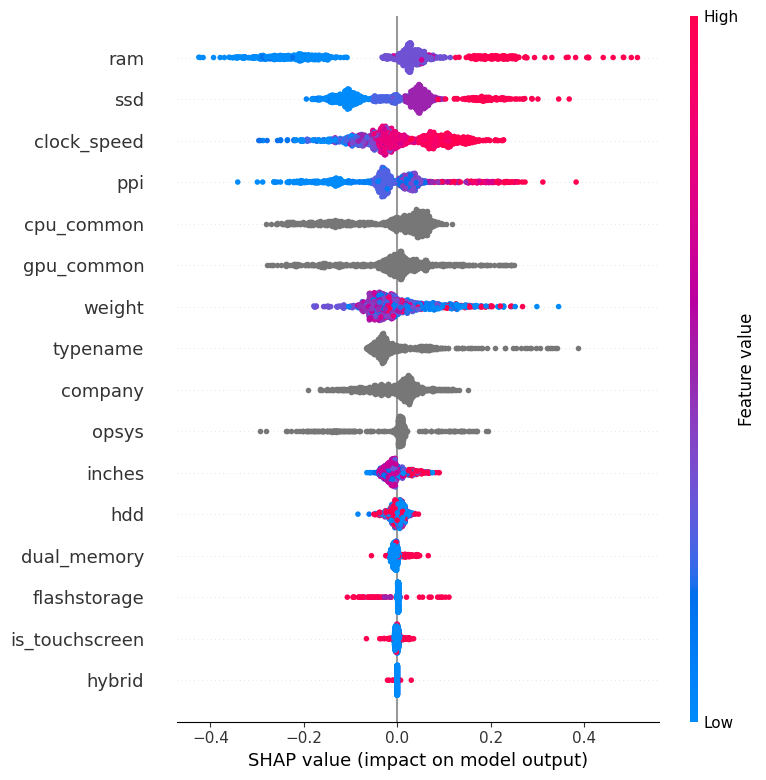

In [172]:
temp_X_train = X_train.astype('float')
temp_model = XGBRegressor(random_state=42,**final_best_params)
temp_model.fit(temp_X_train,y_log_train)
explainer = shap.Explainer(temp_model, temp_X_train)
shap_values = explainer(temp_X_train)

# Plot summary of feature importance
shap.summary_plot(shap_values, X_train)

* The ram, ssd, clockspeed and ppi are the top performing contributes wrt shap analysis

#### D) PARTIAL DEPENDENCY PLOT

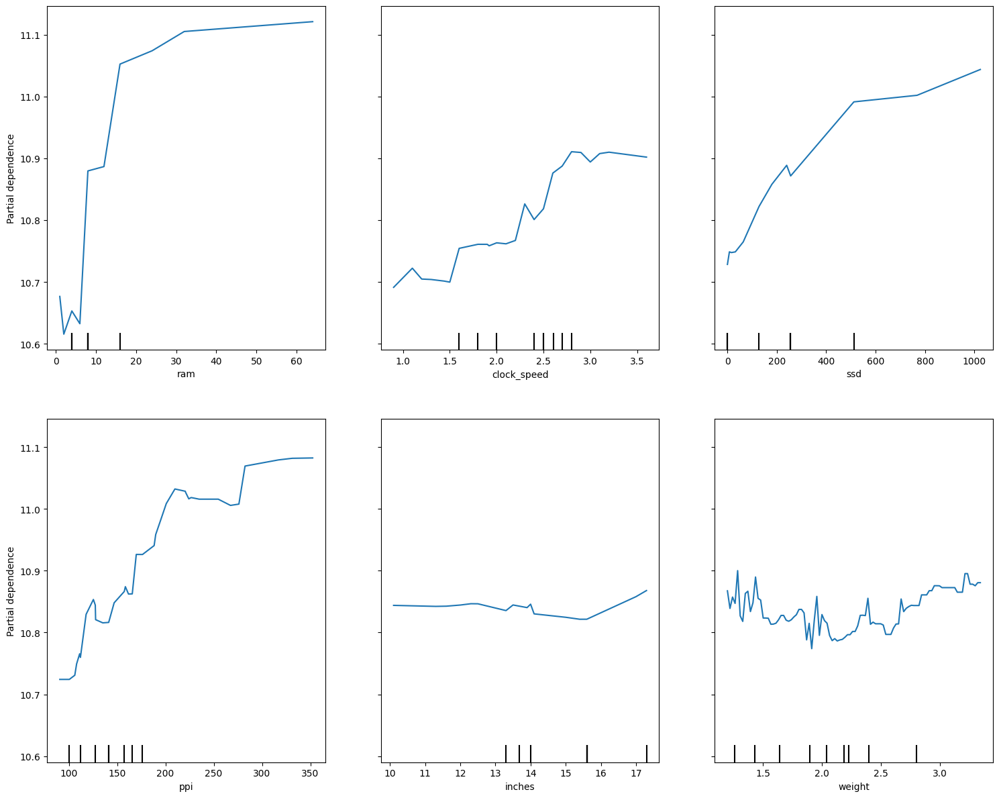

In [173]:
features_to_plot = ['ram','clock_speed','ssd','ppi','inches','weight']  # list of column names or column indices
fig, ax = plt.subplots(figsize=(15, 12))  
PartialDependenceDisplay.from_estimator(main_model, X_train, features_to_plot, ax=ax)
plt.tight_layout()
plt.show()

#### E) TREE PLOT TO VISUALIZE XGBREGRESSOR MODEL

* NOTE: there are a total of 200 estimators .i.e. we are building 200 Trees for the model 
* we are just visualizing the very first tree out of 200 trees.

In [ ]:

plt.figure(figsize=(20,10),dpi=900)
plot_tree(main_model, num_trees=0, rankdir='LR',ax=plt.gca())
plt.show()
# plt.savefig("xgb_tree.png", dpi=900)

<Figure size 640x480 with 0 Axes>

### 4. OVERALL CONCLUSION: MODEL IMPLEMENTATION & INTERPRETATION

From the above analysis and implementation steps, the following conclusions can be drawn:

---

##### Categorical Handling
- Since the confirmed model is **tree-based**, **ordinal encoding** was used for nominal features.
- After encoding, nominal features were cast to the `category` dtype.
- In the model configuration, `enable_categorical=True` was set to ensure the model does **not treat nominal features as ordered numerics**.

---

##### Model Optimization
- The following **optimum hyperparameters** were identified:
  - `max_depth = 6`
  - `n_estimators = 200`
  - `learning_rate = 0.07`
  - `colsample_bytree = 0.5`
  - `subsample = 0.8`
  - `gamma = 0`
  - `reg_alpha = 0`
  - `reg_lambda = 1`

---

##### Model Accuracy
- After applying **feature selection, hyperparameter tuning, and stratified sampling**, accuracy improved:
  - **Log-scale accuracy:** `0.90`
  - **Exp-scale accuracy:** `0.86`
- Before applying these methods:
  - **Log-scale accuracy:** `0.87`
  - **Exp-scale accuracy:** `0.83`
- ➕ These steps led to a **3% increase** in model performance.

---

##### Prediction Behavior
- Training predictions form an almost **perfect line**.
- Test predictions **deviate with increasing prices**, indicating struggles with high-end laptops.
- Distribution plots of `y_exp_pred` and `y_exp_text` show **high overlap**, despite skewness, suggesting the model is **generally reliable**.

---

##### Residual Analysis
**Low-End Laptops:**
- Error < ₹10,000: **81.34%**
- Error < ₹20,000: **95.22%**
- Error > ₹20,000: **4.78%**

**High-End Laptops:**
- Error < ₹10,000: **31.43%**
- Error < ₹20,000: **57.14%**
- Error > ₹20,000: **42.86%**

**Key Observations:**
- 🔺 Residuals **increase with price**, showing difficulty with high-end predictions.
- 🧮 IQR of actual prices: ₹32,655 – ₹79,813 → most data lies in the mid-range.
- ⚠️ Residual spread is **heteroscedastic** (variance increases with price).
- 📉 Stratified sampling helped, but **data scarcity at higher prices** limits generalization.

---

##### Feature Importance

**Model-Based (Top 3):**
- RAM: **44%**
- Typename: **13%**
- SSD: **12.1%**

**Permutation-Based (Top 3):**
- RAM: **23%**
- Typename: **21%**
- SSD: **11%**

**SHAP Analysis:**
- Top features: **RAM, SSD, ClockSpeed, PPI**

---


## X. SAVING, LOADING & REAL-TIME PREDICTIONS FROM THE MODEL

### 1. SAVING THE MODEL

In [175]:
# Saving the main_model encoder
joblib.dump(ordinal_encoding_main, 'encoder_mappings.pkl')
# Saving the main_model
joblib.dump(main_model, 'xgb_model.pkl')

['xgb_model.pkl']

In [176]:
# Saving the encoded data frame used for training and testing
pd.concat([X,y_log,y_exp],axis=1).to_csv('encoded_data')

### 2. LOADING THE MODEL

In [177]:
ordinal_encoding_loaded = joblib.load('encoder_mappings.pkl')

In [178]:
main_model_loaded = joblib.load('xgb_model.pkl')

In [179]:
y_log_train_pred = main_model_loaded.predict(X_train)
y_log_test_pred = main_model_loaded.predict(X_test)
# Calculating log Metrics
log_train_mae = mean_absolute_error(y_log_train, y_log_train_pred)
log_test_mae = mean_absolute_error(y_log_test, y_log_test_pred)
log_train_rmse = root_mean_squared_error(y_log_train,y_log_train_pred)
log_test_rmse = root_mean_squared_error(y_log_test, y_log_test_pred)
log_train_r2 = r2_score(y_log_train, y_log_train_pred)
log_test_r2 = r2_score(y_log_test, y_log_test_pred)

print(f"Train MAE: {log_train_mae:.2f}, Test MAE: {log_test_mae:.2f}")
print(f"Train RMSE: {log_train_rmse:.2f}, Test RMSE: {log_test_rmse:.2f}")

print(f"Train R²: {log_train_r2:.2f}, Test R²: {log_test_r2:.2f}")

Train MAE: 0.05, Test MAE: 0.13
Train RMSE: 0.07, Test RMSE: 0.17
Train R²: 0.99, Test R²: 0.92


In [180]:
y_exp_train_pred,y_exp_test_pred = np.exp(y_log_train_pred),np.exp(y_log_test_pred)
# Calculate Metrics
exp_train_mae = mean_absolute_error(y_exp_train, y_exp_train_pred)
exp_test_mae = mean_absolute_error(y_exp_test, y_exp_test_pred)
exp_train_rmse = root_mean_squared_error(y_exp_train,y_exp_train_pred)
exp_test_rmse = root_mean_squared_error(y_exp_test, y_exp_test_pred)
exp_train_r2 = r2_score(y_exp_train, y_exp_train_pred)
exp_test_r2 = r2_score(y_exp_test, y_exp_test_pred)

print(f"Train MAE: {exp_train_mae:.2f}, Test MAE: {exp_test_mae:.2f}")
print(f"Train RMSE: {exp_train_rmse:.2f}, Test RMSE: {exp_test_rmse:.2f}")

print(f"Train R²: {exp_train_r2:.2f}, Test R²: {exp_test_r2:.2f}")

Train MAE: 2943.64, Test MAE: 7981.27
Train RMSE: 4643.39, Test RMSE: 12750.29
Train R²: 0.99, Test R²: 0.87


### SAMPLE PREDICTIONS

In [181]:
def predict_results(model,input_X,y_true = None):
    y_log_pred = model.predict(input_X)
    y_exp_pred = np.exp(y_log_pred)
    if y_true:
        return {'y_pred_log':y_log_pred,
                'y_pred_log_max':y_log_pred+log_test_rmse,'y_pred_log_min':y_log_pred-log_test_rmse,
                'y_pred_org':y_exp_pred,
                'y_pred_org_max':y_exp_pred + exp_test_rmse, 'y_pred_org_min':y_exp_pred - exp_test_rmse,
                'y_true_log':y_true,'y_true_org':np.exp(y_true)}
    else:
        return {'y_pred_log':y_log_pred,
                'y_pred_log_max':y_log_pred+log_test_rmse,'y_pred_log_min':y_log_pred-log_test_rmse,
                'y_pred_org':y_exp_pred,
                'y_pred_org_max':y_exp_pred + exp_test_rmse, 'y_pred_org_min':y_exp_pred - exp_test_rmse}
    

In [182]:
input_X = np.array(X_test.iloc[15,:].values).reshape(1,-1)
y_true = y_log_test.iloc[15]
print(f'{input_X}')
print(y_true)

[[  7.     3.     5.    22.    24.     8.   256.     0.     0.     0.
    0.    15.6  141.21   0.     2.31   2.9 ]]
11.23889064370897


In [183]:
ordinal_encoding_loaded.inverse_transform(np.array([input_X[0,:5]]))

array([['HP', 'Notebook', 'Windows 10', 'other', 'other']], dtype=object)

In [184]:
print('predicted_results :')
result_metrics = predict_results(input_X=input_X,model=main_model,y_true = y_true)
for k,v in result_metrics.items():
    print(k,':',v)


predicted_results :
y_pred_log : [11.068292]
y_pred_log_max : [11.236654]
y_pred_log_min : [10.899929]
y_pred_org : [64105.902]
y_pred_org_max : [76856.195]
y_pred_org_min : [51355.61]
y_true_log : 11.23889064370897
y_true_org : 76030.56


### REAL-TIME PREDICTIONS

In [185]:
input_df = {'company':['Lenovo','HP','Apple'],
           'typename':['Notebook','Notebook','Notebook'],
           'opsys': ['Windows 10','Windows 10','macOS'],
           'cpu_common':['other','other','other'],
           'gpu_common':['other','other','other'],
           'ram':[16,16,16],
           'ssd':[512,1024,512],
           'hdd':[0,0,0],
           'flashstorage':[0,0,0],
           'hybrid':[0,0,0],
           'dual_memory':[0,0,0],
           'inches':[14,14,15.3],
           'screen_width':[1920,1920,2880],
           'screen_height':[1080,1080,1864],
           'weight':[1.7,1.41,1.51],
           'clock_speed':[4.7,4.7,3.7],
           'is_touchscreen':[0,0,0]
           }
input_df = pd.DataFrame(input_df)
input_df

,company,typename,opsys,cpu_common,gpu_common,ram,ssd,hdd,flashstorage,hybrid,dual_memory,inches,screen_width,screen_height,weight,clock_speed,is_touchscreen
0,Lenovo,Notebook,Windows 10,other,other,16,512,0,0,0,0,14.0,1920,1080,1.70,4.7,0
1,HP,Notebook,Windows 10,other,other,16,1024,0,0,0,0,14.0,1920,1080,1.41,4.7,0
2,Apple,Notebook,macOS,other,other,16,512,0,0,0,0,15.3,2880,1864,1.51,3.7,0


In [186]:
df['company'].unique()

array(['Apple', 'HP', 'Acer', 'Asus', 'Dell', 'Lenovo', 'Chuwi', 'MSI',
       'Microsoft', 'Toshiba', 'Huawei', 'Xiaomi', 'Vero', 'Razer',
       'Mediacom', 'Samsung', 'Google', 'Fujitsu', 'LG'], dtype=object)

In [187]:
def real_time_prediction(model,input_df):
    ordinal_encoding_array = ordinal_encoding_main.transform(input_df[['company','typename','opsys','cpu_common','gpu_common']])
    ordinal_encoding_df = pd.DataFrame(ordinal_encoding_array,columns = ['company','typename','opsys','cpu_common','gpu_common'])
    ordinal_encoding_df = ordinal_encoding_df.astype('category')
    input_df['ppi'] = round(((input_df['screen_width']**2 + input_df['screen_height']**2)**0.5)/input_df['inches'],2)
    final_numerical_columns = ['ram','ssd','hdd','flashstorage','hybrid','dual_memory',
                           'inches','ppi','is_touchscreen','weight','clock_speed',]
    input_df = pd.concat([ordinal_encoding_df,input_df[final_numerical_columns]],axis = 1)
    results = []
    for i in range(input_df.shape[0]):
        input_X = np.array(input_df.iloc[i,:].values).reshape(1,-1)
        result_metrics = predict_results(input_X=input_X,model=model)
        results.append(result_metrics)
    return results
results = real_time_prediction(model=main_model,input_df=input_df)

In [188]:
for i,result_metrics in enumerate(results):
    print(f'\n\nLaptop {i+1} results:')
    for k,v in result_metrics.items():
        print(k,':',v)



Laptop 1 results:
y_pred_log : [11.543547]
y_pred_log_max : [11.711909]
y_pred_log_min : [11.375184]
y_pred_org : [103109.484]
y_pred_org_max : [115859.77]
y_pred_org_min : [90359.195]


Laptop 2 results:
y_pred_log : [11.5311165]
y_pred_log_max : [11.699479]
y_pred_log_min : [11.362754]
y_pred_org : [101835.76]
y_pred_org_max : [114586.05]
y_pred_org_min : [89085.47]


Laptop 3 results:
y_pred_log : [11.790483]
y_pred_log_max : [11.958846]
y_pred_log_min : [11.622121]
y_pred_org : [131990.27]
y_pred_org_max : [144740.56]
y_pred_org_min : [119239.98]


Laptop1 : original_price: 44k predicted_price:60K

Laptop2 : original_price: 77k predicted_price:71k 

Laptop3 : original_price: 140k predicted_price:69k

## XI. INTERFACE DESIGN

In [189]:
def generate_model_input(*inputs,oe_encoder=ordinal_encoding_main):
    
    # Unpacking inputs
    (company, typename, opsys, cpu, gpu, 
    ram, dual_memory, memory1, memory1_size, memory2, memory2_size, 
    screen_inches, is_touchscreen, weight, 
    optional,screen_height, screen_width,clock_speed) = inputs

    # Extracting clock_speed early from the input
    if cpu != 'other':
        clock_speed = float(re.search(r'([\d\.]+)GHz',cpu).group(1))

    # Confiramtion message for inputs
    user_input = f"""### ✅ INPUT PARAMETERS SYSTEM ACCEPTED:\n
    **Company:** {company}  |  **Typename:** {typename}  |  **OpSys:** {opsys}  |  \
    **CPU:** {cpu}  |  **GPU:** {gpu}  |  **RAM:** {ram} GB  |  \
    **Primary Storage:** {memory1} ({memory1_size} GB)  |  **Secondary Storage:** {memory2} ({memory2_size} GB)  |  \
    **Dual Memory:** {dual_memory}  |  **Touchscreen:** {is_touchscreen}  |  **Screen Inches:** {screen_inches}  |  \
    **Weight:** {weight} kg  |  **Optionals:** {optional}  |  **Clock Speed:** {clock_speed} GHz  |  \
    **Screen Height:** {screen_height} px  |  **Screen Width:** {screen_width} px
    
    ---
    """


    #adjusting memory column
    memory = {'ssd':0,'hdd':0,'hybrid':0,'flashstorage':0}
    memory[memory1] = memory.get(memory1,0) + memory1_size
    if dual_memory:
        memory[memory2] = memory.get(memory2,0) + memory2_size 

    ppi = round((((screen_height**2)+(screen_width**2))**0.5)/screen_inches,2)
    
    num_cols = {'ram':ram,'inches':screen_inches,'clock_speed':clock_speed,'is_touchscreen':float(is_touchscreen),'ppi':ppi,
                'weight':weight,'dual_memory':float(dual_memory)}
    num_cols = {**num_cols,**memory}
    cat_df = pd.DataFrame([{'company':company,'typename':typename,'opsys':opsys,'cpu_common':cpu,'gpu_common':gpu}])
    num_df = pd.DataFrame([num_cols])
    oe_arr = oe_encoder.transform(cat_df)
    oe_df = pd.DataFrame(oe_arr,columns = cat_df.columns)
    input_df = pd.concat([oe_df,num_df],axis =1)
    # arranging in order
    input_df = input_df[X_train.columns]
    return user_input , input_df

In [190]:
inputs = ('HP','Notebook','Windows 10','Intel Core i7 7600U 2.8GHz','other',
          16,0,'ssd',1024,'hdd',0,
          14,0,1.41,
          0,1920,1080,2.8)
user_input,input_df = generate_model_input(*inputs)
print(user_input) 
input_df.head()

### ✅ INPUT PARAMETERS SYSTEM ACCEPTED:

    **Company:** HP  |  **Typename:** Notebook  |  **OpSys:** Windows 10  |      **CPU:** Intel Core i7 7600U 2.8GHz  |  **GPU:** other  |  **RAM:** 16 GB  |      **Primary Storage:** ssd (1024 GB)  |  **Secondary Storage:** hdd (0 GB)  |      **Dual Memory:** 0  |  **Touchscreen:** 0  |  **Screen Inches:** 14  |      **Weight:** 1.41 kg  |  **Optionals:** 0  |  **Clock Speed:** 2.8 GHz  |      **Screen Height:** 1920 px  |  **Screen Width:** 1080 px
    
    ---
    


,company,typename,opsys,cpu_common,gpu_common,ram,ssd,hdd,flashstorage,hybrid,dual_memory,inches,ppi,is_touchscreen,weight,clock_speed
0,7.0,3.0,5.0,17.0,24.0,16,1024,0,0,0,0.0,14,157.35,0.0,1.41,2.8


In [191]:
def predictions(input_df,model,avg_error): 
    y_pred_log = model.predict(input_df)
    # y_pred is in log scale converting back to original scale 
    predicted_price = np.exp(y_pred_log)[0]
    minimum_price = predicted_price - avg_error 
    maximum_price = predicted_price + avg_error 
    output_message = f"""**The predicted laptop price is ₹{float(predicted_price):.2f}**
    --

    Based on the model's average prediction error of ₹{avg_error:.2f}, the estimated price ranges are:

    - **70% Confidence Interval:** ₹{minimum_price:.2f} to ₹{maximum_price:.2f}  
    - **95% Confidence Interval:** ₹{(minimum_price - 0.96 * avg_error):.2f} to ₹{(maximum_price + 0.96 * avg_error):.2f}

    ⚠️ **Note:** For high-end laptops (price > ₹100,000), the confidence level may drop:
    - From ~70% to ~40% within ±1 standard error  
    - From ~95% to ~75% within ±2 standard errors

    ---
    """
    
    return y_pred_log,predicted_price,output_message

In [192]:
def gradio_logic(*inputs,model=main_model_loaded,oe_encoder=ordinal_encoding_main,avg_error=exp_test_rmse):
    input_message,input_df = generate_model_input(oe_encoder = oe_encoder,*inputs)
    input_dict = input_df.iloc[0].to_dict()
    model_input_message = f"""### ✅ INPUT FEATUES FED TO MODEL (EXTRACTED FROM USER INPUT):

    **Company:** {input_dict['company']}  |  **Typename:** {input_dict['typename']}  |  **OpSys:** {input_dict['opsys']}  |  \
    **CPU:** {input_dict['cpu_common']}  |  **GPU:** {input_dict['gpu_common']}  |  **RAM:** {input_dict['ram']} GB  |  \
    **SSD:** {input_dict['ssd']} (GB)  |  **HDD:** {input_dict['hdd']} (GB)  |  **flashstorage:** {input_dict['flashstorage']} (GB)  |  \
    **hybrid:** {input_dict['hybrid']} (GB)  |  **Dual Memory:** {input_dict['dual_memory']}  |  \
    **Touchscreen:** {input_dict['is_touchscreen']}  |  **Screen Inches:** {input_dict['inches']}  |  \
    **PPI:** {input_dict['ppi']}  |  **Weight:** {input_dict['weight']} kg  |  **Clock Speed:** {input_dict['clock_speed']} GHz
    
    ---
    """


    y_pred_log,predicted_price,output_message = predictions(input_df =input_df,model = model,avg_error=avg_error)    
    return output_message, input_message, model_input_message, 

In [193]:


company_list = sorted(df['company'].unique().tolist())
typename_list = df['typename'].unique().tolist()
opsys_list = df['opsys'].unique().tolist()
cpu_list = sorted(df['cpu_common'].unique().tolist())
gpu_list = sorted(df['gpu_common'].unique().tolist())
ram_list = sorted(df['ram'].unique().tolist())

memory_types = ["ssd", "hdd", "flashstorage", "hybrid"]




with gr.Blocks(theme = gr.themes.Citrus(spacing_size='sm', radius_size='lg', text_size='lg')) as demo:
    gr.Markdown("## 🧠 Laptop Configuration Prediction")

    with gr.Row(equal_height=True):
        with gr.Column(scale=2):
            company = gr.Dropdown(choices=company_list, label="Company",value = 'HP',info = "(default 'HP')")
            cpu = gr.Dropdown(choices = cpu_list,label = 'CPU',value = 'other',info = "(default 'other')")
            gpu = gr.Dropdown(choices = gpu_list,label = 'GPU',value = 'other',info = "(default 'other')")
            with gr.Row():
                memory1 = gr.Dropdown(choices=memory_types, label="Hard Drive 1",value = 'ssd',info = " (default 'SSD')")
                memory1_size = gr.Number(label="Memory Size 1 (in GB) (default 256GB)", precision=0,value = 256,
                                        info = "common examples: 256,512,1024,2048")
                



        with gr.Column(scale=3):
            typename = gr.Radio(choices=typename_list, label="Type",value = 'Notebook',info = "(default 'Notebook')")
            opsys = gr.Radio(choices = opsys_list,label = 'OpSys',value = 'Windows 10',info = "(default 'Windows 10)")
            ram = gr.Radio (choices = ram_list,label = 'RAM(GB)',value = 8,info = "(default 8GB)")

            with gr.Row():
                screen_inches = gr.Number(label="Screen Inches (default 15.6)",value = 15.6, precision=1)
                weight = gr.Number(label = "Weight (kg) (default 2.2 kg) ",value = 2.2,precision = 1,
                                   info = "(min 1kg else default value is accepted)")
    with gr.Row():
        dual_memory = gr.Checkbox(label="Enable Dual Memory")
        is_touchscreen = gr.Checkbox(label ="Touch Screen")
        optional = gr.Checkbox(label = 'Optionals (Screen Width, Screen Height, Clock Speed)',)
    with gr.Row():
        memory2 = gr.Dropdown(choices=memory_types, label="Hard Drive 2", value = 'ssd',info = "(default 'SSD')" ,visible=False)
        memory2_size = gr.Number(label="Memory Size 2 (in GB) (default 0 GB)", precision=0,value = 0, visible=False,
                                    info = "common examples: 256,512,1024,2048")
        screen_height = gr.Number(label ='Screen Height (default 1920)',value = 1920,precision =0,visible = False,
                                info = "*(Common examples: 1366, 1600, 1920, 2560, 3200, 3840)*")
        screen_width = gr.Number(label ='Screen Width (default 1080)',value = 1080,precision =0,visible = False,
                                info = "*(Common examples: 768, 900, 1440, 1080, 1900, 2160))*")
        clock_speed = gr.Number(label = "Clock Speed (default 2.8GHz for 'other' in cpu)",value = 2.8,precision = 1,visible = False,
                                info =("only enter the data if you select other in cpu else clock_speed is extracted from cpu input"))
    with gr.Row():
        submit_btn = gr.Button("Predict")
    with gr.Row():
        with gr.Column(scale=1):
            output_1 = gr.Markdown(label="input variables")
            output_2 = gr.Markdown(label ="Dataframe formed")
            output_3 = gr.Markdown(label = "predictions")

    def toggle_dual_memory(show):
        return {
            memory2: gr.update(visible=show),
            memory2_size: gr.update(visible=show),
        }
    def toggle_optional(show):
        return{
            screen_height: gr.update(visible = show),
            screen_width: gr.update(visible = show),
            clock_speed: gr.update(visible = show),
        }

    dual_memory.change(fn=toggle_dual_memory, inputs=dual_memory, outputs=[memory2, memory2_size])
    optional.change(fn = toggle_optional, inputs = optional, outputs = [screen_width,screen_height,clock_speed])
    submit_btn.click(fn=gradio_logic,
                     inputs=[company, typename, opsys, cpu, gpu, 
                             ram, dual_memory, memory1, memory1_size, memory2, memory2_size, 
                             screen_inches, is_touchscreen, weight, 
                             optional,screen_height, screen_width,clock_speed],
                     outputs=[output_1,output_2,output_3])
demo.launch()

* Running on local URL:  http://127.0.0.1:7860

To create a public link, set `share=True` in `launch()`.
